# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [3]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

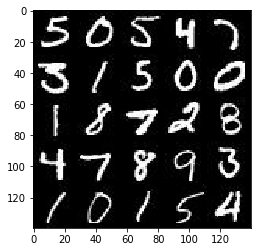

In [50]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

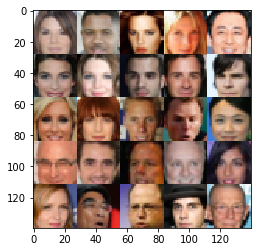

In [51]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [52]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [53]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels),'real_inputs')
    input_z = tf.placeholder(tf.float32, (None, z_dim), 'input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return real_inputs, input_z, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [54]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        output = tf.sigmoid(logits)
        
        
        #print ("discriminator - images shape: {}".format (images.shape))
        #print ("discriminator - x1 shape: {}".format (x1.shape))
        #print ("discriminator - x2 shape: {}".format (x2.shape))
        #print ("discriminator - x3 shape: {}".format (x3.shape))
        #print ("discriminator - logits shape: {}".format (logits.shape)) 
        
        return output, logits   
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [55]:
def generator(z, out_channel_dim, is_train=True, alpha = 0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
  
    # TODO: Implement Function
    reuse = not is_train

    with tf.variable_scope("generator", reuse = reuse):
        
        x1 = tf.layers.dense(z, 7*7*128)
        x1 = tf.reshape(x1, (-1, 7, 7, 128))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        relu1 = tf.maximum(0.3*bn1, bn1)
        
#        # img size is 7*7*128
        x2 = tf.layers.conv2d_transpose(relu1, 64, 3, strides=2, padding="same")
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        relu2 = tf.maximum(0.3*bn2, bn2)
        
        # img size is 14*14*64
        x3 = tf.layers.conv2d_transpose(relu2, 32, 3, strides=1, padding="same")
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        relu3 = tf.maximum(0.3*bn3, bn3)
        
         # img size is 14*14*32
        x4 = tf.layers.conv2d_transpose(relu3, 16, 3, strides=2, padding="same")
        bn4 = tf.layers.batch_normalization(x4, training=is_train)
        relu4 = tf.maximum(0.3*bn4, bn4)
        
#        # img size is 28*28*16
        logits = tf.layers.conv2d_transpose(relu4, out_channel_dim, 3, strides=1, padding="same")
        # img size is 28*28*out_channel_dim
        
        output = tf.tanh(logits)
        #print ("generator - z shape: {}".format (z.shape))
        #print ("generator - x1 shape: {}".format (x1.shape))
        #print ("generator - x2 shape: {}".format (x2.shape))
        #print ("generator - x3 shape: {}".format (x3.shape))
        #print ("generator - logits shape: {}".format (logits.shape))    
    
        return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [56]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)


    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [57]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt
    



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [58]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [61]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode ):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1) 
    
    steps = 0
    print_every = 1
    show_every = 10
    losses = []
    n_images = 25
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z,input_real: batch_images,lr: learning_rate})
                
                
                if steps % print_every == 0:      
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
                if steps % show_every == 1:
                    show_generator_output(sess,n_images, input_z, data_shape[3], data_image_mode)
 
                       
           # Save losses to view after training
           #losses.append((train_loss_d, train_loss_g))



    #return losses, samples    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 3.3540... Generator Loss: 7.5612


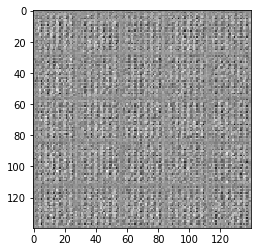

Epoch 1/2... Discriminator Loss: 16.7861... Generator Loss: 0.0002
Epoch 1/2... Discriminator Loss: 10.5772... Generator Loss: 0.0841
Epoch 1/2... Discriminator Loss: 6.6227... Generator Loss: 9.7045
Epoch 1/2... Discriminator Loss: 9.7297... Generator Loss: 0.0006
Epoch 1/2... Discriminator Loss: 2.9532... Generator Loss: 0.2367
Epoch 1/2... Discriminator Loss: 4.2240... Generator Loss: 4.3645
Epoch 1/2... Discriminator Loss: 3.2993... Generator Loss: 0.1564
Epoch 1/2... Discriminator Loss: 1.5167... Generator Loss: 0.9742
Epoch 1/2... Discriminator Loss: 1.5036... Generator Loss: 0.5421
Epoch 1/2... Discriminator Loss: 1.6496... Generator Loss: 0.7914


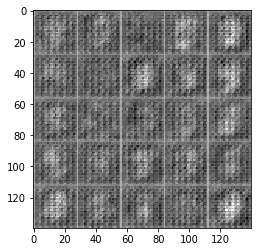

Epoch 1/2... Discriminator Loss: 1.7634... Generator Loss: 0.3488
Epoch 1/2... Discriminator Loss: 1.5144... Generator Loss: 3.1500
Epoch 1/2... Discriminator Loss: 3.1492... Generator Loss: 0.0878
Epoch 1/2... Discriminator Loss: 1.9621... Generator Loss: 1.3837
Epoch 1/2... Discriminator Loss: 2.6338... Generator Loss: 0.2301
Epoch 1/2... Discriminator Loss: 1.7695... Generator Loss: 2.2866
Epoch 1/2... Discriminator Loss: 2.0655... Generator Loss: 0.2193
Epoch 1/2... Discriminator Loss: 0.8610... Generator Loss: 2.5050
Epoch 1/2... Discriminator Loss: 3.3058... Generator Loss: 0.1627
Epoch 1/2... Discriminator Loss: 3.0922... Generator Loss: 2.8460


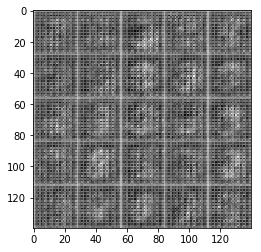

Epoch 1/2... Discriminator Loss: 2.5592... Generator Loss: 0.1293
Epoch 1/2... Discriminator Loss: 0.9939... Generator Loss: 6.2857
Epoch 1/2... Discriminator Loss: 0.3851... Generator Loss: 2.5291
Epoch 1/2... Discriminator Loss: 3.0611... Generator Loss: 0.1776
Epoch 1/2... Discriminator Loss: 1.5040... Generator Loss: 1.5890
Epoch 1/2... Discriminator Loss: 1.0971... Generator Loss: 0.7978
Epoch 1/2... Discriminator Loss: 0.8763... Generator Loss: 0.9781
Epoch 1/2... Discriminator Loss: 0.7714... Generator Loss: 1.2483
Epoch 1/2... Discriminator Loss: 0.7964... Generator Loss: 0.9932
Epoch 1/2... Discriminator Loss: 0.9096... Generator Loss: 0.9910


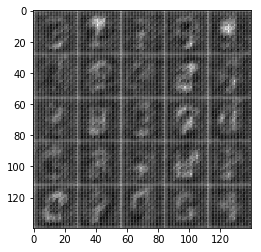

Epoch 1/2... Discriminator Loss: 1.2667... Generator Loss: 0.6393
Epoch 1/2... Discriminator Loss: 1.7716... Generator Loss: 1.3567
Epoch 1/2... Discriminator Loss: 2.7067... Generator Loss: 0.0862
Epoch 1/2... Discriminator Loss: 2.7629... Generator Loss: 7.2255
Epoch 1/2... Discriminator Loss: 2.1468... Generator Loss: 0.2725
Epoch 1/2... Discriminator Loss: 1.2072... Generator Loss: 1.0805
Epoch 1/2... Discriminator Loss: 1.5013... Generator Loss: 0.5880
Epoch 1/2... Discriminator Loss: 1.3448... Generator Loss: 0.8583
Epoch 1/2... Discriminator Loss: 1.5944... Generator Loss: 0.8554
Epoch 1/2... Discriminator Loss: 2.2720... Generator Loss: 0.1886


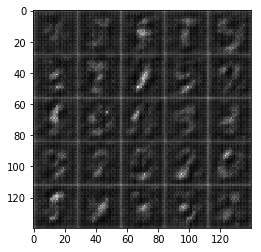

Epoch 1/2... Discriminator Loss: 5.3319... Generator Loss: 5.3482
Epoch 1/2... Discriminator Loss: 2.1692... Generator Loss: 0.1739
Epoch 1/2... Discriminator Loss: 0.9237... Generator Loss: 1.7571
Epoch 1/2... Discriminator Loss: 0.9174... Generator Loss: 1.2048
Epoch 1/2... Discriminator Loss: 1.1424... Generator Loss: 0.5163
Epoch 1/2... Discriminator Loss: 1.2816... Generator Loss: 1.6007
Epoch 1/2... Discriminator Loss: 1.7392... Generator Loss: 0.2634
Epoch 1/2... Discriminator Loss: 1.8240... Generator Loss: 1.7444
Epoch 1/2... Discriminator Loss: 1.9041... Generator Loss: 0.2416
Epoch 1/2... Discriminator Loss: 1.4360... Generator Loss: 2.0542


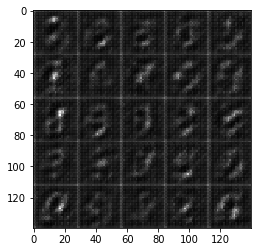

Epoch 1/2... Discriminator Loss: 1.3815... Generator Loss: 0.4345
Epoch 1/2... Discriminator Loss: 0.9801... Generator Loss: 1.6921
Epoch 1/2... Discriminator Loss: 1.2718... Generator Loss: 0.4750
Epoch 1/2... Discriminator Loss: 1.3175... Generator Loss: 1.9794
Epoch 1/2... Discriminator Loss: 1.8767... Generator Loss: 0.2111
Epoch 1/2... Discriminator Loss: 1.4911... Generator Loss: 3.3110
Epoch 1/2... Discriminator Loss: 0.9019... Generator Loss: 0.6949
Epoch 1/2... Discriminator Loss: 0.5165... Generator Loss: 1.6059
Epoch 1/2... Discriminator Loss: 0.6178... Generator Loss: 1.3517
Epoch 1/2... Discriminator Loss: 0.7756... Generator Loss: 0.9062


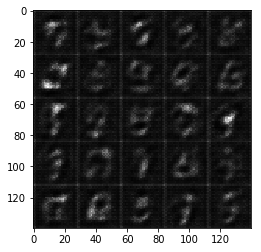

Epoch 1/2... Discriminator Loss: 1.1922... Generator Loss: 3.5827
Epoch 1/2... Discriminator Loss: 4.2425... Generator Loss: 0.0165
Epoch 1/2... Discriminator Loss: 3.2051... Generator Loss: 5.9150
Epoch 1/2... Discriminator Loss: 0.9287... Generator Loss: 0.7266
Epoch 1/2... Discriminator Loss: 0.8608... Generator Loss: 0.8386
Epoch 1/2... Discriminator Loss: 0.9886... Generator Loss: 2.0390
Epoch 1/2... Discriminator Loss: 0.9060... Generator Loss: 0.6875
Epoch 1/2... Discriminator Loss: 0.7443... Generator Loss: 1.7888
Epoch 1/2... Discriminator Loss: 0.7289... Generator Loss: 0.8629
Epoch 1/2... Discriminator Loss: 0.4942... Generator Loss: 2.6786


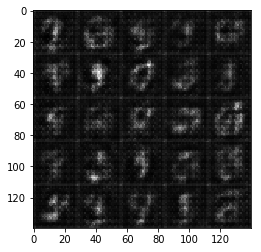

Epoch 1/2... Discriminator Loss: 0.4498... Generator Loss: 1.2155
Epoch 1/2... Discriminator Loss: 0.2526... Generator Loss: 2.2147
Epoch 1/2... Discriminator Loss: 0.2112... Generator Loss: 2.2781
Epoch 1/2... Discriminator Loss: 0.1680... Generator Loss: 2.3575
Epoch 1/2... Discriminator Loss: 0.1621... Generator Loss: 2.3842
Epoch 1/2... Discriminator Loss: 0.2453... Generator Loss: 1.9694
Epoch 1/2... Discriminator Loss: 0.3067... Generator Loss: 2.2017
Epoch 1/2... Discriminator Loss: 0.2873... Generator Loss: 1.7969
Epoch 1/2... Discriminator Loss: 0.7523... Generator Loss: 9.0632
Epoch 1/2... Discriminator Loss: 6.0938... Generator Loss: 0.0036


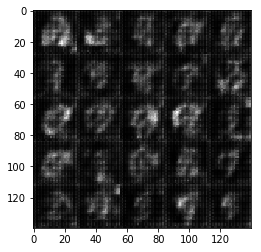

Epoch 1/2... Discriminator Loss: 2.5514... Generator Loss: 3.7484
Epoch 1/2... Discriminator Loss: 6.3155... Generator Loss: 0.0045
Epoch 1/2... Discriminator Loss: 2.7751... Generator Loss: 4.7347
Epoch 1/2... Discriminator Loss: 2.0296... Generator Loss: 0.9548
Epoch 1/2... Discriminator Loss: 1.5984... Generator Loss: 0.4429
Epoch 1/2... Discriminator Loss: 0.9994... Generator Loss: 1.5726
Epoch 1/2... Discriminator Loss: 0.7929... Generator Loss: 1.7956
Epoch 1/2... Discriminator Loss: 0.7506... Generator Loss: 1.0124
Epoch 1/2... Discriminator Loss: 0.6424... Generator Loss: 1.1920
Epoch 1/2... Discriminator Loss: 0.9155... Generator Loss: 1.1304


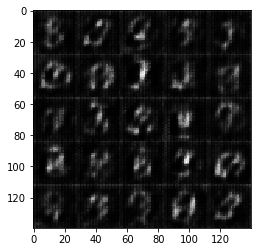

Epoch 1/2... Discriminator Loss: 1.2787... Generator Loss: 0.6624
Epoch 1/2... Discriminator Loss: 1.1764... Generator Loss: 1.2021
Epoch 1/2... Discriminator Loss: 0.9999... Generator Loss: 0.6832
Epoch 1/2... Discriminator Loss: 1.5329... Generator Loss: 3.3223
Epoch 1/2... Discriminator Loss: 2.2841... Generator Loss: 0.1498
Epoch 1/2... Discriminator Loss: 1.2374... Generator Loss: 3.5833
Epoch 1/2... Discriminator Loss: 1.4219... Generator Loss: 0.3719
Epoch 1/2... Discriminator Loss: 1.2800... Generator Loss: 4.0260
Epoch 1/2... Discriminator Loss: 1.3331... Generator Loss: 0.3723
Epoch 1/2... Discriminator Loss: 0.4515... Generator Loss: 4.7289


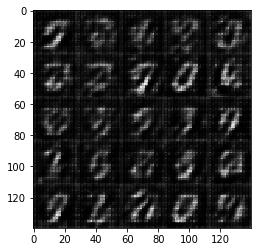

Epoch 1/2... Discriminator Loss: 0.2100... Generator Loss: 2.6691
Epoch 1/2... Discriminator Loss: 0.9009... Generator Loss: 0.6506
Epoch 1/2... Discriminator Loss: 2.2291... Generator Loss: 6.1362
Epoch 1/2... Discriminator Loss: 3.2500... Generator Loss: 0.0487
Epoch 1/2... Discriminator Loss: 0.9850... Generator Loss: 0.6330
Epoch 1/2... Discriminator Loss: 2.7494... Generator Loss: 5.0863
Epoch 1/2... Discriminator Loss: 0.8818... Generator Loss: 0.8541
Epoch 1/2... Discriminator Loss: 0.9535... Generator Loss: 0.6620
Epoch 1/2... Discriminator Loss: 1.1006... Generator Loss: 3.6139
Epoch 1/2... Discriminator Loss: 1.9798... Generator Loss: 0.1865


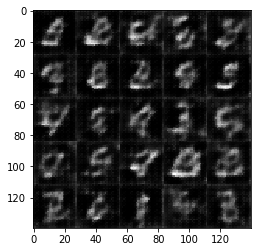

Epoch 1/2... Discriminator Loss: 1.2082... Generator Loss: 4.8087
Epoch 1/2... Discriminator Loss: 0.3495... Generator Loss: 1.6467
Epoch 1/2... Discriminator Loss: 0.6855... Generator Loss: 0.8759
Epoch 1/2... Discriminator Loss: 0.4080... Generator Loss: 3.4560
Epoch 1/2... Discriminator Loss: 0.2457... Generator Loss: 2.3918
Epoch 1/2... Discriminator Loss: 0.3651... Generator Loss: 1.6948
Epoch 1/2... Discriminator Loss: 0.2123... Generator Loss: 3.3249
Epoch 1/2... Discriminator Loss: 0.2627... Generator Loss: 1.9884
Epoch 1/2... Discriminator Loss: 0.2440... Generator Loss: 2.4672
Epoch 1/2... Discriminator Loss: 0.4471... Generator Loss: 1.3590


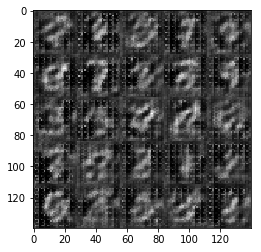

Epoch 1/2... Discriminator Loss: 1.0977... Generator Loss: 5.2615
Epoch 1/2... Discriminator Loss: 4.5069... Generator Loss: 0.0169
Epoch 1/2... Discriminator Loss: 1.1942... Generator Loss: 1.4809
Epoch 1/2... Discriminator Loss: 2.1408... Generator Loss: 1.0360
Epoch 1/2... Discriminator Loss: 2.1539... Generator Loss: 0.2121
Epoch 1/2... Discriminator Loss: 1.5083... Generator Loss: 2.0097
Epoch 1/2... Discriminator Loss: 0.9981... Generator Loss: 0.7315
Epoch 1/2... Discriminator Loss: 0.7161... Generator Loss: 1.1277
Epoch 1/2... Discriminator Loss: 0.9489... Generator Loss: 1.2872
Epoch 1/2... Discriminator Loss: 1.0203... Generator Loss: 0.8480


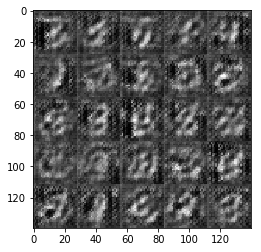

Epoch 1/2... Discriminator Loss: 1.0684... Generator Loss: 1.6930
Epoch 1/2... Discriminator Loss: 2.0481... Generator Loss: 0.1934
Epoch 1/2... Discriminator Loss: 3.7081... Generator Loss: 6.5654
Epoch 1/2... Discriminator Loss: 1.3650... Generator Loss: 0.3779
Epoch 1/2... Discriminator Loss: 0.8071... Generator Loss: 0.7853
Epoch 1/2... Discriminator Loss: 1.6161... Generator Loss: 2.7098
Epoch 1/2... Discriminator Loss: 1.7950... Generator Loss: 0.2682
Epoch 1/2... Discriminator Loss: 1.5259... Generator Loss: 2.6764
Epoch 1/2... Discriminator Loss: 2.1161... Generator Loss: 0.1779
Epoch 1/2... Discriminator Loss: 2.0859... Generator Loss: 3.2119


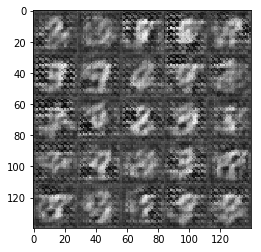

Epoch 1/2... Discriminator Loss: 1.8681... Generator Loss: 0.2375
Epoch 1/2... Discriminator Loss: 0.7744... Generator Loss: 1.6393
Epoch 1/2... Discriminator Loss: 0.8299... Generator Loss: 1.4363
Epoch 1/2... Discriminator Loss: 1.1874... Generator Loss: 0.6261
Epoch 1/2... Discriminator Loss: 1.1566... Generator Loss: 1.0050
Epoch 1/2... Discriminator Loss: 1.0287... Generator Loss: 1.2853
Epoch 1/2... Discriminator Loss: 0.4970... Generator Loss: 2.0558
Epoch 1/2... Discriminator Loss: 0.1702... Generator Loss: 3.1495
Epoch 1/2... Discriminator Loss: 0.2908... Generator Loss: 1.7198
Epoch 1/2... Discriminator Loss: 0.2308... Generator Loss: 2.1171


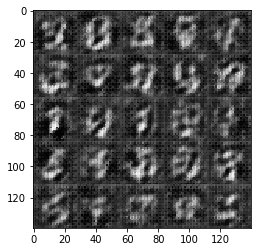

Epoch 1/2... Discriminator Loss: 0.2460... Generator Loss: 3.2388
Epoch 1/2... Discriminator Loss: 0.3268... Generator Loss: 1.5587
Epoch 1/2... Discriminator Loss: 0.2249... Generator Loss: 2.7704
Epoch 1/2... Discriminator Loss: 0.2283... Generator Loss: 2.5351
Epoch 1/2... Discriminator Loss: 0.6372... Generator Loss: 0.9632
Epoch 1/2... Discriminator Loss: 2.3532... Generator Loss: 5.8486
Epoch 1/2... Discriminator Loss: 4.1320... Generator Loss: 0.0211
Epoch 1/2... Discriminator Loss: 1.3426... Generator Loss: 1.0242
Epoch 1/2... Discriminator Loss: 1.9326... Generator Loss: 1.7418
Epoch 1/2... Discriminator Loss: 1.6983... Generator Loss: 0.3498


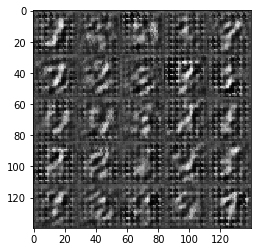

Epoch 1/2... Discriminator Loss: 1.0399... Generator Loss: 0.9814
Epoch 1/2... Discriminator Loss: 0.9848... Generator Loss: 1.5151
Epoch 1/2... Discriminator Loss: 0.8961... Generator Loss: 0.7458
Epoch 1/2... Discriminator Loss: 0.8200... Generator Loss: 1.0760
Epoch 1/2... Discriminator Loss: 0.9602... Generator Loss: 1.4027
Epoch 1/2... Discriminator Loss: 1.1334... Generator Loss: 0.6012
Epoch 1/2... Discriminator Loss: 1.2482... Generator Loss: 1.9143
Epoch 1/2... Discriminator Loss: 1.5012... Generator Loss: 0.3510
Epoch 1/2... Discriminator Loss: 1.2125... Generator Loss: 1.7003
Epoch 1/2... Discriminator Loss: 1.4941... Generator Loss: 0.3825


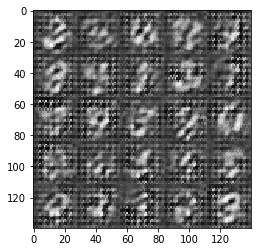

Epoch 1/2... Discriminator Loss: 1.4364... Generator Loss: 1.4984
Epoch 1/2... Discriminator Loss: 1.4401... Generator Loss: 0.4031
Epoch 1/2... Discriminator Loss: 1.4584... Generator Loss: 2.3471
Epoch 1/2... Discriminator Loss: 1.4304... Generator Loss: 0.3691
Epoch 1/2... Discriminator Loss: 1.0666... Generator Loss: 1.5656
Epoch 1/2... Discriminator Loss: 1.2003... Generator Loss: 0.6712
Epoch 1/2... Discriminator Loss: 1.2031... Generator Loss: 0.7212
Epoch 1/2... Discriminator Loss: 1.2407... Generator Loss: 1.3676
Epoch 1/2... Discriminator Loss: 1.2693... Generator Loss: 0.4505
Epoch 1/2... Discriminator Loss: 1.4957... Generator Loss: 2.7234


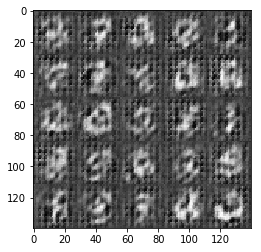

Epoch 1/2... Discriminator Loss: 1.5578... Generator Loss: 0.2723
Epoch 1/2... Discriminator Loss: 0.7973... Generator Loss: 1.5642
Epoch 1/2... Discriminator Loss: 1.0580... Generator Loss: 1.4265
Epoch 1/2... Discriminator Loss: 1.2252... Generator Loss: 0.4961
Epoch 1/2... Discriminator Loss: 1.4260... Generator Loss: 2.3974
Epoch 1/2... Discriminator Loss: 1.4134... Generator Loss: 0.3397
Epoch 1/2... Discriminator Loss: 0.8600... Generator Loss: 1.8191
Epoch 1/2... Discriminator Loss: 0.8961... Generator Loss: 0.8100
Epoch 1/2... Discriminator Loss: 1.0300... Generator Loss: 0.9791
Epoch 1/2... Discriminator Loss: 1.0238... Generator Loss: 1.4202


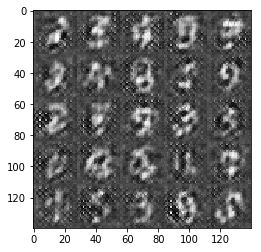

Epoch 1/2... Discriminator Loss: 1.3490... Generator Loss: 0.3691
Epoch 1/2... Discriminator Loss: 1.4554... Generator Loss: 2.8536
Epoch 1/2... Discriminator Loss: 1.4615... Generator Loss: 0.3214
Epoch 1/2... Discriminator Loss: 1.0055... Generator Loss: 1.8651
Epoch 1/2... Discriminator Loss: 1.0875... Generator Loss: 0.6311
Epoch 1/2... Discriminator Loss: 1.1083... Generator Loss: 1.6761
Epoch 1/2... Discriminator Loss: 1.0867... Generator Loss: 0.5960
Epoch 1/2... Discriminator Loss: 0.7677... Generator Loss: 2.2215
Epoch 1/2... Discriminator Loss: 1.1158... Generator Loss: 0.5022
Epoch 1/2... Discriminator Loss: 0.9712... Generator Loss: 1.8177


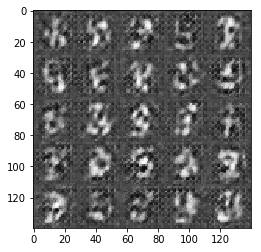

Epoch 1/2... Discriminator Loss: 1.1334... Generator Loss: 0.5820
Epoch 1/2... Discriminator Loss: 2.1774... Generator Loss: 1.7641
Epoch 1/2... Discriminator Loss: 1.5472... Generator Loss: 0.3055
Epoch 1/2... Discriminator Loss: 5.0511... Generator Loss: 5.4587
Epoch 1/2... Discriminator Loss: 1.2253... Generator Loss: 0.5043
Epoch 1/2... Discriminator Loss: 1.2284... Generator Loss: 0.4855
Epoch 1/2... Discriminator Loss: 1.3954... Generator Loss: 1.6286
Epoch 1/2... Discriminator Loss: 1.1140... Generator Loss: 0.7276
Epoch 1/2... Discriminator Loss: 1.1531... Generator Loss: 0.7444
Epoch 1/2... Discriminator Loss: 1.3025... Generator Loss: 1.4347


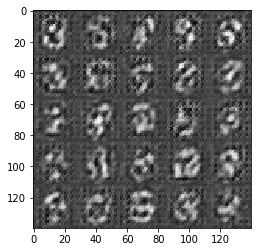

Epoch 1/2... Discriminator Loss: 1.1964... Generator Loss: 0.6101
Epoch 1/2... Discriminator Loss: 1.1185... Generator Loss: 1.0732
Epoch 1/2... Discriminator Loss: 1.2077... Generator Loss: 0.7503
Epoch 1/2... Discriminator Loss: 1.2049... Generator Loss: 0.7985
Epoch 1/2... Discriminator Loss: 1.1645... Generator Loss: 1.0810
Epoch 1/2... Discriminator Loss: 1.2553... Generator Loss: 0.5753
Epoch 1/2... Discriminator Loss: 1.1836... Generator Loss: 1.3458
Epoch 1/2... Discriminator Loss: 1.1536... Generator Loss: 0.5892
Epoch 1/2... Discriminator Loss: 1.1283... Generator Loss: 1.4992
Epoch 1/2... Discriminator Loss: 1.2317... Generator Loss: 0.5427


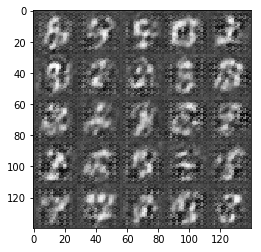

Epoch 1/2... Discriminator Loss: 1.0070... Generator Loss: 1.4534
Epoch 1/2... Discriminator Loss: 0.9914... Generator Loss: 0.7491
Epoch 1/2... Discriminator Loss: 0.9157... Generator Loss: 1.5136
Epoch 1/2... Discriminator Loss: 1.1393... Generator Loss: 0.5392
Epoch 1/2... Discriminator Loss: 1.2769... Generator Loss: 2.1479
Epoch 1/2... Discriminator Loss: 2.0588... Generator Loss: 0.1653
Epoch 1/2... Discriminator Loss: 1.3765... Generator Loss: 2.5015
Epoch 1/2... Discriminator Loss: 1.0336... Generator Loss: 0.7493
Epoch 1/2... Discriminator Loss: 1.0680... Generator Loss: 0.7319
Epoch 1/2... Discriminator Loss: 1.0514... Generator Loss: 1.0511


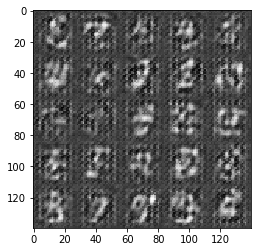

Epoch 1/2... Discriminator Loss: 1.1993... Generator Loss: 0.5805
Epoch 1/2... Discriminator Loss: 0.9509... Generator Loss: 1.9201
Epoch 1/2... Discriminator Loss: 1.2854... Generator Loss: 0.4194
Epoch 1/2... Discriminator Loss: 0.7374... Generator Loss: 2.0148
Epoch 1/2... Discriminator Loss: 0.6920... Generator Loss: 1.0767
Epoch 1/2... Discriminator Loss: 0.7062... Generator Loss: 1.0045
Epoch 1/2... Discriminator Loss: 0.6556... Generator Loss: 1.4482
Epoch 1/2... Discriminator Loss: 0.8565... Generator Loss: 0.7447
Epoch 1/2... Discriminator Loss: 0.6408... Generator Loss: 1.3824
Epoch 1/2... Discriminator Loss: 0.9238... Generator Loss: 0.7158


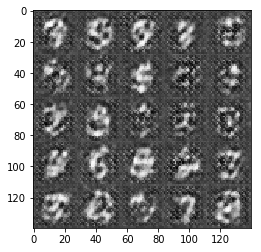

Epoch 1/2... Discriminator Loss: 0.8274... Generator Loss: 1.0192
Epoch 1/2... Discriminator Loss: 0.6257... Generator Loss: 1.5433
Epoch 1/2... Discriminator Loss: 1.8861... Generator Loss: 0.2287
Epoch 1/2... Discriminator Loss: 2.1469... Generator Loss: 5.1578
Epoch 1/2... Discriminator Loss: 1.5200... Generator Loss: 0.3357
Epoch 1/2... Discriminator Loss: 2.3550... Generator Loss: 2.0795
Epoch 1/2... Discriminator Loss: 1.8057... Generator Loss: 0.2118
Epoch 1/2... Discriminator Loss: 1.0834... Generator Loss: 2.1783
Epoch 1/2... Discriminator Loss: 1.5960... Generator Loss: 0.4283
Epoch 1/2... Discriminator Loss: 2.0846... Generator Loss: 0.4265


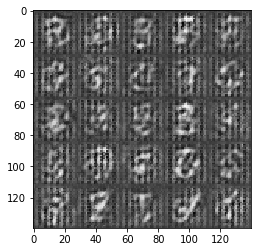

Epoch 1/2... Discriminator Loss: 1.3687... Generator Loss: 1.4967
Epoch 1/2... Discriminator Loss: 1.3568... Generator Loss: 0.4689
Epoch 1/2... Discriminator Loss: 1.0574... Generator Loss: 1.1888
Epoch 1/2... Discriminator Loss: 1.0087... Generator Loss: 0.9172
Epoch 1/2... Discriminator Loss: 1.0523... Generator Loss: 0.7639
Epoch 1/2... Discriminator Loss: 1.0051... Generator Loss: 1.2513
Epoch 1/2... Discriminator Loss: 1.0442... Generator Loss: 0.6518
Epoch 1/2... Discriminator Loss: 1.0315... Generator Loss: 1.2334
Epoch 1/2... Discriminator Loss: 1.3213... Generator Loss: 0.6215
Epoch 1/2... Discriminator Loss: 1.0807... Generator Loss: 0.9450


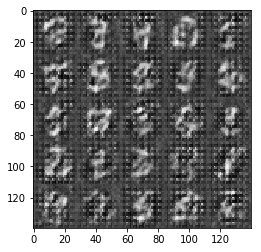

Epoch 1/2... Discriminator Loss: 0.9948... Generator Loss: 1.0232
Epoch 1/2... Discriminator Loss: 1.1594... Generator Loss: 0.5906
Epoch 1/2... Discriminator Loss: 1.1420... Generator Loss: 1.7959
Epoch 1/2... Discriminator Loss: 1.2611... Generator Loss: 0.4386
Epoch 1/2... Discriminator Loss: 0.9875... Generator Loss: 1.8072
Epoch 1/2... Discriminator Loss: 0.9411... Generator Loss: 0.7129
Epoch 1/2... Discriminator Loss: 0.7931... Generator Loss: 1.3026
Epoch 1/2... Discriminator Loss: 1.1101... Generator Loss: 0.6380
Epoch 1/2... Discriminator Loss: 1.1104... Generator Loss: 1.0726
Epoch 1/2... Discriminator Loss: 0.8765... Generator Loss: 0.7803


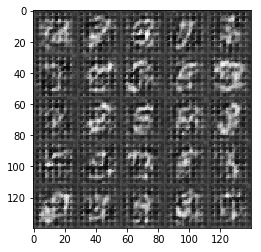

Epoch 1/2... Discriminator Loss: 0.8085... Generator Loss: 1.1582
Epoch 1/2... Discriminator Loss: 0.8417... Generator Loss: 0.9086
Epoch 1/2... Discriminator Loss: 0.7754... Generator Loss: 1.0811
Epoch 1/2... Discriminator Loss: 0.7058... Generator Loss: 1.0644
Epoch 1/2... Discriminator Loss: 0.9096... Generator Loss: 0.6932
Epoch 1/2... Discriminator Loss: 0.7515... Generator Loss: 2.0303
Epoch 1/2... Discriminator Loss: 1.5694... Generator Loss: 0.2930
Epoch 1/2... Discriminator Loss: 0.9727... Generator Loss: 3.2113
Epoch 1/2... Discriminator Loss: 2.0934... Generator Loss: 0.1782
Epoch 1/2... Discriminator Loss: 1.6321... Generator Loss: 3.7241


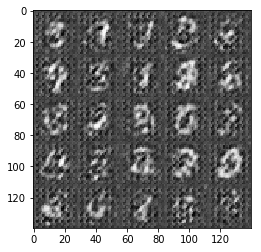

Epoch 1/2... Discriminator Loss: 0.7479... Generator Loss: 1.3277
Epoch 1/2... Discriminator Loss: 0.7354... Generator Loss: 1.0304
Epoch 1/2... Discriminator Loss: 0.8432... Generator Loss: 1.2936
Epoch 1/2... Discriminator Loss: 1.2689... Generator Loss: 0.5846
Epoch 1/2... Discriminator Loss: 1.3459... Generator Loss: 0.8939
Epoch 1/2... Discriminator Loss: 1.5054... Generator Loss: 0.4479
Epoch 1/2... Discriminator Loss: 1.4720... Generator Loss: 2.2325
Epoch 1/2... Discriminator Loss: 1.8757... Generator Loss: 0.2706
Epoch 1/2... Discriminator Loss: 1.3634... Generator Loss: 1.9100
Epoch 1/2... Discriminator Loss: 1.2088... Generator Loss: 0.5288


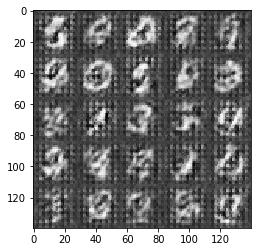

Epoch 1/2... Discriminator Loss: 1.0031... Generator Loss: 1.1037
Epoch 1/2... Discriminator Loss: 0.9506... Generator Loss: 0.8535
Epoch 1/2... Discriminator Loss: 1.0291... Generator Loss: 0.9492
Epoch 1/2... Discriminator Loss: 1.0758... Generator Loss: 0.7187
Epoch 1/2... Discriminator Loss: 0.8847... Generator Loss: 1.6946
Epoch 1/2... Discriminator Loss: 1.3604... Generator Loss: 0.3754
Epoch 1/2... Discriminator Loss: 1.5165... Generator Loss: 3.3322
Epoch 1/2... Discriminator Loss: 1.5692... Generator Loss: 0.3006
Epoch 1/2... Discriminator Loss: 0.4009... Generator Loss: 1.9448
Epoch 1/2... Discriminator Loss: 0.8269... Generator Loss: 1.3985


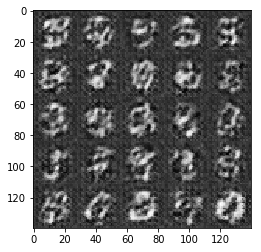

Epoch 1/2... Discriminator Loss: 1.5336... Generator Loss: 0.3615
Epoch 1/2... Discriminator Loss: 0.8289... Generator Loss: 3.1447
Epoch 1/2... Discriminator Loss: 0.8562... Generator Loss: 0.8600
Epoch 1/2... Discriminator Loss: 0.5936... Generator Loss: 1.3825
Epoch 1/2... Discriminator Loss: 0.8083... Generator Loss: 0.9355
Epoch 1/2... Discriminator Loss: 0.7918... Generator Loss: 0.9119
Epoch 1/2... Discriminator Loss: 0.6057... Generator Loss: 1.2290
Epoch 1/2... Discriminator Loss: 0.5984... Generator Loss: 1.0950
Epoch 1/2... Discriminator Loss: 0.6677... Generator Loss: 1.1772
Epoch 1/2... Discriminator Loss: 0.2427... Generator Loss: 4.2603


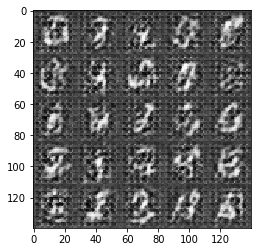

Epoch 1/2... Discriminator Loss: 0.1938... Generator Loss: 1.9984
Epoch 1/2... Discriminator Loss: 0.6376... Generator Loss: 0.9146
Epoch 1/2... Discriminator Loss: 0.3488... Generator Loss: 2.7341
Epoch 1/2... Discriminator Loss: 0.7240... Generator Loss: 0.9298
Epoch 1/2... Discriminator Loss: 0.2485... Generator Loss: 3.1987
Epoch 1/2... Discriminator Loss: 0.8744... Generator Loss: 0.7684
Epoch 1/2... Discriminator Loss: 0.4035... Generator Loss: 1.6670
Epoch 1/2... Discriminator Loss: 0.3270... Generator Loss: 4.0140
Epoch 1/2... Discriminator Loss: 0.4376... Generator Loss: 1.6808
Epoch 1/2... Discriminator Loss: 1.7739... Generator Loss: 0.2654


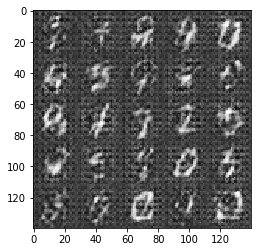

Epoch 1/2... Discriminator Loss: 3.6612... Generator Loss: 6.4945
Epoch 1/2... Discriminator Loss: 1.8563... Generator Loss: 0.2852
Epoch 1/2... Discriminator Loss: 0.6737... Generator Loss: 1.5065
Epoch 1/2... Discriminator Loss: 0.8805... Generator Loss: 1.2388
Epoch 1/2... Discriminator Loss: 1.4891... Generator Loss: 0.3536
Epoch 1/2... Discriminator Loss: 1.1754... Generator Loss: 1.7157
Epoch 1/2... Discriminator Loss: 1.7872... Generator Loss: 0.2562
Epoch 1/2... Discriminator Loss: 0.6912... Generator Loss: 1.9911
Epoch 1/2... Discriminator Loss: 0.7215... Generator Loss: 0.9958
Epoch 1/2... Discriminator Loss: 0.8485... Generator Loss: 0.7765


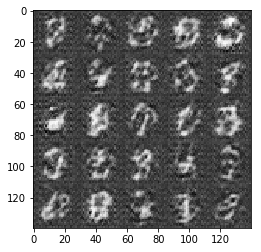

Epoch 1/2... Discriminator Loss: 0.8266... Generator Loss: 1.9157
Epoch 1/2... Discriminator Loss: 1.2442... Generator Loss: 0.4501
Epoch 1/2... Discriminator Loss: 0.5893... Generator Loss: 2.9908
Epoch 1/2... Discriminator Loss: 0.2499... Generator Loss: 1.8609
Epoch 1/2... Discriminator Loss: 1.1911... Generator Loss: 0.4553
Epoch 1/2... Discriminator Loss: 0.9957... Generator Loss: 4.1916
Epoch 1/2... Discriminator Loss: 0.1377... Generator Loss: 2.7308
Epoch 1/2... Discriminator Loss: 0.8726... Generator Loss: 0.7231
Epoch 1/2... Discriminator Loss: 0.3088... Generator Loss: 1.7834
Epoch 1/2... Discriminator Loss: 0.3703... Generator Loss: 1.6207


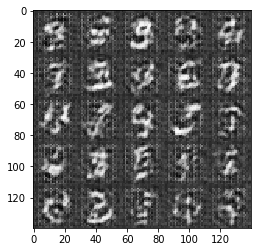

Epoch 1/2... Discriminator Loss: 0.2875... Generator Loss: 2.7755
Epoch 1/2... Discriminator Loss: 0.3322... Generator Loss: 1.6168
Epoch 1/2... Discriminator Loss: 0.2231... Generator Loss: 2.4031
Epoch 1/2... Discriminator Loss: 0.4639... Generator Loss: 1.2939
Epoch 1/2... Discriminator Loss: 0.3727... Generator Loss: 1.9572
Epoch 1/2... Discriminator Loss: 0.1016... Generator Loss: 6.3995
Epoch 1/2... Discriminator Loss: 0.0462... Generator Loss: 4.0973
Epoch 1/2... Discriminator Loss: 0.3984... Generator Loss: 1.3349
Epoch 1/2... Discriminator Loss: 0.1408... Generator Loss: 2.6911
Epoch 1/2... Discriminator Loss: 0.1030... Generator Loss: 4.9080


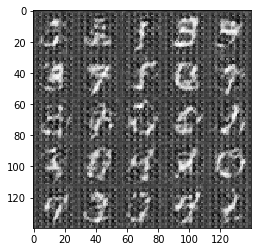

Epoch 1/2... Discriminator Loss: 0.2327... Generator Loss: 2.0137
Epoch 1/2... Discriminator Loss: 0.0590... Generator Loss: 4.1195
Epoch 1/2... Discriminator Loss: 0.1129... Generator Loss: 2.7765
Epoch 1/2... Discriminator Loss: 0.2472... Generator Loss: 1.7766
Epoch 1/2... Discriminator Loss: 0.1007... Generator Loss: 4.3684
Epoch 1/2... Discriminator Loss: 0.2062... Generator Loss: 2.1104
Epoch 1/2... Discriminator Loss: 0.1106... Generator Loss: 6.6308
Epoch 1/2... Discriminator Loss: 0.1117... Generator Loss: 2.9048
Epoch 1/2... Discriminator Loss: 0.0563... Generator Loss: 3.8131
Epoch 1/2... Discriminator Loss: 0.1569... Generator Loss: 2.2910


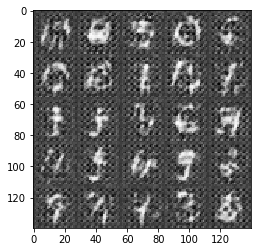

Epoch 1/2... Discriminator Loss: 0.1157... Generator Loss: 4.0587
Epoch 1/2... Discriminator Loss: 0.0411... Generator Loss: 4.3623
Epoch 1/2... Discriminator Loss: 0.8034... Generator Loss: 0.7739
Epoch 1/2... Discriminator Loss: 0.1819... Generator Loss: 4.7438
Epoch 1/2... Discriminator Loss: 0.2584... Generator Loss: 2.5148
Epoch 1/2... Discriminator Loss: 1.1321... Generator Loss: 0.5386
Epoch 1/2... Discriminator Loss: 2.2565... Generator Loss: 3.5351
Epoch 1/2... Discriminator Loss: 3.6045... Generator Loss: 0.0587
Epoch 1/2... Discriminator Loss: 14.7781... Generator Loss: 15.2182
Epoch 1/2... Discriminator Loss: 3.2898... Generator Loss: 3.2425


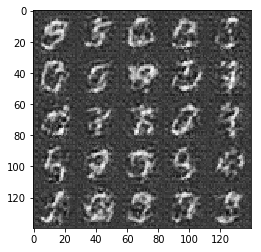

Epoch 1/2... Discriminator Loss: 11.1983... Generator Loss: 0.0011
Epoch 1/2... Discriminator Loss: 4.8155... Generator Loss: 0.0470
Epoch 1/2... Discriminator Loss: 5.1574... Generator Loss: 5.5829
Epoch 1/2... Discriminator Loss: 2.2351... Generator Loss: 2.2697
Epoch 1/2... Discriminator Loss: 4.5221... Generator Loss: 0.0360
Epoch 1/2... Discriminator Loss: 1.8597... Generator Loss: 0.3388
Epoch 1/2... Discriminator Loss: 3.5209... Generator Loss: 3.5032
Epoch 1/2... Discriminator Loss: 1.5129... Generator Loss: 1.0492
Epoch 1/2... Discriminator Loss: 2.4533... Generator Loss: 0.1591
Epoch 1/2... Discriminator Loss: 1.3395... Generator Loss: 1.2310


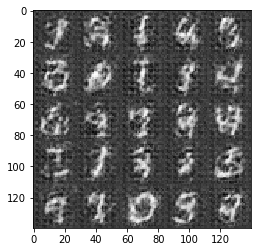

Epoch 1/2... Discriminator Loss: 1.4815... Generator Loss: 1.1328
Epoch 1/2... Discriminator Loss: 1.7011... Generator Loss: 0.4127
Epoch 1/2... Discriminator Loss: 1.4963... Generator Loss: 0.8566
Epoch 1/2... Discriminator Loss: 1.3806... Generator Loss: 0.7691
Epoch 1/2... Discriminator Loss: 1.3406... Generator Loss: 0.7550
Epoch 1/2... Discriminator Loss: 1.2362... Generator Loss: 0.8240
Epoch 1/2... Discriminator Loss: 1.2249... Generator Loss: 0.8739
Epoch 1/2... Discriminator Loss: 1.3492... Generator Loss: 0.6438
Epoch 1/2... Discriminator Loss: 1.4981... Generator Loss: 0.7457
Epoch 1/2... Discriminator Loss: 1.5836... Generator Loss: 0.5188


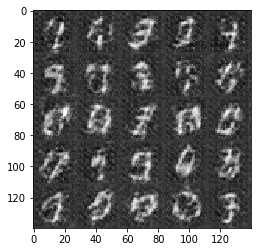

Epoch 1/2... Discriminator Loss: 1.5685... Generator Loss: 0.8322
Epoch 1/2... Discriminator Loss: 1.4313... Generator Loss: 0.6299
Epoch 1/2... Discriminator Loss: 1.2667... Generator Loss: 1.0330
Epoch 1/2... Discriminator Loss: 1.1675... Generator Loss: 0.7369
Epoch 1/2... Discriminator Loss: 1.2628... Generator Loss: 0.8155
Epoch 1/2... Discriminator Loss: 1.4760... Generator Loss: 0.6623
Epoch 1/2... Discriminator Loss: 1.8159... Generator Loss: 0.4944
Epoch 1/2... Discriminator Loss: 1.5989... Generator Loss: 0.7440
Epoch 1/2... Discriminator Loss: 1.4212... Generator Loss: 0.7367
Epoch 1/2... Discriminator Loss: 1.3112... Generator Loss: 0.6804


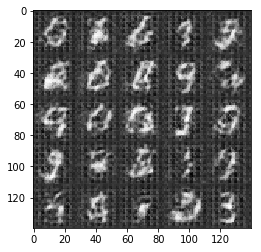

Epoch 1/2... Discriminator Loss: 1.2933... Generator Loss: 1.1139
Epoch 1/2... Discriminator Loss: 1.6692... Generator Loss: 0.4582
Epoch 1/2... Discriminator Loss: 1.8365... Generator Loss: 0.7102
Epoch 1/2... Discriminator Loss: 1.7405... Generator Loss: 0.6495
Epoch 1/2... Discriminator Loss: 1.3181... Generator Loss: 0.8882
Epoch 1/2... Discriminator Loss: 1.2005... Generator Loss: 0.9716
Epoch 1/2... Discriminator Loss: 1.1670... Generator Loss: 0.8215
Epoch 1/2... Discriminator Loss: 1.7370... Generator Loss: 0.5778
Epoch 1/2... Discriminator Loss: 2.6308... Generator Loss: 0.3513
Epoch 1/2... Discriminator Loss: 2.5443... Generator Loss: 0.3545


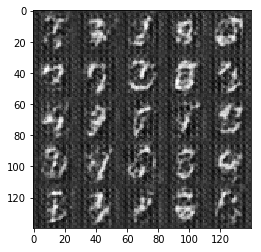

Epoch 1/2... Discriminator Loss: 1.8159... Generator Loss: 0.9069
Epoch 1/2... Discriminator Loss: 1.1029... Generator Loss: 0.7496
Epoch 1/2... Discriminator Loss: 0.7474... Generator Loss: 1.6642
Epoch 1/2... Discriminator Loss: 1.3403... Generator Loss: 0.6338
Epoch 1/2... Discriminator Loss: 1.9507... Generator Loss: 0.8678
Epoch 1/2... Discriminator Loss: 2.2925... Generator Loss: 0.3394
Epoch 1/2... Discriminator Loss: 2.0056... Generator Loss: 0.5042
Epoch 1/2... Discriminator Loss: 1.6291... Generator Loss: 0.8334
Epoch 1/2... Discriminator Loss: 1.2567... Generator Loss: 0.6357
Epoch 1/2... Discriminator Loss: 1.0611... Generator Loss: 1.0533


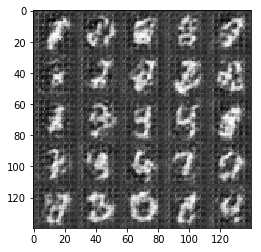

Epoch 1/2... Discriminator Loss: 1.2619... Generator Loss: 0.6848
Epoch 1/2... Discriminator Loss: 1.5431... Generator Loss: 0.8954
Epoch 1/2... Discriminator Loss: 1.6715... Generator Loss: 0.5280
Epoch 1/2... Discriminator Loss: 1.5682... Generator Loss: 0.9764
Epoch 1/2... Discriminator Loss: 1.6155... Generator Loss: 0.3727
Epoch 1/2... Discriminator Loss: 1.8969... Generator Loss: 1.8294
Epoch 1/2... Discriminator Loss: 2.1400... Generator Loss: 0.2200
Epoch 1/2... Discriminator Loss: 1.9124... Generator Loss: 1.2833
Epoch 1/2... Discriminator Loss: 1.9053... Generator Loss: 0.3555
Epoch 1/2... Discriminator Loss: 1.7757... Generator Loss: 0.7817


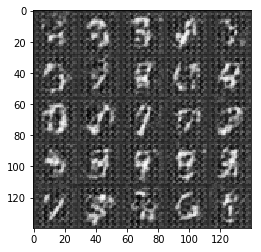

Epoch 1/2... Discriminator Loss: 1.5787... Generator Loss: 0.7998
Epoch 1/2... Discriminator Loss: 1.2890... Generator Loss: 0.8074
Epoch 1/2... Discriminator Loss: 1.4249... Generator Loss: 0.6765
Epoch 1/2... Discriminator Loss: 1.6342... Generator Loss: 0.7742
Epoch 1/2... Discriminator Loss: 2.1436... Generator Loss: 0.3981
Epoch 1/2... Discriminator Loss: 2.0588... Generator Loss: 0.4482
Epoch 1/2... Discriminator Loss: 1.9785... Generator Loss: 0.8976
Epoch 1/2... Discriminator Loss: 1.2956... Generator Loss: 0.6409
Epoch 1/2... Discriminator Loss: 0.9474... Generator Loss: 0.9883
Epoch 1/2... Discriminator Loss: 1.0739... Generator Loss: 1.0864


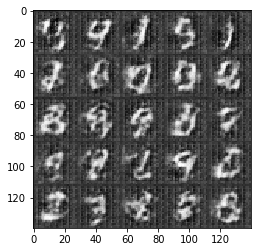

Epoch 1/2... Discriminator Loss: 1.2024... Generator Loss: 0.8090
Epoch 1/2... Discriminator Loss: 1.4894... Generator Loss: 0.8787
Epoch 1/2... Discriminator Loss: 1.6377... Generator Loss: 0.5987
Epoch 1/2... Discriminator Loss: 1.7809... Generator Loss: 0.5959
Epoch 1/2... Discriminator Loss: 1.3943... Generator Loss: 0.8577
Epoch 1/2... Discriminator Loss: 1.2058... Generator Loss: 0.7049
Epoch 1/2... Discriminator Loss: 1.2233... Generator Loss: 1.5519
Epoch 1/2... Discriminator Loss: 1.7680... Generator Loss: 0.2521
Epoch 1/2... Discriminator Loss: 2.2605... Generator Loss: 3.1548
Epoch 1/2... Discriminator Loss: 2.1094... Generator Loss: 0.2150


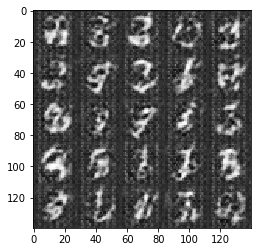

Epoch 1/2... Discriminator Loss: 1.8362... Generator Loss: 1.0679
Epoch 1/2... Discriminator Loss: 2.1113... Generator Loss: 0.3909
Epoch 1/2... Discriminator Loss: 1.8738... Generator Loss: 0.7058
Epoch 1/2... Discriminator Loss: 1.2301... Generator Loss: 0.8287
Epoch 1/2... Discriminator Loss: 0.9764... Generator Loss: 0.9739
Epoch 1/2... Discriminator Loss: 1.0152... Generator Loss: 0.9690
Epoch 1/2... Discriminator Loss: 1.1798... Generator Loss: 0.8654
Epoch 1/2... Discriminator Loss: 1.3526... Generator Loss: 0.7682
Epoch 1/2... Discriminator Loss: 1.3787... Generator Loss: 0.5926
Epoch 1/2... Discriminator Loss: 1.5066... Generator Loss: 1.1680


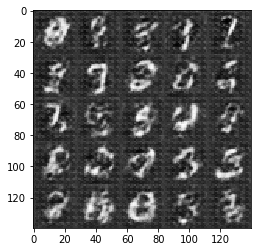

Epoch 1/2... Discriminator Loss: 1.4533... Generator Loss: 0.4079
Epoch 1/2... Discriminator Loss: 1.3228... Generator Loss: 1.7914
Epoch 1/2... Discriminator Loss: 1.3066... Generator Loss: 0.3866
Epoch 1/2... Discriminator Loss: 1.2607... Generator Loss: 1.9753
Epoch 1/2... Discriminator Loss: 1.4033... Generator Loss: 0.4048
Epoch 1/2... Discriminator Loss: 1.4992... Generator Loss: 1.2553
Epoch 1/2... Discriminator Loss: 1.7015... Generator Loss: 0.3485
Epoch 2/2... Discriminator Loss: 1.8916... Generator Loss: 1.5260
Epoch 2/2... Discriminator Loss: 1.5190... Generator Loss: 0.3454
Epoch 2/2... Discriminator Loss: 1.3595... Generator Loss: 2.0590


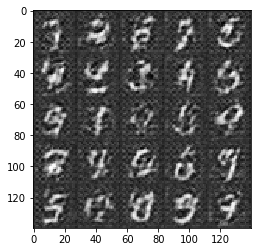

Epoch 2/2... Discriminator Loss: 1.2345... Generator Loss: 0.4717
Epoch 2/2... Discriminator Loss: 1.1613... Generator Loss: 1.5451
Epoch 2/2... Discriminator Loss: 1.3323... Generator Loss: 0.5266
Epoch 2/2... Discriminator Loss: 1.4441... Generator Loss: 1.1019
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.5722
Epoch 2/2... Discriminator Loss: 1.2475... Generator Loss: 1.4015
Epoch 2/2... Discriminator Loss: 1.0901... Generator Loss: 0.6243
Epoch 2/2... Discriminator Loss: 1.1027... Generator Loss: 1.7939
Epoch 2/2... Discriminator Loss: 1.3898... Generator Loss: 0.4057
Epoch 2/2... Discriminator Loss: 1.5717... Generator Loss: 1.7102


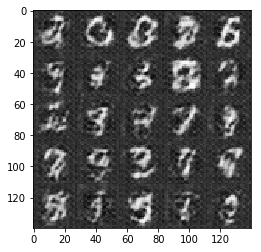

Epoch 2/2... Discriminator Loss: 1.5257... Generator Loss: 0.3916
Epoch 2/2... Discriminator Loss: 1.3924... Generator Loss: 1.3858
Epoch 2/2... Discriminator Loss: 1.1230... Generator Loss: 0.6621
Epoch 2/2... Discriminator Loss: 0.9052... Generator Loss: 1.1128
Epoch 2/2... Discriminator Loss: 0.8613... Generator Loss: 1.2560
Epoch 2/2... Discriminator Loss: 1.0162... Generator Loss: 0.7672
Epoch 2/2... Discriminator Loss: 1.0223... Generator Loss: 1.2315
Epoch 2/2... Discriminator Loss: 1.1395... Generator Loss: 0.6925
Epoch 2/2... Discriminator Loss: 1.2596... Generator Loss: 1.4133
Epoch 2/2... Discriminator Loss: 1.4818... Generator Loss: 0.3760


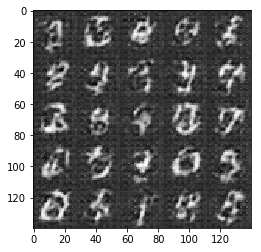

Epoch 2/2... Discriminator Loss: 1.8754... Generator Loss: 3.0159
Epoch 2/2... Discriminator Loss: 1.4167... Generator Loss: 0.3748
Epoch 2/2... Discriminator Loss: 1.1311... Generator Loss: 1.7019
Epoch 2/2... Discriminator Loss: 1.0737... Generator Loss: 0.6425
Epoch 2/2... Discriminator Loss: 1.0007... Generator Loss: 1.3265
Epoch 2/2... Discriminator Loss: 1.1091... Generator Loss: 0.6400
Epoch 2/2... Discriminator Loss: 1.2662... Generator Loss: 1.6741
Epoch 2/2... Discriminator Loss: 1.2936... Generator Loss: 0.4504
Epoch 2/2... Discriminator Loss: 1.3668... Generator Loss: 2.3509
Epoch 2/2... Discriminator Loss: 1.2688... Generator Loss: 0.4422


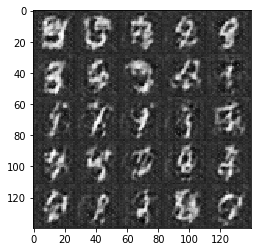

Epoch 2/2... Discriminator Loss: 1.0929... Generator Loss: 2.0644
Epoch 2/2... Discriminator Loss: 1.0014... Generator Loss: 0.7065
Epoch 2/2... Discriminator Loss: 0.9247... Generator Loss: 1.2036
Epoch 2/2... Discriminator Loss: 0.8937... Generator Loss: 1.1597
Epoch 2/2... Discriminator Loss: 0.9230... Generator Loss: 1.0299
Epoch 2/2... Discriminator Loss: 0.8587... Generator Loss: 1.2726
Epoch 2/2... Discriminator Loss: 0.9396... Generator Loss: 0.7103
Epoch 2/2... Discriminator Loss: 1.3784... Generator Loss: 2.5281
Epoch 2/2... Discriminator Loss: 2.0168... Generator Loss: 0.1894
Epoch 2/2... Discriminator Loss: 1.4598... Generator Loss: 2.3952


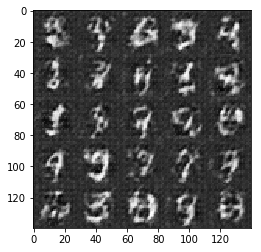

Epoch 2/2... Discriminator Loss: 1.1574... Generator Loss: 0.5279
Epoch 2/2... Discriminator Loss: 0.9663... Generator Loss: 1.6198
Epoch 2/2... Discriminator Loss: 0.9014... Generator Loss: 0.8570
Epoch 2/2... Discriminator Loss: 0.8172... Generator Loss: 1.3849
Epoch 2/2... Discriminator Loss: 0.9553... Generator Loss: 0.8564
Epoch 2/2... Discriminator Loss: 0.9024... Generator Loss: 1.6263
Epoch 2/2... Discriminator Loss: 1.0171... Generator Loss: 0.6150
Epoch 2/2... Discriminator Loss: 1.2671... Generator Loss: 2.9667
Epoch 2/2... Discriminator Loss: 1.4591... Generator Loss: 0.3417
Epoch 2/2... Discriminator Loss: 1.0137... Generator Loss: 2.2314


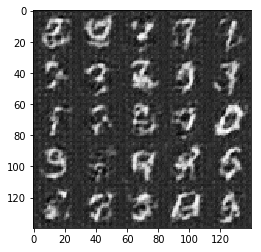

Epoch 2/2... Discriminator Loss: 0.9835... Generator Loss: 0.7182
Epoch 2/2... Discriminator Loss: 0.9314... Generator Loss: 1.4068
Epoch 2/2... Discriminator Loss: 0.9174... Generator Loss: 0.8050
Epoch 2/2... Discriminator Loss: 1.3406... Generator Loss: 2.3504
Epoch 2/2... Discriminator Loss: 1.7124... Generator Loss: 0.2582
Epoch 2/2... Discriminator Loss: 1.4946... Generator Loss: 3.1649
Epoch 2/2... Discriminator Loss: 0.9687... Generator Loss: 0.7073
Epoch 2/2... Discriminator Loss: 0.7318... Generator Loss: 1.3710
Epoch 2/2... Discriminator Loss: 0.8314... Generator Loss: 1.2678
Epoch 2/2... Discriminator Loss: 0.8331... Generator Loss: 1.0711


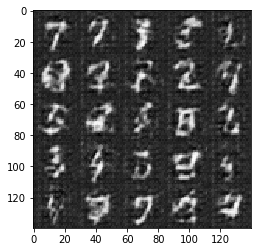

Epoch 2/2... Discriminator Loss: 0.8194... Generator Loss: 1.3432
Epoch 2/2... Discriminator Loss: 0.7691... Generator Loss: 1.2135
Epoch 2/2... Discriminator Loss: 0.8115... Generator Loss: 0.9196
Epoch 2/2... Discriminator Loss: 0.8450... Generator Loss: 1.9564
Epoch 2/2... Discriminator Loss: 1.2226... Generator Loss: 0.4558
Epoch 2/2... Discriminator Loss: 1.4408... Generator Loss: 3.3140
Epoch 2/2... Discriminator Loss: 1.2352... Generator Loss: 0.4353
Epoch 2/2... Discriminator Loss: 0.8246... Generator Loss: 2.2742
Epoch 2/2... Discriminator Loss: 0.6434... Generator Loss: 1.3650
Epoch 2/2... Discriminator Loss: 0.8748... Generator Loss: 0.8512


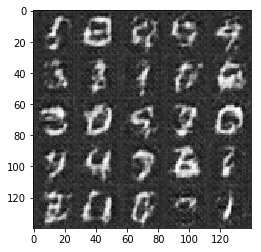

Epoch 2/2... Discriminator Loss: 1.0021... Generator Loss: 1.8988
Epoch 2/2... Discriminator Loss: 1.5632... Generator Loss: 0.3042
Epoch 2/2... Discriminator Loss: 1.4222... Generator Loss: 3.1214
Epoch 2/2... Discriminator Loss: 1.0880... Generator Loss: 0.5709
Epoch 2/2... Discriminator Loss: 0.6952... Generator Loss: 1.8385
Epoch 2/2... Discriminator Loss: 0.6206... Generator Loss: 1.6432
Epoch 2/2... Discriminator Loss: 0.8847... Generator Loss: 0.8387
Epoch 2/2... Discriminator Loss: 0.8049... Generator Loss: 1.7438
Epoch 2/2... Discriminator Loss: 0.9381... Generator Loss: 0.7469
Epoch 2/2... Discriminator Loss: 1.3700... Generator Loss: 3.1367


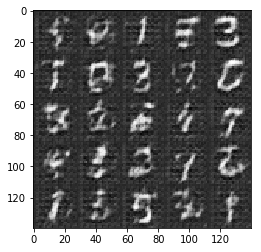

Epoch 2/2... Discriminator Loss: 1.9974... Generator Loss: 0.2147
Epoch 2/2... Discriminator Loss: 1.2409... Generator Loss: 3.2382
Epoch 2/2... Discriminator Loss: 1.1714... Generator Loss: 0.5579
Epoch 2/2... Discriminator Loss: 0.7509... Generator Loss: 1.8671
Epoch 2/2... Discriminator Loss: 0.7538... Generator Loss: 1.2532
Epoch 2/2... Discriminator Loss: 0.7017... Generator Loss: 1.1510
Epoch 2/2... Discriminator Loss: 0.7586... Generator Loss: 1.2358
Epoch 2/2... Discriminator Loss: 0.7617... Generator Loss: 1.3334
Epoch 2/2... Discriminator Loss: 0.8480... Generator Loss: 0.9912
Epoch 2/2... Discriminator Loss: 0.7564... Generator Loss: 1.3067


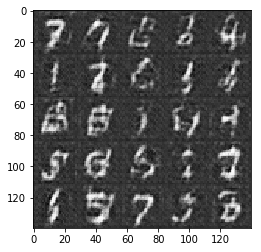

Epoch 2/2... Discriminator Loss: 0.7930... Generator Loss: 0.9348
Epoch 2/2... Discriminator Loss: 0.8127... Generator Loss: 2.4684
Epoch 2/2... Discriminator Loss: 1.3782... Generator Loss: 0.4628
Epoch 2/2... Discriminator Loss: 1.5126... Generator Loss: 3.8367
Epoch 2/2... Discriminator Loss: 1.7468... Generator Loss: 0.2857
Epoch 2/2... Discriminator Loss: 1.1007... Generator Loss: 3.0057
Epoch 2/2... Discriminator Loss: 0.9002... Generator Loss: 0.7449
Epoch 2/2... Discriminator Loss: 0.7124... Generator Loss: 1.5614
Epoch 2/2... Discriminator Loss: 0.7780... Generator Loss: 1.2466
Epoch 2/2... Discriminator Loss: 0.9024... Generator Loss: 1.2896


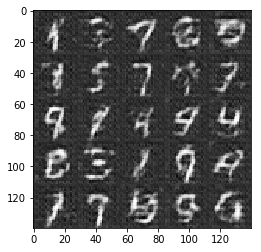

Epoch 2/2... Discriminator Loss: 1.1195... Generator Loss: 0.5624
Epoch 2/2... Discriminator Loss: 1.1381... Generator Loss: 2.7889
Epoch 2/2... Discriminator Loss: 1.4898... Generator Loss: 0.3738
Epoch 2/2... Discriminator Loss: 0.9767... Generator Loss: 2.5105
Epoch 2/2... Discriminator Loss: 0.9146... Generator Loss: 0.7776
Epoch 2/2... Discriminator Loss: 0.8784... Generator Loss: 2.1293
Epoch 2/2... Discriminator Loss: 1.3088... Generator Loss: 0.4434
Epoch 2/2... Discriminator Loss: 1.1432... Generator Loss: 3.5949
Epoch 2/2... Discriminator Loss: 1.3806... Generator Loss: 0.4171
Epoch 2/2... Discriminator Loss: 0.7271... Generator Loss: 2.4092


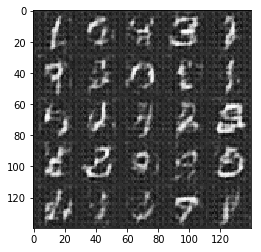

Epoch 2/2... Discriminator Loss: 1.0377... Generator Loss: 0.7621
Epoch 2/2... Discriminator Loss: 1.1226... Generator Loss: 2.4749
Epoch 2/2... Discriminator Loss: 1.8664... Generator Loss: 0.2430
Epoch 2/2... Discriminator Loss: 1.6415... Generator Loss: 3.8987
Epoch 2/2... Discriminator Loss: 1.0649... Generator Loss: 0.6480
Epoch 2/2... Discriminator Loss: 0.6203... Generator Loss: 1.6048
Epoch 2/2... Discriminator Loss: 0.7143... Generator Loss: 1.5994
Epoch 2/2... Discriminator Loss: 1.0335... Generator Loss: 0.5971
Epoch 2/2... Discriminator Loss: 1.1270... Generator Loss: 3.5644
Epoch 2/2... Discriminator Loss: 0.9367... Generator Loss: 0.7063


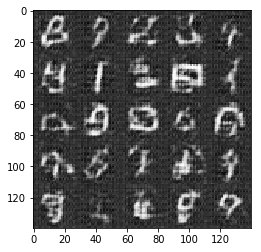

Epoch 2/2... Discriminator Loss: 0.5669... Generator Loss: 1.6042
Epoch 2/2... Discriminator Loss: 0.5489... Generator Loss: 1.8813
Epoch 2/2... Discriminator Loss: 0.7069... Generator Loss: 0.9825
Epoch 2/2... Discriminator Loss: 0.5530... Generator Loss: 2.0854
Epoch 2/2... Discriminator Loss: 0.5831... Generator Loss: 1.1624
Epoch 2/2... Discriminator Loss: 0.4572... Generator Loss: 1.5302
Epoch 2/2... Discriminator Loss: 0.4922... Generator Loss: 1.5092
Epoch 2/2... Discriminator Loss: 0.4803... Generator Loss: 1.4344
Epoch 2/2... Discriminator Loss: 0.4162... Generator Loss: 1.5693
Epoch 2/2... Discriminator Loss: 0.5744... Generator Loss: 1.1846


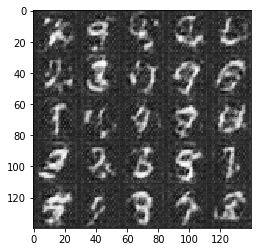

Epoch 2/2... Discriminator Loss: 0.4584... Generator Loss: 1.6429
Epoch 2/2... Discriminator Loss: 0.3674... Generator Loss: 1.6414
Epoch 2/2... Discriminator Loss: 0.3773... Generator Loss: 1.6527
Epoch 2/2... Discriminator Loss: 0.3953... Generator Loss: 1.5011
Epoch 2/2... Discriminator Loss: 0.4358... Generator Loss: 1.3880
Epoch 2/2... Discriminator Loss: 0.2103... Generator Loss: 2.5780
Epoch 2/2... Discriminator Loss: 0.3859... Generator Loss: 1.4324
Epoch 2/2... Discriminator Loss: 0.3566... Generator Loss: 1.6634
Epoch 2/2... Discriminator Loss: 0.2058... Generator Loss: 2.4887
Epoch 2/2... Discriminator Loss: 0.3476... Generator Loss: 1.6168


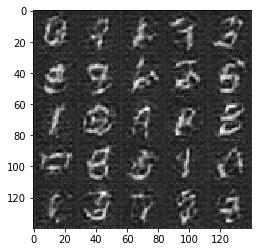

Epoch 2/2... Discriminator Loss: 0.1955... Generator Loss: 2.7950
Epoch 2/2... Discriminator Loss: 0.8472... Generator Loss: 0.7876
Epoch 2/2... Discriminator Loss: 1.0131... Generator Loss: 2.9863
Epoch 2/2... Discriminator Loss: 1.2870... Generator Loss: 0.5659
Epoch 2/2... Discriminator Loss: 1.8770... Generator Loss: 2.2071
Epoch 2/2... Discriminator Loss: 3.7445... Generator Loss: 0.0592
Epoch 2/2... Discriminator Loss: 1.5680... Generator Loss: 3.7007
Epoch 2/2... Discriminator Loss: 1.9397... Generator Loss: 0.3703
Epoch 2/2... Discriminator Loss: 1.5403... Generator Loss: 1.8193
Epoch 2/2... Discriminator Loss: 1.0730... Generator Loss: 0.5868


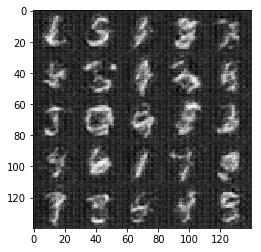

Epoch 2/2... Discriminator Loss: 0.8827... Generator Loss: 2.4707
Epoch 2/2... Discriminator Loss: 0.6120... Generator Loss: 1.1082
Epoch 2/2... Discriminator Loss: 0.5907... Generator Loss: 1.3214
Epoch 2/2... Discriminator Loss: 0.6735... Generator Loss: 1.9440
Epoch 2/2... Discriminator Loss: 0.9974... Generator Loss: 0.5728
Epoch 2/2... Discriminator Loss: 1.9807... Generator Loss: 4.2494
Epoch 2/2... Discriminator Loss: 2.5590... Generator Loss: 0.1360
Epoch 2/2... Discriminator Loss: 0.7155... Generator Loss: 2.5042
Epoch 2/2... Discriminator Loss: 1.0595... Generator Loss: 0.9480
Epoch 2/2... Discriminator Loss: 1.1229... Generator Loss: 0.6530


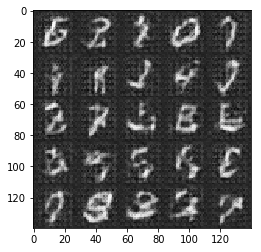

Epoch 2/2... Discriminator Loss: 1.2533... Generator Loss: 2.2502
Epoch 2/2... Discriminator Loss: 1.5056... Generator Loss: 0.3367
Epoch 2/2... Discriminator Loss: 0.8714... Generator Loss: 2.7369
Epoch 2/2... Discriminator Loss: 0.8633... Generator Loss: 0.8175
Epoch 2/2... Discriminator Loss: 0.5074... Generator Loss: 1.3485
Epoch 2/2... Discriminator Loss: 0.6058... Generator Loss: 1.7947
Epoch 2/2... Discriminator Loss: 1.4057... Generator Loss: 0.3953
Epoch 2/2... Discriminator Loss: 1.1652... Generator Loss: 3.0425
Epoch 2/2... Discriminator Loss: 1.1971... Generator Loss: 0.5401
Epoch 2/2... Discriminator Loss: 1.6108... Generator Loss: 3.0972


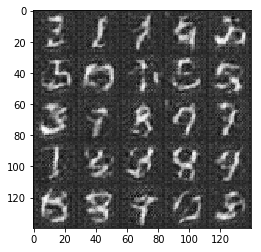

Epoch 2/2... Discriminator Loss: 2.0559... Generator Loss: 0.2054
Epoch 2/2... Discriminator Loss: 0.8514... Generator Loss: 3.3417
Epoch 2/2... Discriminator Loss: 0.5616... Generator Loss: 1.2368
Epoch 2/2... Discriminator Loss: 0.8723... Generator Loss: 0.7969
Epoch 2/2... Discriminator Loss: 0.8093... Generator Loss: 1.8060
Epoch 2/2... Discriminator Loss: 1.3639... Generator Loss: 0.4303
Epoch 2/2... Discriminator Loss: 0.8244... Generator Loss: 2.5860
Epoch 2/2... Discriminator Loss: 0.8261... Generator Loss: 0.8457
Epoch 2/2... Discriminator Loss: 0.6192... Generator Loss: 1.5460
Epoch 2/2... Discriminator Loss: 0.3607... Generator Loss: 1.6802


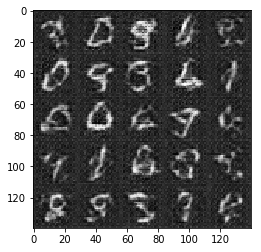

Epoch 2/2... Discriminator Loss: 0.4429... Generator Loss: 1.5627
Epoch 2/2... Discriminator Loss: 0.5687... Generator Loss: 1.2529
Epoch 2/2... Discriminator Loss: 0.3672... Generator Loss: 1.9596
Epoch 2/2... Discriminator Loss: 0.1921... Generator Loss: 2.5352
Epoch 2/2... Discriminator Loss: 0.4509... Generator Loss: 1.2804
Epoch 2/2... Discriminator Loss: 0.3540... Generator Loss: 1.6965
Epoch 2/2... Discriminator Loss: 0.1582... Generator Loss: 4.0304
Epoch 2/2... Discriminator Loss: 0.1017... Generator Loss: 2.9677
Epoch 2/2... Discriminator Loss: 0.3827... Generator Loss: 1.3751
Epoch 2/2... Discriminator Loss: 0.3833... Generator Loss: 2.1445


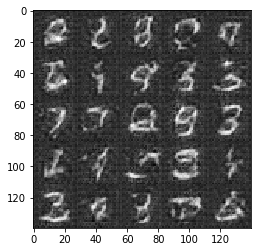

Epoch 2/2... Discriminator Loss: 0.1650... Generator Loss: 2.5036
Epoch 2/2... Discriminator Loss: 0.3656... Generator Loss: 1.6739
Epoch 2/2... Discriminator Loss: 0.1723... Generator Loss: 2.6546
Epoch 2/2... Discriminator Loss: 0.0792... Generator Loss: 3.4203
Epoch 2/2... Discriminator Loss: 0.6101... Generator Loss: 1.0055
Epoch 2/2... Discriminator Loss: 0.1935... Generator Loss: 4.8239
Epoch 2/2... Discriminator Loss: 0.3565... Generator Loss: 1.6257
Epoch 2/2... Discriminator Loss: 0.0861... Generator Loss: 3.5141
Epoch 2/2... Discriminator Loss: 0.4158... Generator Loss: 1.3599
Epoch 2/2... Discriminator Loss: 0.5342... Generator Loss: 3.5151


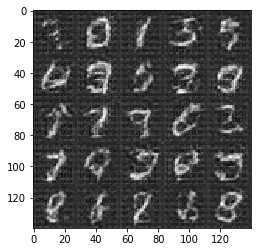

Epoch 2/2... Discriminator Loss: 0.8701... Generator Loss: 1.2293
Epoch 2/2... Discriminator Loss: 3.2986... Generator Loss: 0.0669
Epoch 2/2... Discriminator Loss: 7.0603... Generator Loss: 7.2403
Epoch 2/2... Discriminator Loss: 0.4570... Generator Loss: 3.0108
Epoch 2/2... Discriminator Loss: 0.9245... Generator Loss: 0.6965
Epoch 2/2... Discriminator Loss: 1.0100... Generator Loss: 1.7704
Epoch 2/2... Discriminator Loss: 2.9031... Generator Loss: 0.0880
Epoch 2/2... Discriminator Loss: 4.3098... Generator Loss: 4.1069
Epoch 2/2... Discriminator Loss: 2.7716... Generator Loss: 0.1603
Epoch 2/2... Discriminator Loss: 1.1437... Generator Loss: 1.3271


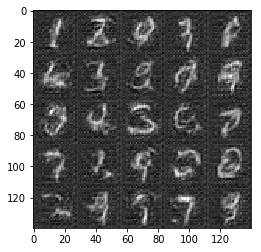

Epoch 2/2... Discriminator Loss: 1.3236... Generator Loss: 0.7781
Epoch 2/2... Discriminator Loss: 1.6379... Generator Loss: 0.8818
Epoch 2/2... Discriminator Loss: 1.5935... Generator Loss: 0.5479
Epoch 2/2... Discriminator Loss: 1.2185... Generator Loss: 1.1118
Epoch 2/2... Discriminator Loss: 1.2646... Generator Loss: 0.4993
Epoch 2/2... Discriminator Loss: 1.1755... Generator Loss: 2.4279
Epoch 2/2... Discriminator Loss: 1.3374... Generator Loss: 0.4402
Epoch 2/2... Discriminator Loss: 0.8580... Generator Loss: 2.1103
Epoch 2/2... Discriminator Loss: 1.0736... Generator Loss: 0.6270
Epoch 2/2... Discriminator Loss: 0.9032... Generator Loss: 1.2371


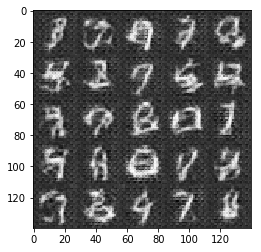

Epoch 2/2... Discriminator Loss: 0.9210... Generator Loss: 1.0969
Epoch 2/2... Discriminator Loss: 0.8261... Generator Loss: 0.9563
Epoch 2/2... Discriminator Loss: 0.8248... Generator Loss: 1.7177
Epoch 2/2... Discriminator Loss: 1.2097... Generator Loss: 0.4636
Epoch 2/2... Discriminator Loss: 2.3421... Generator Loss: 4.3129
Epoch 2/2... Discriminator Loss: 2.3818... Generator Loss: 0.1434
Epoch 2/2... Discriminator Loss: 1.7434... Generator Loss: 3.7510
Epoch 2/2... Discriminator Loss: 1.1561... Generator Loss: 0.5934
Epoch 2/2... Discriminator Loss: 0.7006... Generator Loss: 1.3839
Epoch 2/2... Discriminator Loss: 0.7706... Generator Loss: 1.3165


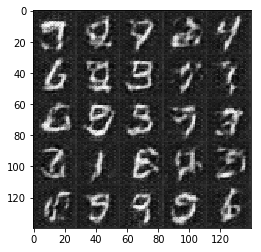

Epoch 2/2... Discriminator Loss: 0.8526... Generator Loss: 0.8795
Epoch 2/2... Discriminator Loss: 0.7259... Generator Loss: 1.5361
Epoch 2/2... Discriminator Loss: 0.6961... Generator Loss: 1.3023
Epoch 2/2... Discriminator Loss: 0.7417... Generator Loss: 1.0354
Epoch 2/2... Discriminator Loss: 0.6182... Generator Loss: 1.5485
Epoch 2/2... Discriminator Loss: 0.6748... Generator Loss: 1.0810
Epoch 2/2... Discriminator Loss: 0.6192... Generator Loss: 1.6545
Epoch 2/2... Discriminator Loss: 0.7039... Generator Loss: 0.9710
Epoch 2/2... Discriminator Loss: 0.6312... Generator Loss: 1.4969
Epoch 2/2... Discriminator Loss: 0.6254... Generator Loss: 1.2158


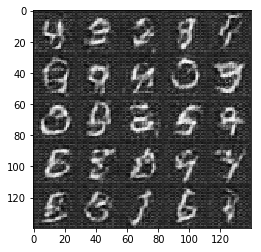

Epoch 2/2... Discriminator Loss: 0.7203... Generator Loss: 0.9661
Epoch 2/2... Discriminator Loss: 0.5420... Generator Loss: 1.8567
Epoch 2/2... Discriminator Loss: 0.5893... Generator Loss: 1.0919
Epoch 2/2... Discriminator Loss: 0.6428... Generator Loss: 1.1210
Epoch 2/2... Discriminator Loss: 0.6305... Generator Loss: 1.6967
Epoch 2/2... Discriminator Loss: 1.0105... Generator Loss: 0.6101
Epoch 2/2... Discriminator Loss: 0.7022... Generator Loss: 2.5516
Epoch 2/2... Discriminator Loss: 1.2630... Generator Loss: 0.4374
Epoch 2/2... Discriminator Loss: 0.7043... Generator Loss: 2.1476
Epoch 2/2... Discriminator Loss: 0.7217... Generator Loss: 0.8889


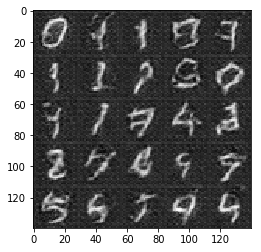

Epoch 2/2... Discriminator Loss: 0.4644... Generator Loss: 1.8408
Epoch 2/2... Discriminator Loss: 0.5310... Generator Loss: 1.2752
Epoch 2/2... Discriminator Loss: 0.6094... Generator Loss: 1.0909
Epoch 2/2... Discriminator Loss: 0.5883... Generator Loss: 1.7040
Epoch 2/2... Discriminator Loss: 0.4342... Generator Loss: 1.6419
Epoch 2/2... Discriminator Loss: 0.1510... Generator Loss: 2.9280
Epoch 2/2... Discriminator Loss: 0.4377... Generator Loss: 1.3701
Epoch 2/2... Discriminator Loss: 0.4108... Generator Loss: 2.0102
Epoch 2/2... Discriminator Loss: 0.2960... Generator Loss: 2.0633
Epoch 2/2... Discriminator Loss: 0.3062... Generator Loss: 1.7526


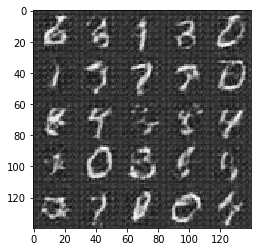

Epoch 2/2... Discriminator Loss: 0.2410... Generator Loss: 2.2468
Epoch 2/2... Discriminator Loss: 0.2988... Generator Loss: 1.8453
Epoch 2/2... Discriminator Loss: 0.1242... Generator Loss: 3.2868
Epoch 2/2... Discriminator Loss: 0.2417... Generator Loss: 2.0685
Epoch 2/2... Discriminator Loss: 0.1350... Generator Loss: 3.0971
Epoch 2/2... Discriminator Loss: 0.2873... Generator Loss: 1.7694
Epoch 2/2... Discriminator Loss: 0.3414... Generator Loss: 1.7562
Epoch 2/2... Discriminator Loss: 0.1909... Generator Loss: 2.5204
Epoch 2/2... Discriminator Loss: 0.1144... Generator Loss: 3.3374
Epoch 2/2... Discriminator Loss: 0.3989... Generator Loss: 1.4163


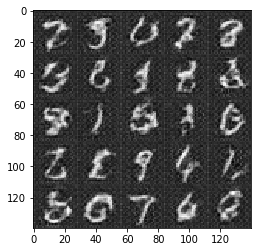

Epoch 2/2... Discriminator Loss: 0.1697... Generator Loss: 4.4869
Epoch 2/2... Discriminator Loss: 0.1543... Generator Loss: 2.4765
Epoch 2/2... Discriminator Loss: 0.2505... Generator Loss: 1.8735
Epoch 2/2... Discriminator Loss: 0.3196... Generator Loss: 1.6433
Epoch 2/2... Discriminator Loss: 0.2121... Generator Loss: 5.2049
Epoch 2/2... Discriminator Loss: 0.3958... Generator Loss: 2.2331
Epoch 2/2... Discriminator Loss: 2.8253... Generator Loss: 0.1021
Epoch 2/2... Discriminator Loss: 5.4248... Generator Loss: 7.5946
Epoch 2/2... Discriminator Loss: 1.1184... Generator Loss: 0.7150
Epoch 2/2... Discriminator Loss: 0.6613... Generator Loss: 1.3398


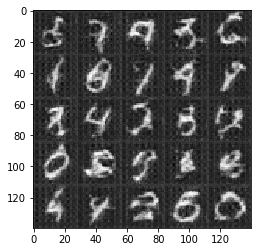

Epoch 2/2... Discriminator Loss: 0.5813... Generator Loss: 2.4932
Epoch 2/2... Discriminator Loss: 0.7264... Generator Loss: 0.8995
Epoch 2/2... Discriminator Loss: 0.4457... Generator Loss: 3.2064
Epoch 2/2... Discriminator Loss: 0.6980... Generator Loss: 0.9986
Epoch 2/2... Discriminator Loss: 0.6336... Generator Loss: 2.1619
Epoch 2/2... Discriminator Loss: 0.8726... Generator Loss: 0.7834
Epoch 2/2... Discriminator Loss: 0.3961... Generator Loss: 2.3716
Epoch 2/2... Discriminator Loss: 0.6734... Generator Loss: 0.9873
Epoch 2/2... Discriminator Loss: 0.3984... Generator Loss: 1.9320
Epoch 2/2... Discriminator Loss: 0.1877... Generator Loss: 3.1310


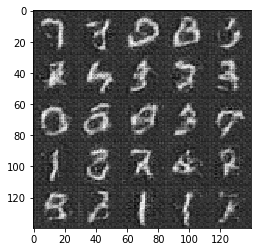

Epoch 2/2... Discriminator Loss: 0.2728... Generator Loss: 2.0135
Epoch 2/2... Discriminator Loss: 0.1590... Generator Loss: 3.3217
Epoch 2/2... Discriminator Loss: 0.6861... Generator Loss: 0.9829
Epoch 2/2... Discriminator Loss: 0.2549... Generator Loss: 2.8335
Epoch 2/2... Discriminator Loss: 0.2905... Generator Loss: 1.7925
Epoch 2/2... Discriminator Loss: 0.0955... Generator Loss: 3.3632
Epoch 2/2... Discriminator Loss: 0.1087... Generator Loss: 2.9792
Epoch 2/2... Discriminator Loss: 0.6736... Generator Loss: 0.9969
Epoch 2/2... Discriminator Loss: 0.4364... Generator Loss: 5.0194
Epoch 2/2... Discriminator Loss: 1.3874... Generator Loss: 3.4959


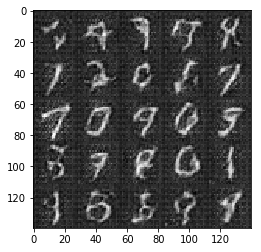

Epoch 2/2... Discriminator Loss: 4.2305... Generator Loss: 0.0280
Epoch 2/2... Discriminator Loss: 4.1489... Generator Loss: 5.8145
Epoch 2/2... Discriminator Loss: 1.4677... Generator Loss: 0.4292
Epoch 2/2... Discriminator Loss: 0.7193... Generator Loss: 1.3694
Epoch 2/2... Discriminator Loss: 0.8882... Generator Loss: 1.9771
Epoch 2/2... Discriminator Loss: 2.4616... Generator Loss: 0.1461
Epoch 2/2... Discriminator Loss: 1.1743... Generator Loss: 2.6048
Epoch 2/2... Discriminator Loss: 0.8436... Generator Loss: 1.0265
Epoch 2/2... Discriminator Loss: 0.8824... Generator Loss: 0.7527
Epoch 2/2... Discriminator Loss: 0.8408... Generator Loss: 2.0713


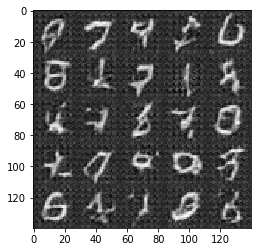

Epoch 2/2... Discriminator Loss: 1.2046... Generator Loss: 0.5110
Epoch 2/2... Discriminator Loss: 0.6720... Generator Loss: 1.6347
Epoch 2/2... Discriminator Loss: 0.7910... Generator Loss: 1.2312
Epoch 2/2... Discriminator Loss: 1.1016... Generator Loss: 0.5849
Epoch 2/2... Discriminator Loss: 1.9425... Generator Loss: 2.9986
Epoch 2/2... Discriminator Loss: 0.9825... Generator Loss: 0.6466
Epoch 2/2... Discriminator Loss: 0.7115... Generator Loss: 2.9489
Epoch 2/2... Discriminator Loss: 2.3323... Generator Loss: 0.1665
Epoch 2/2... Discriminator Loss: 3.1411... Generator Loss: 3.5846
Epoch 2/2... Discriminator Loss: 1.8413... Generator Loss: 0.2451


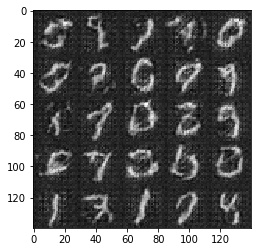

Epoch 2/2... Discriminator Loss: 0.7402... Generator Loss: 2.3255
Epoch 2/2... Discriminator Loss: 0.7822... Generator Loss: 1.2909
Epoch 2/2... Discriminator Loss: 0.9481... Generator Loss: 0.7453
Epoch 2/2... Discriminator Loss: 0.5569... Generator Loss: 1.7767
Epoch 2/2... Discriminator Loss: 0.5056... Generator Loss: 1.6447
Epoch 2/2... Discriminator Loss: 0.6585... Generator Loss: 1.0238
Epoch 2/2... Discriminator Loss: 0.6745... Generator Loss: 1.1635
Epoch 2/2... Discriminator Loss: 0.6615... Generator Loss: 1.6286
Epoch 2/2... Discriminator Loss: 0.7214... Generator Loss: 0.8914
Epoch 2/2... Discriminator Loss: 0.5744... Generator Loss: 1.4982


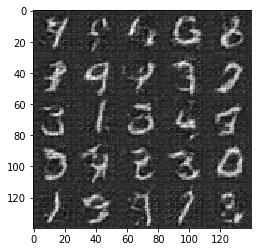

Epoch 2/2... Discriminator Loss: 0.2692... Generator Loss: 2.0754
Epoch 2/2... Discriminator Loss: 0.4199... Generator Loss: 1.5295
Epoch 2/2... Discriminator Loss: 0.4174... Generator Loss: 2.0194
Epoch 2/2... Discriminator Loss: 0.3774... Generator Loss: 1.7472
Epoch 2/2... Discriminator Loss: 0.1898... Generator Loss: 2.4651
Epoch 2/2... Discriminator Loss: 0.3086... Generator Loss: 1.7188
Epoch 2/2... Discriminator Loss: 0.2763... Generator Loss: 2.0562
Epoch 2/2... Discriminator Loss: 0.2364... Generator Loss: 2.5444
Epoch 2/2... Discriminator Loss: 0.3211... Generator Loss: 1.7394
Epoch 2/2... Discriminator Loss: 0.5188... Generator Loss: 1.2505


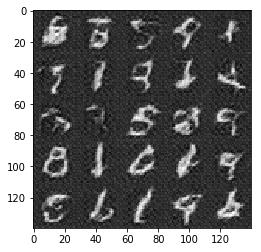

Epoch 2/2... Discriminator Loss: 0.4338... Generator Loss: 1.6893
Epoch 2/2... Discriminator Loss: 0.6504... Generator Loss: 0.9942
Epoch 2/2... Discriminator Loss: 0.3683... Generator Loss: 1.7114
Epoch 2/2... Discriminator Loss: 0.1144... Generator Loss: 3.8255
Epoch 2/2... Discriminator Loss: 0.3655... Generator Loss: 1.4984
Epoch 2/2... Discriminator Loss: 0.2219... Generator Loss: 2.1930
Epoch 2/2... Discriminator Loss: 0.1715... Generator Loss: 2.4670
Epoch 2/2... Discriminator Loss: 0.3684... Generator Loss: 1.5796
Epoch 2/2... Discriminator Loss: 0.1017... Generator Loss: 3.4163
Epoch 2/2... Discriminator Loss: 0.1268... Generator Loss: 2.8507


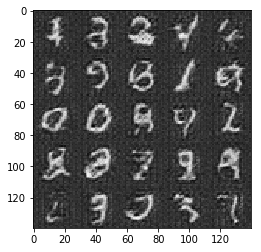

Epoch 2/2... Discriminator Loss: 0.2415... Generator Loss: 1.9330
Epoch 2/2... Discriminator Loss: 0.2698... Generator Loss: 1.8473
Epoch 2/2... Discriminator Loss: 0.1927... Generator Loss: 4.2548
Epoch 2/2... Discriminator Loss: 0.1456... Generator Loss: 2.6796
Epoch 2/2... Discriminator Loss: 0.2565... Generator Loss: 1.8992
Epoch 2/2... Discriminator Loss: 0.1587... Generator Loss: 2.6213
Epoch 2/2... Discriminator Loss: 0.0819... Generator Loss: 4.1052
Epoch 2/2... Discriminator Loss: 0.1829... Generator Loss: 2.2823
Epoch 2/2... Discriminator Loss: 0.3165... Generator Loss: 1.6465
Epoch 2/2... Discriminator Loss: 0.1047... Generator Loss: 3.8692


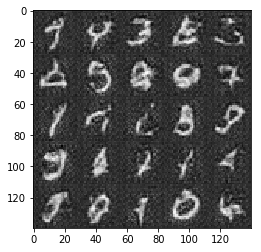

Epoch 2/2... Discriminator Loss: 0.0617... Generator Loss: 4.1794
Epoch 2/2... Discriminator Loss: 0.2728... Generator Loss: 1.7784
Epoch 2/2... Discriminator Loss: 0.1458... Generator Loss: 6.0417
Epoch 2/2... Discriminator Loss: 0.0791... Generator Loss: 3.9615
Epoch 2/2... Discriminator Loss: 0.1736... Generator Loss: 2.1311
Epoch 2/2... Discriminator Loss: 0.1705... Generator Loss: 2.2850
Epoch 2/2... Discriminator Loss: 0.2342... Generator Loss: 1.9453
Epoch 2/2... Discriminator Loss: 0.2101... Generator Loss: 3.0054
Epoch 2/2... Discriminator Loss: 0.1062... Generator Loss: 3.9740
Epoch 2/2... Discriminator Loss: 0.0638... Generator Loss: 3.5745


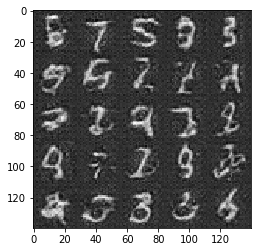

Epoch 2/2... Discriminator Loss: 0.0885... Generator Loss: 2.9976
Epoch 2/2... Discriminator Loss: 0.5293... Generator Loss: 1.1304
Epoch 2/2... Discriminator Loss: 0.0657... Generator Loss: 4.3379
Epoch 2/2... Discriminator Loss: 0.0586... Generator Loss: 4.5870
Epoch 2/2... Discriminator Loss: 0.3102... Generator Loss: 1.6335
Epoch 2/2... Discriminator Loss: 0.0705... Generator Loss: 4.1826
Epoch 2/2... Discriminator Loss: 0.1648... Generator Loss: 2.3106
Epoch 2/2... Discriminator Loss: 0.1632... Generator Loss: 2.3940
Epoch 2/2... Discriminator Loss: 0.0474... Generator Loss: 6.6136
Epoch 2/2... Discriminator Loss: 0.1250... Generator Loss: 2.7503


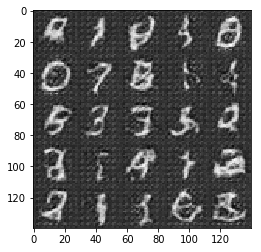

Epoch 2/2... Discriminator Loss: 0.0360... Generator Loss: 4.8909
Epoch 2/2... Discriminator Loss: 0.0985... Generator Loss: 2.8243
Epoch 2/2... Discriminator Loss: 0.1733... Generator Loss: 2.3542
Epoch 2/2... Discriminator Loss: 0.0822... Generator Loss: 3.5485
Epoch 2/2... Discriminator Loss: 0.0343... Generator Loss: 4.9801
Epoch 2/2... Discriminator Loss: 0.0526... Generator Loss: 3.8577
Epoch 2/2... Discriminator Loss: 0.0723... Generator Loss: 3.2993
Epoch 2/2... Discriminator Loss: 0.0939... Generator Loss: 3.1468
Epoch 2/2... Discriminator Loss: 0.0680... Generator Loss: 3.4262
Epoch 2/2... Discriminator Loss: 0.1173... Generator Loss: 2.7706


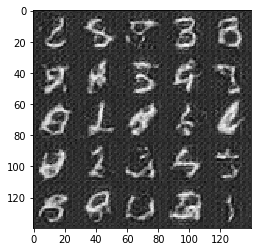

Epoch 2/2... Discriminator Loss: 0.0566... Generator Loss: 4.4220
Epoch 2/2... Discriminator Loss: 0.2667... Generator Loss: 1.8355
Epoch 2/2... Discriminator Loss: 0.0640... Generator Loss: 6.1901
Epoch 2/2... Discriminator Loss: 0.1633... Generator Loss: 2.3360
Epoch 2/2... Discriminator Loss: 0.0314... Generator Loss: 6.3247
Epoch 2/2... Discriminator Loss: 0.0313... Generator Loss: 4.6896
Epoch 2/2... Discriminator Loss: 0.1223... Generator Loss: 2.5212
Epoch 2/2... Discriminator Loss: 0.1045... Generator Loss: 2.7246
Epoch 2/2... Discriminator Loss: 0.1826... Generator Loss: 2.2276
Epoch 2/2... Discriminator Loss: 0.0711... Generator Loss: 3.5724


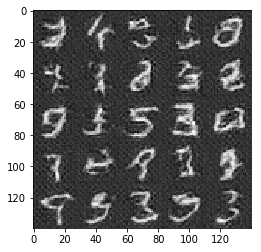

Epoch 2/2... Discriminator Loss: 0.0452... Generator Loss: 5.0503
Epoch 2/2... Discriminator Loss: 0.1303... Generator Loss: 2.4568
Epoch 2/2... Discriminator Loss: 0.0315... Generator Loss: 5.1914
Epoch 2/2... Discriminator Loss: 0.2042... Generator Loss: 2.0177
Epoch 2/2... Discriminator Loss: 0.0911... Generator Loss: 5.7274
Epoch 2/2... Discriminator Loss: 0.1160... Generator Loss: 3.8931
Epoch 2/2... Discriminator Loss: 0.5524... Generator Loss: 1.1516
Epoch 2/2... Discriminator Loss: 0.0940... Generator Loss: 2.9529
Epoch 2/2... Discriminator Loss: 0.0423... Generator Loss: 4.7729
Epoch 2/2... Discriminator Loss: 0.0637... Generator Loss: 3.4996


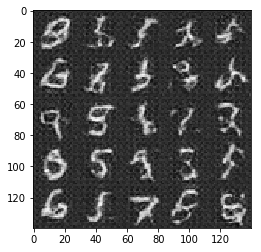

Epoch 2/2... Discriminator Loss: 0.0726... Generator Loss: 3.4068
Epoch 2/2... Discriminator Loss: 0.2883... Generator Loss: 1.7391
Epoch 2/2... Discriminator Loss: 0.0391... Generator Loss: 5.6838
Epoch 2/2... Discriminator Loss: 0.2269... Generator Loss: 1.8730
Epoch 2/2... Discriminator Loss: 0.0405... Generator Loss: 7.1180
Epoch 2/2... Discriminator Loss: 0.0447... Generator Loss: 4.0082
Epoch 2/2... Discriminator Loss: 0.0498... Generator Loss: 3.7188
Epoch 2/2... Discriminator Loss: 0.3318... Generator Loss: 1.6000
Epoch 2/2... Discriminator Loss: 0.1607... Generator Loss: 2.3333
Epoch 2/2... Discriminator Loss: 0.0583... Generator Loss: 5.2348


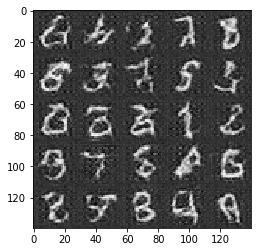

Epoch 2/2... Discriminator Loss: 0.1954... Generator Loss: 2.1804
Epoch 2/2... Discriminator Loss: 0.2503... Generator Loss: 1.9262
Epoch 2/2... Discriminator Loss: 0.0328... Generator Loss: 6.0901
Epoch 2/2... Discriminator Loss: 0.1001... Generator Loss: 2.9989
Epoch 2/2... Discriminator Loss: 0.1805... Generator Loss: 2.2136
Epoch 2/2... Discriminator Loss: 0.3070... Generator Loss: 2.4791
Epoch 2/2... Discriminator Loss: 0.6598... Generator Loss: 2.6782
Epoch 2/2... Discriminator Loss: 3.8434... Generator Loss: 0.0353
Epoch 2/2... Discriminator Loss: 8.6732... Generator Loss: 9.6609
Epoch 2/2... Discriminator Loss: 1.3953... Generator Loss: 2.0814


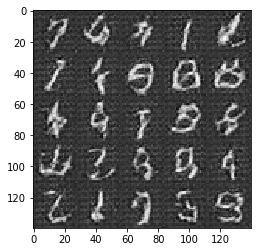

Epoch 2/2... Discriminator Loss: 4.3337... Generator Loss: 0.0349
Epoch 2/2... Discriminator Loss: 2.0570... Generator Loss: 3.7030
Epoch 2/2... Discriminator Loss: 1.2925... Generator Loss: 0.5908
Epoch 2/2... Discriminator Loss: 1.1227... Generator Loss: 1.3167
Epoch 2/2... Discriminator Loss: 1.0185... Generator Loss: 1.1814
Epoch 2/2... Discriminator Loss: 0.9324... Generator Loss: 1.0000
Epoch 2/2... Discriminator Loss: 0.9804... Generator Loss: 1.2340
Epoch 2/2... Discriminator Loss: 0.9097... Generator Loss: 1.1589
Epoch 2/2... Discriminator Loss: 0.8157... Generator Loss: 1.1544
Epoch 2/2... Discriminator Loss: 0.8079... Generator Loss: 1.1068


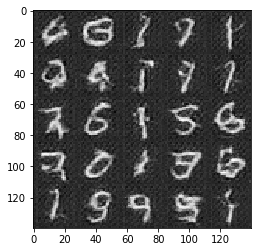

Epoch 2/2... Discriminator Loss: 0.7738... Generator Loss: 1.3457
Epoch 2/2... Discriminator Loss: 0.9045... Generator Loss: 0.9497
Epoch 2/2... Discriminator Loss: 0.9219... Generator Loss: 1.9917
Epoch 2/2... Discriminator Loss: 0.9907... Generator Loss: 0.6681
Epoch 2/2... Discriminator Loss: 1.0861... Generator Loss: 2.0784
Epoch 2/2... Discriminator Loss: 1.1425... Generator Loss: 0.5631
Epoch 2/2... Discriminator Loss: 1.1140... Generator Loss: 2.5533
Epoch 2/2... Discriminator Loss: 1.1975... Generator Loss: 0.5462
Epoch 2/2... Discriminator Loss: 0.9024... Generator Loss: 1.7877
Epoch 2/2... Discriminator Loss: 0.8047... Generator Loss: 1.0602


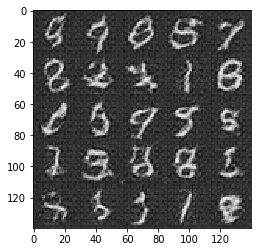

Epoch 2/2... Discriminator Loss: 0.7940... Generator Loss: 1.1277
Epoch 2/2... Discriminator Loss: 0.8482... Generator Loss: 1.7620
Epoch 2/2... Discriminator Loss: 0.9020... Generator Loss: 0.7487
Epoch 2/2... Discriminator Loss: 1.0881... Generator Loss: 2.5853
Epoch 2/2... Discriminator Loss: 0.9087... Generator Loss: 0.7970
Epoch 2/2... Discriminator Loss: 0.7181... Generator Loss: 1.4319
Epoch 2/2... Discriminator Loss: 0.7781... Generator Loss: 1.4349
Epoch 2/2... Discriminator Loss: 0.7941... Generator Loss: 1.0401
Epoch 2/2... Discriminator Loss: 0.7638... Generator Loss: 1.4617
Epoch 2/2... Discriminator Loss: 0.7043... Generator Loss: 1.1866


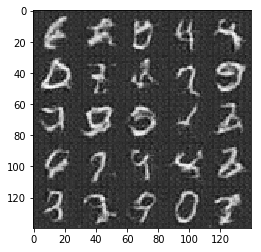

Epoch 2/2... Discriminator Loss: 0.6708... Generator Loss: 1.5380
Epoch 2/2... Discriminator Loss: 0.6510... Generator Loss: 1.2659
Epoch 2/2... Discriminator Loss: 0.7239... Generator Loss: 1.7357
Epoch 2/2... Discriminator Loss: 1.0587... Generator Loss: 0.6397
Epoch 2/2... Discriminator Loss: 1.7808... Generator Loss: 3.4818


NameError: name 'samples' is not defined

In [60]:
batch_size = 128
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 15.4814... Generator Loss: 0.0005


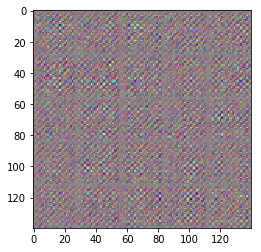

Epoch 1/1... Discriminator Loss: 0.9265... Generator Loss: 4.2445
Epoch 1/1... Discriminator Loss: 1.7310... Generator Loss: 2.4108
Epoch 1/1... Discriminator Loss: 0.8897... Generator Loss: 2.7849
Epoch 1/1... Discriminator Loss: 0.5604... Generator Loss: 14.8210
Epoch 1/1... Discriminator Loss: 6.2275... Generator Loss: 0.1163
Epoch 1/1... Discriminator Loss: 3.0866... Generator Loss: 23.6666
Epoch 1/1... Discriminator Loss: 0.2896... Generator Loss: 12.2903
Epoch 1/1... Discriminator Loss: 3.9086... Generator Loss: 1.2970
Epoch 1/1... Discriminator Loss: 3.2235... Generator Loss: 0.9078
Epoch 1/1... Discriminator Loss: 0.3666... Generator Loss: 8.1495


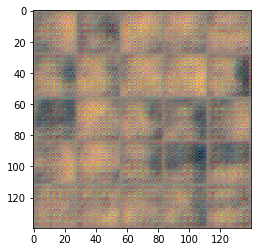

Epoch 1/1... Discriminator Loss: 0.3435... Generator Loss: 5.8124
Epoch 1/1... Discriminator Loss: 4.8763... Generator Loss: 0.2026
Epoch 1/1... Discriminator Loss: 7.2064... Generator Loss: 11.8029
Epoch 1/1... Discriminator Loss: 1.9231... Generator Loss: 2.0278
Epoch 1/1... Discriminator Loss: 2.5075... Generator Loss: 0.1652
Epoch 1/1... Discriminator Loss: 1.1988... Generator Loss: 2.2337
Epoch 1/1... Discriminator Loss: 1.3438... Generator Loss: 0.8345
Epoch 1/1... Discriminator Loss: 1.2253... Generator Loss: 1.0910
Epoch 1/1... Discriminator Loss: 1.6924... Generator Loss: 0.6484
Epoch 1/1... Discriminator Loss: 1.5104... Generator Loss: 4.3433


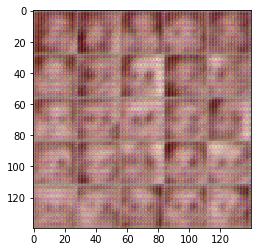

Epoch 1/1... Discriminator Loss: 3.5615... Generator Loss: 0.0924
Epoch 1/1... Discriminator Loss: 3.0920... Generator Loss: 7.1493
Epoch 1/1... Discriminator Loss: 0.9674... Generator Loss: 1.1972
Epoch 1/1... Discriminator Loss: 1.9040... Generator Loss: 0.3285
Epoch 1/1... Discriminator Loss: 1.3969... Generator Loss: 3.9094
Epoch 1/1... Discriminator Loss: 0.7535... Generator Loss: 1.2209
Epoch 1/1... Discriminator Loss: 1.3660... Generator Loss: 0.5486
Epoch 1/1... Discriminator Loss: 0.8750... Generator Loss: 2.6800
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.7300
Epoch 1/1... Discriminator Loss: 0.7957... Generator Loss: 2.7253


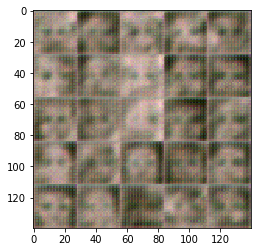

Epoch 1/1... Discriminator Loss: 1.0331... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 1.0546... Generator Loss: 4.0208
Epoch 1/1... Discriminator Loss: 1.5447... Generator Loss: 0.5389
Epoch 1/1... Discriminator Loss: 0.9445... Generator Loss: 6.2032
Epoch 1/1... Discriminator Loss: 1.3796... Generator Loss: 0.8598
Epoch 1/1... Discriminator Loss: 0.3154... Generator Loss: 4.9297
Epoch 1/1... Discriminator Loss: 0.2060... Generator Loss: 3.5531
Epoch 1/1... Discriminator Loss: 0.5691... Generator Loss: 1.3169
Epoch 1/1... Discriminator Loss: 0.2921... Generator Loss: 5.7580
Epoch 1/1... Discriminator Loss: 1.7129... Generator Loss: 0.3934


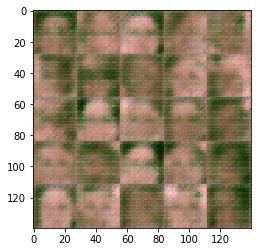

Epoch 1/1... Discriminator Loss: 7.2876... Generator Loss: 13.2007
Epoch 1/1... Discriminator Loss: 0.2341... Generator Loss: 3.0293
Epoch 1/1... Discriminator Loss: 1.0026... Generator Loss: 0.8249
Epoch 1/1... Discriminator Loss: 0.3610... Generator Loss: 1.9336
Epoch 1/1... Discriminator Loss: 0.2557... Generator Loss: 2.8648
Epoch 1/1... Discriminator Loss: 0.1768... Generator Loss: 2.8073
Epoch 1/1... Discriminator Loss: 0.1794... Generator Loss: 2.4720
Epoch 1/1... Discriminator Loss: 0.2153... Generator Loss: 2.2405
Epoch 1/1... Discriminator Loss: 0.1832... Generator Loss: 2.7765
Epoch 1/1... Discriminator Loss: 0.2370... Generator Loss: 2.2506


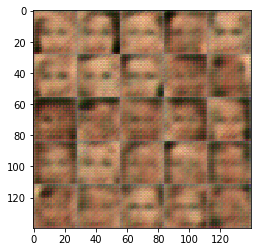

Epoch 1/1... Discriminator Loss: 0.2398... Generator Loss: 2.1944
Epoch 1/1... Discriminator Loss: 0.2413... Generator Loss: 2.5624
Epoch 1/1... Discriminator Loss: 0.4089... Generator Loss: 1.7415
Epoch 1/1... Discriminator Loss: 0.1763... Generator Loss: 4.4690
Epoch 1/1... Discriminator Loss: 0.0559... Generator Loss: 3.8846
Epoch 1/1... Discriminator Loss: 0.0927... Generator Loss: 2.7834
Epoch 1/1... Discriminator Loss: 0.2207... Generator Loss: 1.9226
Epoch 1/1... Discriminator Loss: 0.1316... Generator Loss: 2.4468
Epoch 1/1... Discriminator Loss: 0.1001... Generator Loss: 2.8413
Epoch 1/1... Discriminator Loss: 0.1269... Generator Loss: 2.5659


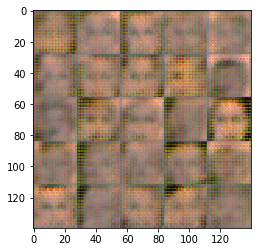

Epoch 1/1... Discriminator Loss: 0.1091... Generator Loss: 2.7435
Epoch 1/1... Discriminator Loss: 0.1397... Generator Loss: 2.4280
Epoch 1/1... Discriminator Loss: 0.1430... Generator Loss: 2.5285
Epoch 1/1... Discriminator Loss: 0.1621... Generator Loss: 2.4849
Epoch 1/1... Discriminator Loss: 0.1806... Generator Loss: 2.2746
Epoch 1/1... Discriminator Loss: 0.1731... Generator Loss: 2.4344
Epoch 1/1... Discriminator Loss: 0.1639... Generator Loss: 2.2467
Epoch 1/1... Discriminator Loss: 0.1872... Generator Loss: 2.4418
Epoch 1/1... Discriminator Loss: 0.5659... Generator Loss: 0.9909
Epoch 1/1... Discriminator Loss: 6.0628... Generator Loss: 7.6878


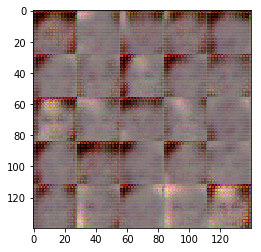

Epoch 1/1... Discriminator Loss: 6.2614... Generator Loss: 0.0042
Epoch 1/1... Discriminator Loss: 2.2868... Generator Loss: 4.5013
Epoch 1/1... Discriminator Loss: 1.7568... Generator Loss: 2.7455
Epoch 1/1... Discriminator Loss: 1.8423... Generator Loss: 0.7794
Epoch 1/1... Discriminator Loss: 1.7416... Generator Loss: 0.5075
Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 2.1878
Epoch 1/1... Discriminator Loss: 1.0450... Generator Loss: 1.3008
Epoch 1/1... Discriminator Loss: 0.7939... Generator Loss: 1.0902
Epoch 1/1... Discriminator Loss: 0.9298... Generator Loss: 0.9996
Epoch 1/1... Discriminator Loss: 1.1418... Generator Loss: 0.9400


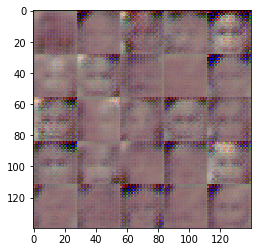

Epoch 1/1... Discriminator Loss: 1.0968... Generator Loss: 1.1294
Epoch 1/1... Discriminator Loss: 1.2178... Generator Loss: 0.9759
Epoch 1/1... Discriminator Loss: 1.6132... Generator Loss: 2.2988
Epoch 1/1... Discriminator Loss: 1.0895... Generator Loss: 0.8255
Epoch 1/1... Discriminator Loss: 0.7993... Generator Loss: 1.4857
Epoch 1/1... Discriminator Loss: 0.8061... Generator Loss: 1.2035
Epoch 1/1... Discriminator Loss: 0.7601... Generator Loss: 1.3171
Epoch 1/1... Discriminator Loss: 0.9484... Generator Loss: 0.9501
Epoch 1/1... Discriminator Loss: 1.1936... Generator Loss: 1.6412
Epoch 1/1... Discriminator Loss: 1.4540... Generator Loss: 0.8693


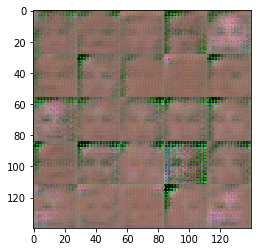

Epoch 1/1... Discriminator Loss: 0.8137... Generator Loss: 1.9180
Epoch 1/1... Discriminator Loss: 0.9423... Generator Loss: 0.8439
Epoch 1/1... Discriminator Loss: 0.7471... Generator Loss: 1.7575
Epoch 1/1... Discriminator Loss: 1.0263... Generator Loss: 1.0511
Epoch 1/1... Discriminator Loss: 0.9194... Generator Loss: 1.8679
Epoch 1/1... Discriminator Loss: 1.2593... Generator Loss: 0.8154
Epoch 1/1... Discriminator Loss: 1.5116... Generator Loss: 2.3641
Epoch 1/1... Discriminator Loss: 0.8754... Generator Loss: 0.7608
Epoch 1/1... Discriminator Loss: 0.7971... Generator Loss: 1.1936
Epoch 1/1... Discriminator Loss: 0.7076... Generator Loss: 1.7811


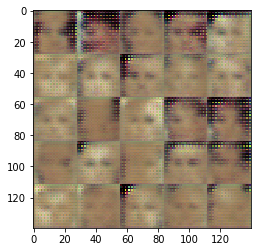

Epoch 1/1... Discriminator Loss: 0.7761... Generator Loss: 1.0296
Epoch 1/1... Discriminator Loss: 0.8128... Generator Loss: 2.1288
Epoch 1/1... Discriminator Loss: 1.0202... Generator Loss: 0.6343
Epoch 1/1... Discriminator Loss: 1.2638... Generator Loss: 3.2004
Epoch 1/1... Discriminator Loss: 1.4345... Generator Loss: 0.5199
Epoch 1/1... Discriminator Loss: 0.6670... Generator Loss: 2.0727
Epoch 1/1... Discriminator Loss: 0.5211... Generator Loss: 1.5714
Epoch 1/1... Discriminator Loss: 0.6240... Generator Loss: 1.0404
Epoch 1/1... Discriminator Loss: 0.7855... Generator Loss: 1.8332
Epoch 1/1... Discriminator Loss: 1.3191... Generator Loss: 0.6928


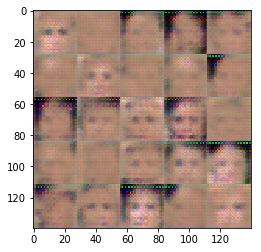

Epoch 1/1... Discriminator Loss: 2.4304... Generator Loss: 3.8947
Epoch 1/1... Discriminator Loss: 2.7588... Generator Loss: 0.1026
Epoch 1/1... Discriminator Loss: 0.4967... Generator Loss: 1.7726
Epoch 1/1... Discriminator Loss: 0.8220... Generator Loss: 2.1535
Epoch 1/1... Discriminator Loss: 0.6359... Generator Loss: 1.1738
Epoch 1/1... Discriminator Loss: 0.6860... Generator Loss: 1.2197
Epoch 1/1... Discriminator Loss: 0.6207... Generator Loss: 1.4760
Epoch 1/1... Discriminator Loss: 0.6366... Generator Loss: 1.3006
Epoch 1/1... Discriminator Loss: 0.4608... Generator Loss: 2.2180
Epoch 1/1... Discriminator Loss: 0.4118... Generator Loss: 1.4934


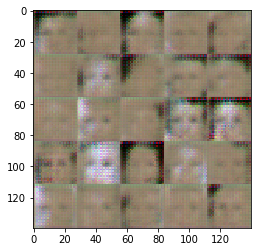

Epoch 1/1... Discriminator Loss: 0.4058... Generator Loss: 1.5531
Epoch 1/1... Discriminator Loss: 0.5397... Generator Loss: 1.4110
Epoch 1/1... Discriminator Loss: 0.7857... Generator Loss: 1.2794
Epoch 1/1... Discriminator Loss: 1.0689... Generator Loss: 1.0362
Epoch 1/1... Discriminator Loss: 3.3858... Generator Loss: 5.3974
Epoch 1/1... Discriminator Loss: 2.6928... Generator Loss: 0.1142
Epoch 1/1... Discriminator Loss: 1.4824... Generator Loss: 0.5309
Epoch 1/1... Discriminator Loss: 1.5817... Generator Loss: 1.7158
Epoch 1/1... Discriminator Loss: 0.8821... Generator Loss: 0.9549
Epoch 1/1... Discriminator Loss: 1.0434... Generator Loss: 0.8154


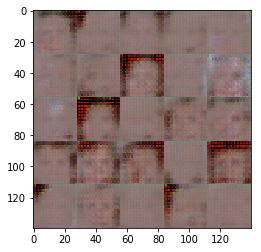

Epoch 1/1... Discriminator Loss: 0.8092... Generator Loss: 1.6975
Epoch 1/1... Discriminator Loss: 1.1557... Generator Loss: 0.8537
Epoch 1/1... Discriminator Loss: 1.3121... Generator Loss: 1.6008
Epoch 1/1... Discriminator Loss: 1.5112... Generator Loss: 0.5152
Epoch 1/1... Discriminator Loss: 1.3403... Generator Loss: 2.2807
Epoch 1/1... Discriminator Loss: 1.0701... Generator Loss: 0.7489
Epoch 1/1... Discriminator Loss: 0.9732... Generator Loss: 2.5256
Epoch 1/1... Discriminator Loss: 1.4459... Generator Loss: 0.5332
Epoch 1/1... Discriminator Loss: 1.2149... Generator Loss: 2.3772
Epoch 1/1... Discriminator Loss: 1.6783... Generator Loss: 0.3573


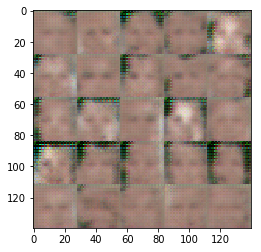

Epoch 1/1... Discriminator Loss: 2.0824... Generator Loss: 3.4709
Epoch 1/1... Discriminator Loss: 0.9951... Generator Loss: 0.7115
Epoch 1/1... Discriminator Loss: 0.7293... Generator Loss: 1.1029
Epoch 1/1... Discriminator Loss: 0.8882... Generator Loss: 1.9372
Epoch 1/1... Discriminator Loss: 1.0129... Generator Loss: 0.6840
Epoch 1/1... Discriminator Loss: 1.0870... Generator Loss: 2.4344
Epoch 1/1... Discriminator Loss: 1.9181... Generator Loss: 0.2709
Epoch 1/1... Discriminator Loss: 0.9503... Generator Loss: 2.0739
Epoch 1/1... Discriminator Loss: 0.5386... Generator Loss: 1.5687
Epoch 1/1... Discriminator Loss: 0.7578... Generator Loss: 1.2064


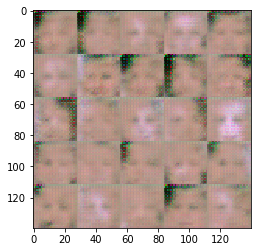

Epoch 1/1... Discriminator Loss: 0.7946... Generator Loss: 1.4714
Epoch 1/1... Discriminator Loss: 0.6933... Generator Loss: 1.3610
Epoch 1/1... Discriminator Loss: 0.6666... Generator Loss: 1.1523
Epoch 1/1... Discriminator Loss: 0.3954... Generator Loss: 4.1281
Epoch 1/1... Discriminator Loss: 0.4595... Generator Loss: 1.5947
Epoch 1/1... Discriminator Loss: 0.1863... Generator Loss: 4.4009
Epoch 1/1... Discriminator Loss: 0.2889... Generator Loss: 2.4152
Epoch 1/1... Discriminator Loss: 0.2695... Generator Loss: 2.1161
Epoch 1/1... Discriminator Loss: 0.3150... Generator Loss: 2.7991
Epoch 1/1... Discriminator Loss: 1.9264... Generator Loss: 0.3363


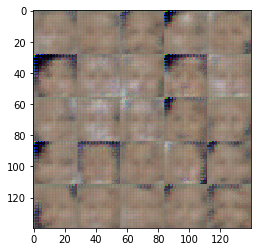

Epoch 1/1... Discriminator Loss: 6.5372... Generator Loss: 6.4276
Epoch 1/1... Discriminator Loss: 1.4570... Generator Loss: 2.9365
Epoch 1/1... Discriminator Loss: 1.8887... Generator Loss: 0.2425
Epoch 1/1... Discriminator Loss: 0.9777... Generator Loss: 0.8061
Epoch 1/1... Discriminator Loss: 1.2880... Generator Loss: 1.4224
Epoch 1/1... Discriminator Loss: 1.5886... Generator Loss: 0.5344
Epoch 1/1... Discriminator Loss: 1.4888... Generator Loss: 0.8858
Epoch 1/1... Discriminator Loss: 1.1708... Generator Loss: 1.5579
Epoch 1/1... Discriminator Loss: 0.4795... Generator Loss: 1.5868
Epoch 1/1... Discriminator Loss: 0.9751... Generator Loss: 0.6436


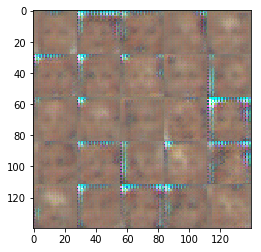

Epoch 1/1... Discriminator Loss: 0.5003... Generator Loss: 2.1015
Epoch 1/1... Discriminator Loss: 0.4505... Generator Loss: 2.1062
Epoch 1/1... Discriminator Loss: 0.4206... Generator Loss: 1.5779
Epoch 1/1... Discriminator Loss: 0.6942... Generator Loss: 1.5298
Epoch 1/1... Discriminator Loss: 0.5449... Generator Loss: 3.0336
Epoch 1/1... Discriminator Loss: 0.4101... Generator Loss: 2.8807
Epoch 1/1... Discriminator Loss: 0.7131... Generator Loss: 1.1898
Epoch 1/1... Discriminator Loss: 0.5542... Generator Loss: 2.8334
Epoch 1/1... Discriminator Loss: 0.4678... Generator Loss: 1.4426
Epoch 1/1... Discriminator Loss: 0.6384... Generator Loss: 1.2717


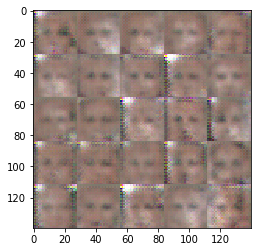

Epoch 1/1... Discriminator Loss: 0.3444... Generator Loss: 3.9121
Epoch 1/1... Discriminator Loss: 0.2715... Generator Loss: 2.4725
Epoch 1/1... Discriminator Loss: 0.7591... Generator Loss: 1.0195
Epoch 1/1... Discriminator Loss: 5.5104... Generator Loss: 5.6843
Epoch 1/1... Discriminator Loss: 0.8949... Generator Loss: 2.1519
Epoch 1/1... Discriminator Loss: 2.9091... Generator Loss: 0.2746
Epoch 1/1... Discriminator Loss: 3.8416... Generator Loss: 3.5262
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.8776
Epoch 1/1... Discriminator Loss: 1.4066... Generator Loss: 0.4535
Epoch 1/1... Discriminator Loss: 0.9539... Generator Loss: 0.9307


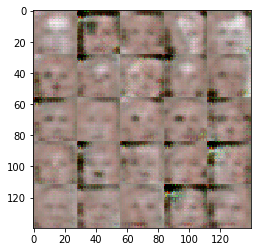

Epoch 1/1... Discriminator Loss: 0.8596... Generator Loss: 1.1900
Epoch 1/1... Discriminator Loss: 1.3198... Generator Loss: 0.5509
Epoch 1/1... Discriminator Loss: 1.3104... Generator Loss: 0.8719
Epoch 1/1... Discriminator Loss: 1.1097... Generator Loss: 1.2879
Epoch 1/1... Discriminator Loss: 0.8684... Generator Loss: 1.0295
Epoch 1/1... Discriminator Loss: 0.8423... Generator Loss: 1.6016
Epoch 1/1... Discriminator Loss: 1.9857... Generator Loss: 0.2359
Epoch 1/1... Discriminator Loss: 1.6186... Generator Loss: 1.7912
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.4002
Epoch 1/1... Discriminator Loss: 0.7872... Generator Loss: 1.8047


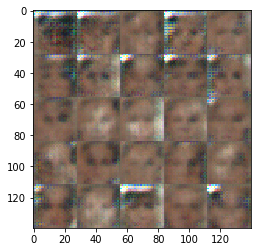

Epoch 1/1... Discriminator Loss: 0.8157... Generator Loss: 1.7848
Epoch 1/1... Discriminator Loss: 1.1951... Generator Loss: 0.8950
Epoch 1/1... Discriminator Loss: 0.9045... Generator Loss: 1.7778
Epoch 1/1... Discriminator Loss: 1.0304... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 0.9271... Generator Loss: 1.3493
Epoch 1/1... Discriminator Loss: 1.2102... Generator Loss: 0.8051
Epoch 1/1... Discriminator Loss: 1.5808... Generator Loss: 0.6261
Epoch 1/1... Discriminator Loss: 1.1634... Generator Loss: 1.2570
Epoch 1/1... Discriminator Loss: 1.1959... Generator Loss: 0.8915
Epoch 1/1... Discriminator Loss: 0.9443... Generator Loss: 2.2733


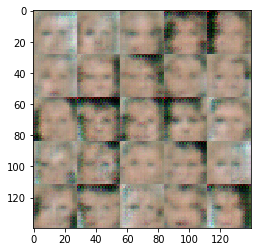

Epoch 1/1... Discriminator Loss: 1.4458... Generator Loss: 0.4003
Epoch 1/1... Discriminator Loss: 4.1307... Generator Loss: 4.4040
Epoch 1/1... Discriminator Loss: 1.2294... Generator Loss: 1.1545
Epoch 1/1... Discriminator Loss: 1.6399... Generator Loss: 0.3232
Epoch 1/1... Discriminator Loss: 1.1404... Generator Loss: 1.0159
Epoch 1/1... Discriminator Loss: 1.2212... Generator Loss: 1.1077
Epoch 1/1... Discriminator Loss: 1.6797... Generator Loss: 0.6725
Epoch 1/1... Discriminator Loss: 1.4587... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.0021... Generator Loss: 1.8187
Epoch 1/1... Discriminator Loss: 0.5801... Generator Loss: 1.4266


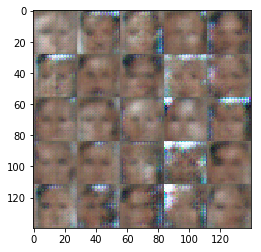

Epoch 1/1... Discriminator Loss: 0.6508... Generator Loss: 1.7721
Epoch 1/1... Discriminator Loss: 0.6384... Generator Loss: 1.1284
Epoch 1/1... Discriminator Loss: 0.5623... Generator Loss: 1.3360
Epoch 1/1... Discriminator Loss: 0.6147... Generator Loss: 1.2581
Epoch 1/1... Discriminator Loss: 0.6453... Generator Loss: 1.5081
Epoch 1/1... Discriminator Loss: 0.7835... Generator Loss: 0.9431
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 1.1000
Epoch 1/1... Discriminator Loss: 0.8042... Generator Loss: 0.9521
Epoch 1/1... Discriminator Loss: 2.0259... Generator Loss: 4.1405
Epoch 1/1... Discriminator Loss: 2.3814... Generator Loss: 0.2297


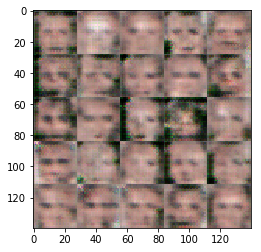

Epoch 1/1... Discriminator Loss: 4.9407... Generator Loss: 4.8358
Epoch 1/1... Discriminator Loss: 2.0183... Generator Loss: 1.8187
Epoch 1/1... Discriminator Loss: 1.8461... Generator Loss: 0.2948
Epoch 1/1... Discriminator Loss: 1.4222... Generator Loss: 0.7862
Epoch 1/1... Discriminator Loss: 1.1791... Generator Loss: 1.5090
Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 1.2727
Epoch 1/1... Discriminator Loss: 1.2578... Generator Loss: 0.8207
Epoch 1/1... Discriminator Loss: 1.3789... Generator Loss: 0.7843
Epoch 1/1... Discriminator Loss: 1.2033... Generator Loss: 0.8214
Epoch 1/1... Discriminator Loss: 1.1086... Generator Loss: 1.1784


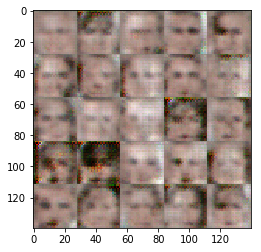

Epoch 1/1... Discriminator Loss: 1.0461... Generator Loss: 0.9354
Epoch 1/1... Discriminator Loss: 0.9991... Generator Loss: 0.8197
Epoch 1/1... Discriminator Loss: 0.9980... Generator Loss: 1.1634
Epoch 1/1... Discriminator Loss: 1.0454... Generator Loss: 0.9490
Epoch 1/1... Discriminator Loss: 1.0036... Generator Loss: 0.9524
Epoch 1/1... Discriminator Loss: 1.0209... Generator Loss: 0.9155
Epoch 1/1... Discriminator Loss: 1.1161... Generator Loss: 1.0824
Epoch 1/1... Discriminator Loss: 1.2192... Generator Loss: 0.7529
Epoch 1/1... Discriminator Loss: 1.2577... Generator Loss: 0.7927
Epoch 1/1... Discriminator Loss: 1.4063... Generator Loss: 0.7731


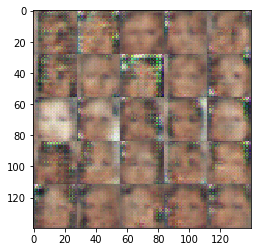

Epoch 1/1... Discriminator Loss: 1.7380... Generator Loss: 0.5198
Epoch 1/1... Discriminator Loss: 1.4634... Generator Loss: 1.0671
Epoch 1/1... Discriminator Loss: 1.5946... Generator Loss: 0.4593
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 1.9374
Epoch 1/1... Discriminator Loss: 1.5087... Generator Loss: 0.3948
Epoch 1/1... Discriminator Loss: 1.0155... Generator Loss: 1.8397
Epoch 1/1... Discriminator Loss: 1.4358... Generator Loss: 0.4428
Epoch 1/1... Discriminator Loss: 1.0269... Generator Loss: 1.0574
Epoch 1/1... Discriminator Loss: 1.1242... Generator Loss: 1.0268
Epoch 1/1... Discriminator Loss: 0.9912... Generator Loss: 0.8941


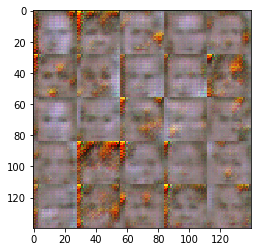

Epoch 1/1... Discriminator Loss: 0.8513... Generator Loss: 0.9900
Epoch 1/1... Discriminator Loss: 0.7657... Generator Loss: 1.5771
Epoch 1/1... Discriminator Loss: 1.8587... Generator Loss: 0.2674
Epoch 1/1... Discriminator Loss: 3.0515... Generator Loss: 3.7078
Epoch 1/1... Discriminator Loss: 1.6627... Generator Loss: 0.3007
Epoch 1/1... Discriminator Loss: 1.3104... Generator Loss: 2.0722
Epoch 1/1... Discriminator Loss: 1.1132... Generator Loss: 0.6538
Epoch 1/1... Discriminator Loss: 0.8706... Generator Loss: 1.3298
Epoch 1/1... Discriminator Loss: 0.9873... Generator Loss: 0.8764
Epoch 1/1... Discriminator Loss: 1.0653... Generator Loss: 0.8572


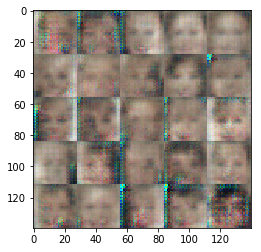

Epoch 1/1... Discriminator Loss: 0.5946... Generator Loss: 2.2180
Epoch 1/1... Discriminator Loss: 1.6552... Generator Loss: 0.2797
Epoch 1/1... Discriminator Loss: 1.4860... Generator Loss: 3.7044
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 0.5090
Epoch 1/1... Discriminator Loss: 1.3907... Generator Loss: 2.1505
Epoch 1/1... Discriminator Loss: 1.6298... Generator Loss: 0.3188
Epoch 1/1... Discriminator Loss: 2.0661... Generator Loss: 3.5392
Epoch 1/1... Discriminator Loss: 1.0627... Generator Loss: 0.7359
Epoch 1/1... Discriminator Loss: 1.1775... Generator Loss: 0.6334
Epoch 1/1... Discriminator Loss: 1.4779... Generator Loss: 1.7512


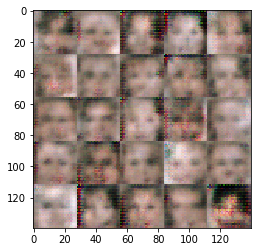

Epoch 1/1... Discriminator Loss: 2.3744... Generator Loss: 0.1430
Epoch 1/1... Discriminator Loss: 2.8837... Generator Loss: 3.4336
Epoch 1/1... Discriminator Loss: 1.2304... Generator Loss: 1.5975
Epoch 1/1... Discriminator Loss: 1.5273... Generator Loss: 0.3743
Epoch 1/1... Discriminator Loss: 1.1042... Generator Loss: 1.0787
Epoch 1/1... Discriminator Loss: 1.1285... Generator Loss: 1.2435
Epoch 1/1... Discriminator Loss: 1.5072... Generator Loss: 0.4141
Epoch 1/1... Discriminator Loss: 1.3016... Generator Loss: 0.9157
Epoch 1/1... Discriminator Loss: 1.1127... Generator Loss: 0.9056
Epoch 1/1... Discriminator Loss: 0.8229... Generator Loss: 1.3203


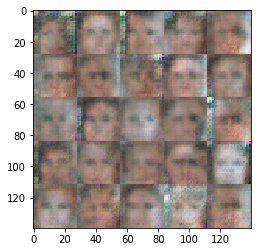

Epoch 1/1... Discriminator Loss: 1.4012... Generator Loss: 0.3940
Epoch 1/1... Discriminator Loss: 1.0329... Generator Loss: 1.1836
Epoch 1/1... Discriminator Loss: 0.7748... Generator Loss: 1.5112
Epoch 1/1... Discriminator Loss: 0.7058... Generator Loss: 1.0681
Epoch 1/1... Discriminator Loss: 0.9756... Generator Loss: 0.7228
Epoch 1/1... Discriminator Loss: 0.9722... Generator Loss: 1.6931
Epoch 1/1... Discriminator Loss: 0.6330... Generator Loss: 1.3414
Epoch 1/1... Discriminator Loss: 0.5010... Generator Loss: 1.3841
Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.4007
Epoch 1/1... Discriminator Loss: 2.2494... Generator Loss: 3.0662


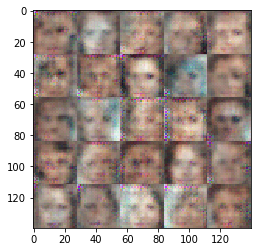

Epoch 1/1... Discriminator Loss: 1.3502... Generator Loss: 1.0038
Epoch 1/1... Discriminator Loss: 1.3564... Generator Loss: 0.5752
Epoch 1/1... Discriminator Loss: 1.1604... Generator Loss: 1.0039
Epoch 1/1... Discriminator Loss: 1.1041... Generator Loss: 0.9849
Epoch 1/1... Discriminator Loss: 0.6366... Generator Loss: 1.6756
Epoch 1/1... Discriminator Loss: 0.9392... Generator Loss: 0.8278
Epoch 1/1... Discriminator Loss: 2.2603... Generator Loss: 2.2844
Epoch 1/1... Discriminator Loss: 3.2960... Generator Loss: 0.0562
Epoch 1/1... Discriminator Loss: 3.7656... Generator Loss: 3.3590
Epoch 1/1... Discriminator Loss: 2.3331... Generator Loss: 1.7769


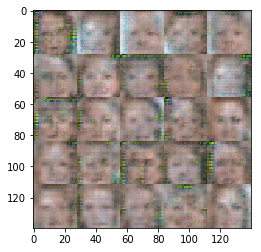

Epoch 1/1... Discriminator Loss: 1.6437... Generator Loss: 0.4935
Epoch 1/1... Discriminator Loss: 1.6514... Generator Loss: 0.4404
Epoch 1/1... Discriminator Loss: 1.5425... Generator Loss: 0.6347
Epoch 1/1... Discriminator Loss: 1.5265... Generator Loss: 0.8830
Epoch 1/1... Discriminator Loss: 1.5571... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.5555... Generator Loss: 0.5850
Epoch 1/1... Discriminator Loss: 1.5964... Generator Loss: 0.4685
Epoch 1/1... Discriminator Loss: 1.5119... Generator Loss: 0.6385
Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.8569
Epoch 1/1... Discriminator Loss: 1.3138... Generator Loss: 0.7807


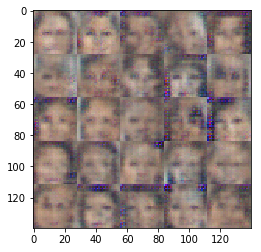

Epoch 1/1... Discriminator Loss: 1.2940... Generator Loss: 0.7367
Epoch 1/1... Discriminator Loss: 1.4557... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.7166
Epoch 1/1... Discriminator Loss: 1.4540... Generator Loss: 0.8719
Epoch 1/1... Discriminator Loss: 1.5830... Generator Loss: 0.6856
Epoch 1/1... Discriminator Loss: 1.6009... Generator Loss: 0.6993
Epoch 1/1... Discriminator Loss: 1.4873... Generator Loss: 0.8816
Epoch 1/1... Discriminator Loss: 1.3449... Generator Loss: 0.8970
Epoch 1/1... Discriminator Loss: 1.3242... Generator Loss: 0.7271
Epoch 1/1... Discriminator Loss: 1.2780... Generator Loss: 1.1358


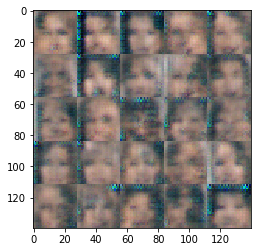

Epoch 1/1... Discriminator Loss: 1.2852... Generator Loss: 0.6890
Epoch 1/1... Discriminator Loss: 1.2829... Generator Loss: 0.7620
Epoch 1/1... Discriminator Loss: 1.3608... Generator Loss: 0.8012
Epoch 1/1... Discriminator Loss: 1.3044... Generator Loss: 0.8066
Epoch 1/1... Discriminator Loss: 1.2970... Generator Loss: 0.7582
Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.7613
Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.7947
Epoch 1/1... Discriminator Loss: 1.3260... Generator Loss: 0.8816
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.6969
Epoch 1/1... Discriminator Loss: 1.2843... Generator Loss: 0.8041


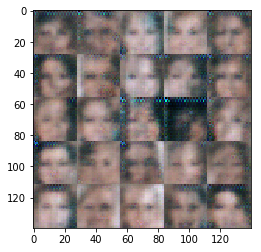

Epoch 1/1... Discriminator Loss: 1.2750... Generator Loss: 0.7562
Epoch 1/1... Discriminator Loss: 1.3113... Generator Loss: 0.7767
Epoch 1/1... Discriminator Loss: 1.2869... Generator Loss: 0.8350
Epoch 1/1... Discriminator Loss: 1.2711... Generator Loss: 0.7780
Epoch 1/1... Discriminator Loss: 1.1930... Generator Loss: 0.7757
Epoch 1/1... Discriminator Loss: 1.1971... Generator Loss: 0.6496
Epoch 1/1... Discriminator Loss: 1.2885... Generator Loss: 1.0418
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.2206... Generator Loss: 0.9455
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.7087


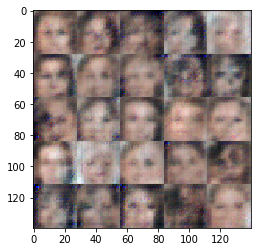

Epoch 1/1... Discriminator Loss: 1.2516... Generator Loss: 0.9228
Epoch 1/1... Discriminator Loss: 1.2912... Generator Loss: 0.6210
Epoch 1/1... Discriminator Loss: 1.4133... Generator Loss: 1.1063
Epoch 1/1... Discriminator Loss: 1.4873... Generator Loss: 0.5522
Epoch 1/1... Discriminator Loss: 1.3962... Generator Loss: 0.9359
Epoch 1/1... Discriminator Loss: 1.3609... Generator Loss: 0.8647
Epoch 1/1... Discriminator Loss: 1.4360... Generator Loss: 0.6248
Epoch 1/1... Discriminator Loss: 1.2545... Generator Loss: 0.8657
Epoch 1/1... Discriminator Loss: 1.3072... Generator Loss: 0.7282
Epoch 1/1... Discriminator Loss: 1.3020... Generator Loss: 0.8867


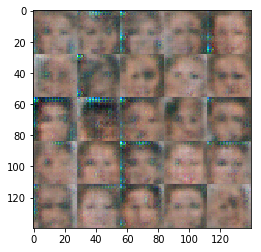

Epoch 1/1... Discriminator Loss: 1.4081... Generator Loss: 0.5937
Epoch 1/1... Discriminator Loss: 1.4634... Generator Loss: 0.9604
Epoch 1/1... Discriminator Loss: 1.5604... Generator Loss: 0.4878
Epoch 1/1... Discriminator Loss: 1.5541... Generator Loss: 1.1500
Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.2923... Generator Loss: 0.8490
Epoch 1/1... Discriminator Loss: 1.1430... Generator Loss: 0.7953
Epoch 1/1... Discriminator Loss: 1.1892... Generator Loss: 0.9031
Epoch 1/1... Discriminator Loss: 1.3094... Generator Loss: 0.7643
Epoch 1/1... Discriminator Loss: 1.4193... Generator Loss: 0.5398


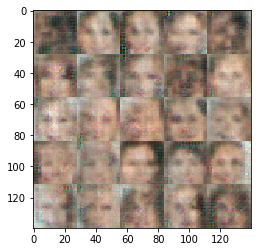

Epoch 1/1... Discriminator Loss: 1.4881... Generator Loss: 1.1165
Epoch 1/1... Discriminator Loss: 1.6565... Generator Loss: 0.4700
Epoch 1/1... Discriminator Loss: 1.3948... Generator Loss: 1.0047
Epoch 1/1... Discriminator Loss: 1.2938... Generator Loss: 0.8099
Epoch 1/1... Discriminator Loss: 1.1932... Generator Loss: 0.8269
Epoch 1/1... Discriminator Loss: 1.1740... Generator Loss: 0.9423
Epoch 1/1... Discriminator Loss: 1.1639... Generator Loss: 0.8015
Epoch 1/1... Discriminator Loss: 1.0791... Generator Loss: 0.9045
Epoch 1/1... Discriminator Loss: 1.1364... Generator Loss: 0.8075
Epoch 1/1... Discriminator Loss: 1.1151... Generator Loss: 0.8361


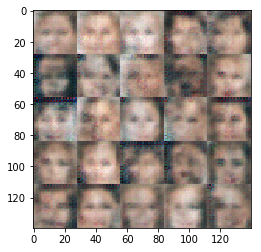

Epoch 1/1... Discriminator Loss: 1.3036... Generator Loss: 0.7674
Epoch 1/1... Discriminator Loss: 1.3045... Generator Loss: 0.6070
Epoch 1/1... Discriminator Loss: 1.3602... Generator Loss: 1.3150
Epoch 1/1... Discriminator Loss: 1.6919... Generator Loss: 0.3456
Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 0.9350
Epoch 1/1... Discriminator Loss: 1.2617... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.2789... Generator Loss: 0.6465
Epoch 1/1... Discriminator Loss: 1.2151... Generator Loss: 1.0885
Epoch 1/1... Discriminator Loss: 1.2878... Generator Loss: 0.6144
Epoch 1/1... Discriminator Loss: 1.2532... Generator Loss: 0.9062


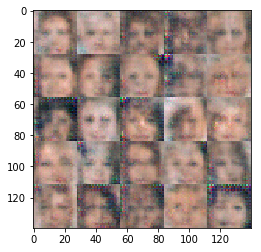

Epoch 1/1... Discriminator Loss: 1.4202... Generator Loss: 0.6717
Epoch 1/1... Discriminator Loss: 1.3423... Generator Loss: 0.7694
Epoch 1/1... Discriminator Loss: 1.4352... Generator Loss: 0.5569
Epoch 1/1... Discriminator Loss: 1.3952... Generator Loss: 1.0732
Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 0.6291
Epoch 1/1... Discriminator Loss: 1.3266... Generator Loss: 0.7043
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.6895
Epoch 1/1... Discriminator Loss: 1.4241... Generator Loss: 0.8368
Epoch 1/1... Discriminator Loss: 1.4069... Generator Loss: 0.6677
Epoch 1/1... Discriminator Loss: 1.3797... Generator Loss: 0.8086


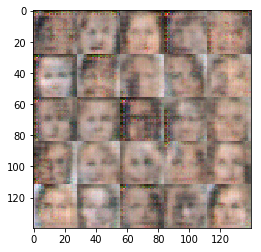

Epoch 1/1... Discriminator Loss: 1.3615... Generator Loss: 0.7328
Epoch 1/1... Discriminator Loss: 1.2528... Generator Loss: 0.8611
Epoch 1/1... Discriminator Loss: 1.3248... Generator Loss: 0.7704
Epoch 1/1... Discriminator Loss: 1.2995... Generator Loss: 0.6775
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.9186
Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.5876
Epoch 1/1... Discriminator Loss: 1.3517... Generator Loss: 0.9591
Epoch 1/1... Discriminator Loss: 1.3923... Generator Loss: 0.5392
Epoch 1/1... Discriminator Loss: 1.3371... Generator Loss: 1.0581
Epoch 1/1... Discriminator Loss: 1.3376... Generator Loss: 0.6091


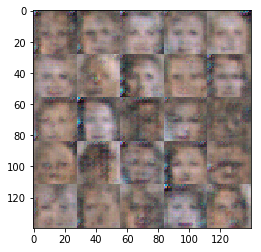

Epoch 1/1... Discriminator Loss: 1.2534... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.2444... Generator Loss: 1.0428
Epoch 1/1... Discriminator Loss: 1.2345... Generator Loss: 0.6847
Epoch 1/1... Discriminator Loss: 1.1479... Generator Loss: 0.9115
Epoch 1/1... Discriminator Loss: 1.2527... Generator Loss: 0.8390
Epoch 1/1... Discriminator Loss: 1.4172... Generator Loss: 0.5936
Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.7732
Epoch 1/1... Discriminator Loss: 1.3475... Generator Loss: 0.7006
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.8237
Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.7229


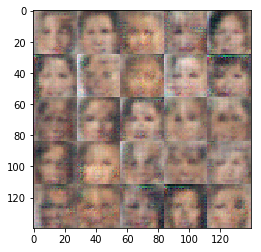

Epoch 1/1... Discriminator Loss: 1.3049... Generator Loss: 0.8346
Epoch 1/1... Discriminator Loss: 1.3479... Generator Loss: 0.5841
Epoch 1/1... Discriminator Loss: 1.5372... Generator Loss: 1.1438
Epoch 1/1... Discriminator Loss: 1.6272... Generator Loss: 0.3675
Epoch 1/1... Discriminator Loss: 1.4996... Generator Loss: 1.1202
Epoch 1/1... Discriminator Loss: 1.4753... Generator Loss: 0.5423
Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 0.9142
Epoch 1/1... Discriminator Loss: 1.3835... Generator Loss: 0.6978
Epoch 1/1... Discriminator Loss: 1.3466... Generator Loss: 0.7903
Epoch 1/1... Discriminator Loss: 1.2427... Generator Loss: 0.7761


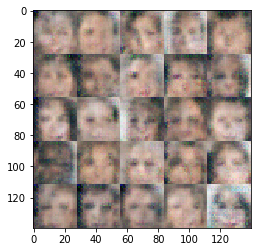

Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.2327... Generator Loss: 0.7460
Epoch 1/1... Discriminator Loss: 1.2366... Generator Loss: 1.0360
Epoch 1/1... Discriminator Loss: 1.2808... Generator Loss: 0.5148
Epoch 1/1... Discriminator Loss: 1.2709... Generator Loss: 1.2947
Epoch 1/1... Discriminator Loss: 1.2137... Generator Loss: 0.5887
Epoch 1/1... Discriminator Loss: 1.2456... Generator Loss: 0.7769
Epoch 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.8457
Epoch 1/1... Discriminator Loss: 1.2963... Generator Loss: 0.6056
Epoch 1/1... Discriminator Loss: 1.5595... Generator Loss: 1.1752


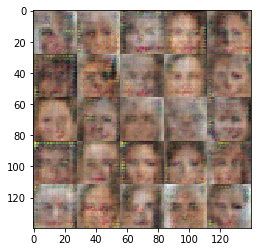

Epoch 1/1... Discriminator Loss: 1.7434... Generator Loss: 0.3007
Epoch 1/1... Discriminator Loss: 1.3148... Generator Loss: 0.9367
Epoch 1/1... Discriminator Loss: 1.2489... Generator Loss: 0.9794
Epoch 1/1... Discriminator Loss: 1.3137... Generator Loss: 0.5692
Epoch 1/1... Discriminator Loss: 1.3093... Generator Loss: 0.9816
Epoch 1/1... Discriminator Loss: 1.1879... Generator Loss: 0.8826
Epoch 1/1... Discriminator Loss: 1.3449... Generator Loss: 0.5489
Epoch 1/1... Discriminator Loss: 1.2876... Generator Loss: 1.3308
Epoch 1/1... Discriminator Loss: 1.4568... Generator Loss: 0.3957
Epoch 1/1... Discriminator Loss: 1.1755... Generator Loss: 1.0732


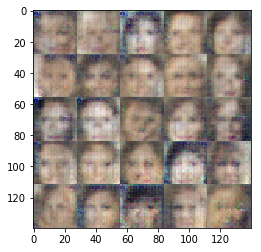

Epoch 1/1... Discriminator Loss: 1.2702... Generator Loss: 0.8136
Epoch 1/1... Discriminator Loss: 1.3408... Generator Loss: 0.5268
Epoch 1/1... Discriminator Loss: 1.4997... Generator Loss: 0.9675
Epoch 1/1... Discriminator Loss: 1.7298... Generator Loss: 0.3013
Epoch 1/1... Discriminator Loss: 1.7676... Generator Loss: 1.5440
Epoch 1/1... Discriminator Loss: 1.3377... Generator Loss: 0.5214
Epoch 1/1... Discriminator Loss: 1.3111... Generator Loss: 0.8073
Epoch 1/1... Discriminator Loss: 1.2468... Generator Loss: 0.9952
Epoch 1/1... Discriminator Loss: 1.4037... Generator Loss: 0.6293
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 1.0918


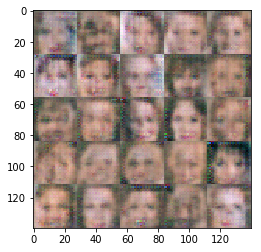

Epoch 1/1... Discriminator Loss: 1.3000... Generator Loss: 0.6203
Epoch 1/1... Discriminator Loss: 1.1409... Generator Loss: 1.0578
Epoch 1/1... Discriminator Loss: 1.1462... Generator Loss: 0.7592
Epoch 1/1... Discriminator Loss: 1.2883... Generator Loss: 0.8649
Epoch 1/1... Discriminator Loss: 1.3891... Generator Loss: 0.5680
Epoch 1/1... Discriminator Loss: 0.9148... Generator Loss: 1.7792
Epoch 1/1... Discriminator Loss: 2.2389... Generator Loss: 0.1726
Epoch 1/1... Discriminator Loss: 1.6243... Generator Loss: 1.5000
Epoch 1/1... Discriminator Loss: 1.1863... Generator Loss: 0.7490
Epoch 1/1... Discriminator Loss: 1.1972... Generator Loss: 0.5314


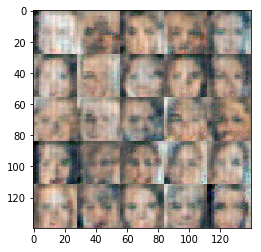

Epoch 1/1... Discriminator Loss: 1.2984... Generator Loss: 1.1704
Epoch 1/1... Discriminator Loss: 1.5428... Generator Loss: 0.4159
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 1.3858
Epoch 1/1... Discriminator Loss: 1.0175... Generator Loss: 0.8154
Epoch 1/1... Discriminator Loss: 1.1120... Generator Loss: 0.7904
Epoch 1/1... Discriminator Loss: 0.8683... Generator Loss: 1.4302
Epoch 1/1... Discriminator Loss: 0.6432... Generator Loss: 0.9656
Epoch 1/1... Discriminator Loss: 0.8191... Generator Loss: 1.2586
Epoch 1/1... Discriminator Loss: 0.8314... Generator Loss: 2.6680
Epoch 1/1... Discriminator Loss: 0.9495... Generator Loss: 0.6291


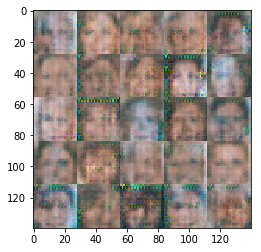

Epoch 1/1... Discriminator Loss: 1.6368... Generator Loss: 1.1672
Epoch 1/1... Discriminator Loss: 1.9115... Generator Loss: 0.2316
Epoch 1/1... Discriminator Loss: 1.2840... Generator Loss: 1.3318
Epoch 1/1... Discriminator Loss: 0.9875... Generator Loss: 0.7045
Epoch 1/1... Discriminator Loss: 1.1952... Generator Loss: 1.6517
Epoch 1/1... Discriminator Loss: 1.2550... Generator Loss: 0.4726
Epoch 1/1... Discriminator Loss: 4.1174... Generator Loss: 4.1935
Epoch 1/1... Discriminator Loss: 1.4616... Generator Loss: 0.6174
Epoch 1/1... Discriminator Loss: 1.5812... Generator Loss: 0.4525
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 1.2022


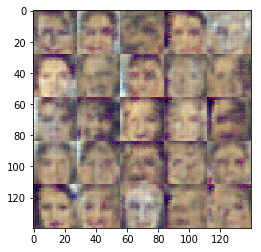

Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 0.5449
Epoch 1/1... Discriminator Loss: 1.1568... Generator Loss: 0.7582
Epoch 1/1... Discriminator Loss: 1.4097... Generator Loss: 0.9692
Epoch 1/1... Discriminator Loss: 1.1673... Generator Loss: 0.6351
Epoch 1/1... Discriminator Loss: 0.6705... Generator Loss: 2.9589
Epoch 1/1... Discriminator Loss: 0.3735... Generator Loss: 1.6198
Epoch 1/1... Discriminator Loss: 0.5532... Generator Loss: 1.0470
Epoch 1/1... Discriminator Loss: 0.3728... Generator Loss: 1.4928
Epoch 1/1... Discriminator Loss: 0.2873... Generator Loss: 1.8224
Epoch 1/1... Discriminator Loss: 0.3548... Generator Loss: 1.7001


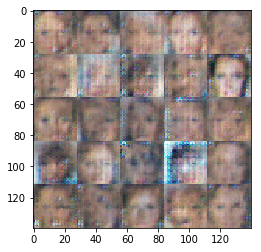

Epoch 1/1... Discriminator Loss: 0.4748... Generator Loss: 1.2563
Epoch 1/1... Discriminator Loss: 1.0701... Generator Loss: 2.2948
Epoch 1/1... Discriminator Loss: 3.1448... Generator Loss: 0.0717
Epoch 1/1... Discriminator Loss: 5.7273... Generator Loss: 4.7195
Epoch 1/1... Discriminator Loss: 2.9960... Generator Loss: 2.1265
Epoch 1/1... Discriminator Loss: 2.1055... Generator Loss: 0.2933
Epoch 1/1... Discriminator Loss: 2.0561... Generator Loss: 0.2788
Epoch 1/1... Discriminator Loss: 1.6697... Generator Loss: 0.9027
Epoch 1/1... Discriminator Loss: 1.4603... Generator Loss: 1.1470
Epoch 1/1... Discriminator Loss: 1.2518... Generator Loss: 0.8537


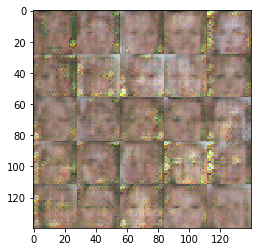

Epoch 1/1... Discriminator Loss: 1.2331... Generator Loss: 0.6727
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.9536
Epoch 1/1... Discriminator Loss: 1.3687... Generator Loss: 0.7547
Epoch 1/1... Discriminator Loss: 1.4167... Generator Loss: 0.6650
Epoch 1/1... Discriminator Loss: 1.5223... Generator Loss: 0.7189
Epoch 1/1... Discriminator Loss: 1.4082... Generator Loss: 0.6714
Epoch 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.6649
Epoch 1/1... Discriminator Loss: 1.3886... Generator Loss: 0.6696
Epoch 1/1... Discriminator Loss: 1.2414... Generator Loss: 0.7492
Epoch 1/1... Discriminator Loss: 1.3013... Generator Loss: 0.7678


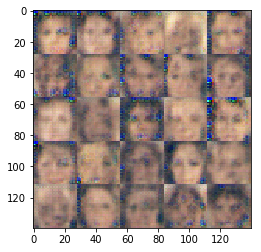

Epoch 1/1... Discriminator Loss: 1.2834... Generator Loss: 0.8374
Epoch 1/1... Discriminator Loss: 1.2291... Generator Loss: 0.7702
Epoch 1/1... Discriminator Loss: 1.1955... Generator Loss: 0.9028
Epoch 1/1... Discriminator Loss: 1.2145... Generator Loss: 0.8152
Epoch 1/1... Discriminator Loss: 1.1927... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.2656... Generator Loss: 0.9034
Epoch 1/1... Discriminator Loss: 1.2599... Generator Loss: 0.7313
Epoch 1/1... Discriminator Loss: 1.2565... Generator Loss: 0.8065
Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 0.9450
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.5607


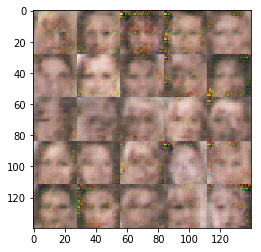

Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.9347
Epoch 1/1... Discriminator Loss: 1.3617... Generator Loss: 0.8058
Epoch 1/1... Discriminator Loss: 1.4049... Generator Loss: 0.9451
Epoch 1/1... Discriminator Loss: 1.3267... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.3154... Generator Loss: 0.8785
Epoch 1/1... Discriminator Loss: 1.2851... Generator Loss: 0.7664
Epoch 1/1... Discriminator Loss: 1.3294... Generator Loss: 0.7912
Epoch 1/1... Discriminator Loss: 1.2368... Generator Loss: 0.8815
Epoch 1/1... Discriminator Loss: 1.2226... Generator Loss: 0.8529
Epoch 1/1... Discriminator Loss: 1.2517... Generator Loss: 0.7152


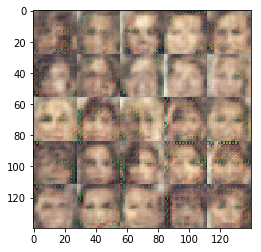

Epoch 1/1... Discriminator Loss: 1.3900... Generator Loss: 0.8486
Epoch 1/1... Discriminator Loss: 1.4575... Generator Loss: 0.6227
Epoch 1/1... Discriminator Loss: 1.3631... Generator Loss: 0.7458
Epoch 1/1... Discriminator Loss: 1.2651... Generator Loss: 0.8966
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.6037
Epoch 1/1... Discriminator Loss: 1.2374... Generator Loss: 0.9715
Epoch 1/1... Discriminator Loss: 1.3204... Generator Loss: 0.5897
Epoch 1/1... Discriminator Loss: 1.3702... Generator Loss: 1.0953
Epoch 1/1... Discriminator Loss: 1.5561... Generator Loss: 0.4222
Epoch 1/1... Discriminator Loss: 1.5764... Generator Loss: 1.3010


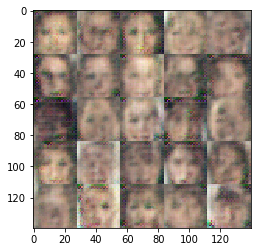

Epoch 1/1... Discriminator Loss: 1.3475... Generator Loss: 0.5481
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.7601
Epoch 1/1... Discriminator Loss: 1.4161... Generator Loss: 0.7055
Epoch 1/1... Discriminator Loss: 1.3907... Generator Loss: 0.6227
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.8520
Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.7252
Epoch 1/1... Discriminator Loss: 1.2545... Generator Loss: 0.7947
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.7465
Epoch 1/1... Discriminator Loss: 1.3003... Generator Loss: 0.8054
Epoch 1/1... Discriminator Loss: 1.3380... Generator Loss: 0.7879


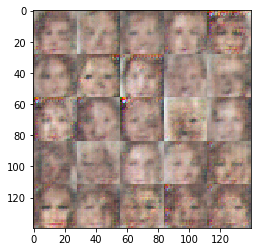

Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.7733
Epoch 1/1... Discriminator Loss: 1.4379... Generator Loss: 0.8268
Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 0.6169
Epoch 1/1... Discriminator Loss: 1.4138... Generator Loss: 0.7663
Epoch 1/1... Discriminator Loss: 1.3087... Generator Loss: 0.7391
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.8864
Epoch 1/1... Discriminator Loss: 1.3396... Generator Loss: 0.6252
Epoch 1/1... Discriminator Loss: 1.3695... Generator Loss: 0.8735
Epoch 1/1... Discriminator Loss: 1.5097... Generator Loss: 0.5816
Epoch 1/1... Discriminator Loss: 1.5409... Generator Loss: 0.8239


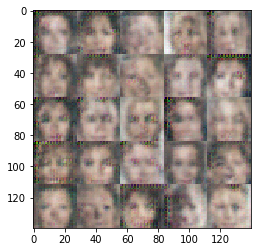

Epoch 1/1... Discriminator Loss: 1.5090... Generator Loss: 0.6590
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.7912
Epoch 1/1... Discriminator Loss: 1.2732... Generator Loss: 0.7733
Epoch 1/1... Discriminator Loss: 1.2964... Generator Loss: 0.8235
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.8209
Epoch 1/1... Discriminator Loss: 1.2608... Generator Loss: 0.6357
Epoch 1/1... Discriminator Loss: 1.3585... Generator Loss: 1.1629
Epoch 1/1... Discriminator Loss: 1.3066... Generator Loss: 0.6200
Epoch 1/1... Discriminator Loss: 1.2540... Generator Loss: 0.8332


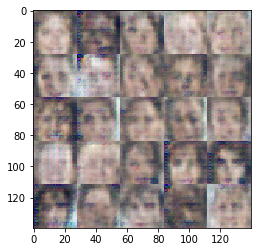

Epoch 1/1... Discriminator Loss: 1.2577... Generator Loss: 0.7811
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.3338... Generator Loss: 0.7827
Epoch 1/1... Discriminator Loss: 1.3839... Generator Loss: 0.7317
Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.4033... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.3326... Generator Loss: 0.7180
Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.6827
Epoch 1/1... Discriminator Loss: 1.2421... Generator Loss: 0.7874
Epoch 1/1... Discriminator Loss: 1.2791... Generator Loss: 0.8999


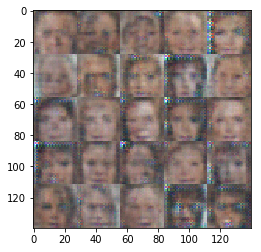

Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.5763
Epoch 1/1... Discriminator Loss: 1.3981... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.8087
Epoch 1/1... Discriminator Loss: 1.4961... Generator Loss: 0.6548
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.8028
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.7557
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.9204
Epoch 1/1... Discriminator Loss: 1.4016... Generator Loss: 0.4868
Epoch 1/1... Discriminator Loss: 1.3714... Generator Loss: 1.1088
Epoch 1/1... Discriminator Loss: 1.3828... Generator Loss: 0.5769


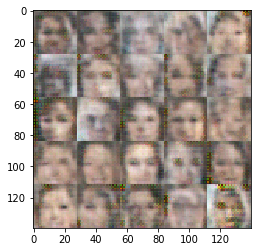

Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.8327
Epoch 1/1... Discriminator Loss: 1.3312... Generator Loss: 0.9120
Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.6207
Epoch 1/1... Discriminator Loss: 1.3617... Generator Loss: 1.1583
Epoch 1/1... Discriminator Loss: 1.4790... Generator Loss: 0.5087
Epoch 1/1... Discriminator Loss: 1.4118... Generator Loss: 1.1651
Epoch 1/1... Discriminator Loss: 1.3063... Generator Loss: 0.6149
Epoch 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.9131
Epoch 1/1... Discriminator Loss: 1.3512... Generator Loss: 0.6038
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.8659


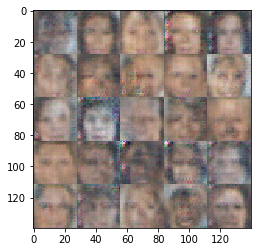

Epoch 1/1... Discriminator Loss: 1.4544... Generator Loss: 0.5533
Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 0.8334
Epoch 1/1... Discriminator Loss: 1.4222... Generator Loss: 0.6468
Epoch 1/1... Discriminator Loss: 1.2543... Generator Loss: 1.0040
Epoch 1/1... Discriminator Loss: 1.5187... Generator Loss: 0.4398
Epoch 1/1... Discriminator Loss: 1.5945... Generator Loss: 1.7019
Epoch 1/1... Discriminator Loss: 1.5299... Generator Loss: 0.4281
Epoch 1/1... Discriminator Loss: 1.2998... Generator Loss: 0.8355
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.8995
Epoch 1/1... Discriminator Loss: 1.1918... Generator Loss: 0.6472


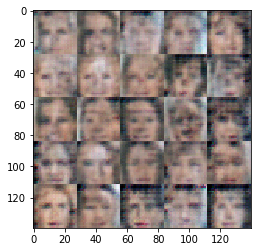

Epoch 1/1... Discriminator Loss: 1.2307... Generator Loss: 0.8834
Epoch 1/1... Discriminator Loss: 1.1307... Generator Loss: 0.8172
Epoch 1/1... Discriminator Loss: 1.1387... Generator Loss: 0.7441
Epoch 1/1... Discriminator Loss: 1.1227... Generator Loss: 0.8993
Epoch 1/1... Discriminator Loss: 1.2150... Generator Loss: 0.5995
Epoch 1/1... Discriminator Loss: 1.3625... Generator Loss: 1.0311
Epoch 1/1... Discriminator Loss: 1.4530... Generator Loss: 0.3925
Epoch 1/1... Discriminator Loss: 1.6623... Generator Loss: 2.3673
Epoch 1/1... Discriminator Loss: 1.6280... Generator Loss: 0.2835
Epoch 1/1... Discriminator Loss: 1.0919... Generator Loss: 1.9356


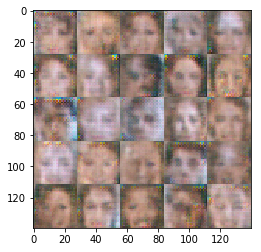

Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.4462
Epoch 1/1... Discriminator Loss: 1.1061... Generator Loss: 1.6976
Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 0.4101
Epoch 1/1... Discriminator Loss: 1.4419... Generator Loss: 1.9043
Epoch 1/1... Discriminator Loss: 1.4834... Generator Loss: 0.3403
Epoch 1/1... Discriminator Loss: 1.1014... Generator Loss: 1.7004
Epoch 1/1... Discriminator Loss: 1.2251... Generator Loss: 0.4743
Epoch 1/1... Discriminator Loss: 1.4035... Generator Loss: 1.8848
Epoch 1/1... Discriminator Loss: 2.6146... Generator Loss: 0.1030
Epoch 1/1... Discriminator Loss: 3.3833... Generator Loss: 3.5676


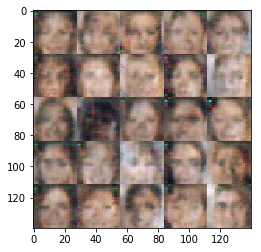

Epoch 1/1... Discriminator Loss: 1.8201... Generator Loss: 1.6015
Epoch 1/1... Discriminator Loss: 1.6561... Generator Loss: 0.3632
Epoch 1/1... Discriminator Loss: 1.5687... Generator Loss: 0.4198
Epoch 1/1... Discriminator Loss: 1.2160... Generator Loss: 0.8649
Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 1.0559
Epoch 1/1... Discriminator Loss: 1.1555... Generator Loss: 0.7776
Epoch 1/1... Discriminator Loss: 1.2722... Generator Loss: 0.7175
Epoch 1/1... Discriminator Loss: 1.2578... Generator Loss: 0.7196
Epoch 1/1... Discriminator Loss: 1.2133... Generator Loss: 0.7837
Epoch 1/1... Discriminator Loss: 1.2295... Generator Loss: 0.8453


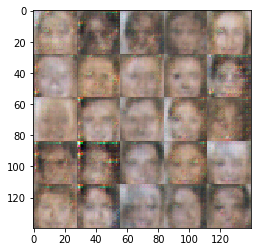

Epoch 1/1... Discriminator Loss: 1.2886... Generator Loss: 0.7593
Epoch 1/1... Discriminator Loss: 1.3903... Generator Loss: 0.7319
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.8060
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.4821... Generator Loss: 0.6630
Epoch 1/1... Discriminator Loss: 1.3668... Generator Loss: 0.8024
Epoch 1/1... Discriminator Loss: 1.4724... Generator Loss: 0.7091
Epoch 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.8878
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.7455
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.7242


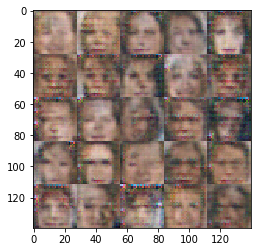

Epoch 1/1... Discriminator Loss: 1.4123... Generator Loss: 0.7084
Epoch 1/1... Discriminator Loss: 1.4968... Generator Loss: 0.8162
Epoch 1/1... Discriminator Loss: 1.5153... Generator Loss: 0.6376
Epoch 1/1... Discriminator Loss: 1.5376... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.4591... Generator Loss: 0.8241
Epoch 1/1... Discriminator Loss: 1.4514... Generator Loss: 0.7642
Epoch 1/1... Discriminator Loss: 1.4329... Generator Loss: 0.6705
Epoch 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.7075
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.8162
Epoch 1/1... Discriminator Loss: 1.2360... Generator Loss: 0.7812


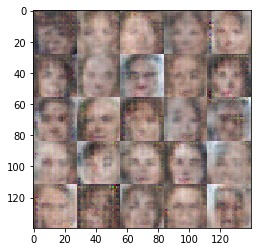

Epoch 1/1... Discriminator Loss: 1.2617... Generator Loss: 0.8388
Epoch 1/1... Discriminator Loss: 1.2302... Generator Loss: 0.8084
Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.7845
Epoch 1/1... Discriminator Loss: 1.2226... Generator Loss: 0.7795
Epoch 1/1... Discriminator Loss: 1.2579... Generator Loss: 0.8008
Epoch 1/1... Discriminator Loss: 1.2336... Generator Loss: 0.7358
Epoch 1/1... Discriminator Loss: 1.2182... Generator Loss: 0.7927
Epoch 1/1... Discriminator Loss: 1.3063... Generator Loss: 0.7378
Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 1.1501


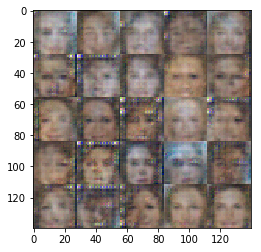

Epoch 1/1... Discriminator Loss: 1.4610... Generator Loss: 0.4382
Epoch 1/1... Discriminator Loss: 1.2806... Generator Loss: 0.9419
Epoch 1/1... Discriminator Loss: 1.0820... Generator Loss: 1.2083
Epoch 1/1... Discriminator Loss: 1.5595... Generator Loss: 0.3664
Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 1.2296
Epoch 1/1... Discriminator Loss: 1.1393... Generator Loss: 0.7280
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.6884
Epoch 1/1... Discriminator Loss: 1.1386... Generator Loss: 0.9647
Epoch 1/1... Discriminator Loss: 1.2190... Generator Loss: 0.6981
Epoch 1/1... Discriminator Loss: 1.1826... Generator Loss: 0.9264


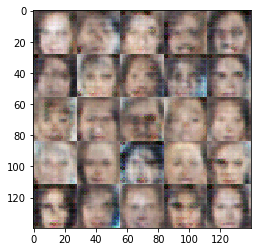

Epoch 1/1... Discriminator Loss: 1.1494... Generator Loss: 0.8064
Epoch 1/1... Discriminator Loss: 1.2689... Generator Loss: 0.7804
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.4873
Epoch 1/1... Discriminator Loss: 1.7010... Generator Loss: 1.7796
Epoch 1/1... Discriminator Loss: 1.7484... Generator Loss: 0.2483
Epoch 1/1... Discriminator Loss: 1.2941... Generator Loss: 1.5432
Epoch 1/1... Discriminator Loss: 1.1787... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.2120... Generator Loss: 0.5905
Epoch 1/1... Discriminator Loss: 1.0464... Generator Loss: 2.2044
Epoch 1/1... Discriminator Loss: 0.7307... Generator Loss: 0.8067


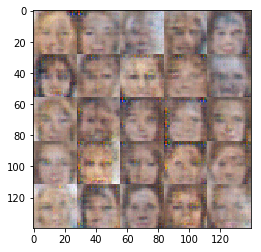

Epoch 1/1... Discriminator Loss: 1.4459... Generator Loss: 0.3920
Epoch 1/1... Discriminator Loss: 1.8839... Generator Loss: 2.3177
Epoch 1/1... Discriminator Loss: 0.9065... Generator Loss: 1.2673
Epoch 1/1... Discriminator Loss: 1.3908... Generator Loss: 0.3580
Epoch 1/1... Discriminator Loss: 1.5655... Generator Loss: 0.9612
Epoch 1/1... Discriminator Loss: 1.6502... Generator Loss: 0.4099
Epoch 1/1... Discriminator Loss: 1.2249... Generator Loss: 1.0787
Epoch 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.9223
Epoch 1/1... Discriminator Loss: 1.2860... Generator Loss: 0.5518
Epoch 1/1... Discriminator Loss: 1.5476... Generator Loss: 1.7707


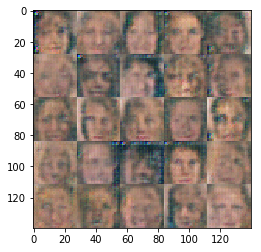

Epoch 1/1... Discriminator Loss: 1.3911... Generator Loss: 0.4574
Epoch 1/1... Discriminator Loss: 1.0764... Generator Loss: 1.3773
Epoch 1/1... Discriminator Loss: 0.6807... Generator Loss: 1.1024
Epoch 1/1... Discriminator Loss: 1.2761... Generator Loss: 0.4691
Epoch 1/1... Discriminator Loss: 1.8785... Generator Loss: 1.7650
Epoch 1/1... Discriminator Loss: 1.5605... Generator Loss: 0.3018
Epoch 1/1... Discriminator Loss: 1.0876... Generator Loss: 1.0130
Epoch 1/1... Discriminator Loss: 1.0496... Generator Loss: 1.0521
Epoch 1/1... Discriminator Loss: 1.5392... Generator Loss: 0.4216
Epoch 1/1... Discriminator Loss: 1.2765... Generator Loss: 0.9327


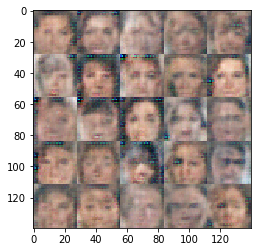

Epoch 1/1... Discriminator Loss: 1.4994... Generator Loss: 0.5732
Epoch 1/1... Discriminator Loss: 1.5089... Generator Loss: 1.1983
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.5267
Epoch 1/1... Discriminator Loss: 1.2251... Generator Loss: 1.0107
Epoch 1/1... Discriminator Loss: 1.0883... Generator Loss: 0.8770
Epoch 1/1... Discriminator Loss: 0.9175... Generator Loss: 0.8637
Epoch 1/1... Discriminator Loss: 1.0184... Generator Loss: 1.0057
Epoch 1/1... Discriminator Loss: 0.9095... Generator Loss: 1.0987
Epoch 1/1... Discriminator Loss: 1.4167... Generator Loss: 0.3915
Epoch 1/1... Discriminator Loss: 1.9538... Generator Loss: 2.3536


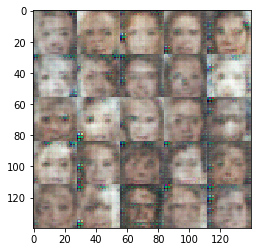

Epoch 1/1... Discriminator Loss: 1.0246... Generator Loss: 0.6795
Epoch 1/1... Discriminator Loss: 1.0685... Generator Loss: 1.2773
Epoch 1/1... Discriminator Loss: 1.2500... Generator Loss: 0.5639
Epoch 1/1... Discriminator Loss: 1.3818... Generator Loss: 0.5246
Epoch 1/1... Discriminator Loss: 1.5141... Generator Loss: 0.5855
Epoch 1/1... Discriminator Loss: 2.6093... Generator Loss: 0.2745
Epoch 1/1... Discriminator Loss: 2.1254... Generator Loss: 0.6634
Epoch 1/1... Discriminator Loss: 1.7298... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.5351... Generator Loss: 0.7281
Epoch 1/1... Discriminator Loss: 1.4859... Generator Loss: 0.7254


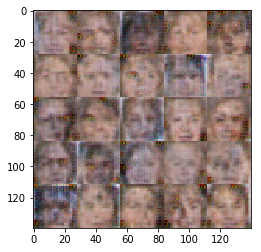

Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 0.7130
Epoch 1/1... Discriminator Loss: 1.4112... Generator Loss: 0.8718
Epoch 1/1... Discriminator Loss: 1.3143... Generator Loss: 0.8921
Epoch 1/1... Discriminator Loss: 1.3974... Generator Loss: 0.5733
Epoch 1/1... Discriminator Loss: 1.4306... Generator Loss: 1.3806
Epoch 1/1... Discriminator Loss: 1.5523... Generator Loss: 0.3911
Epoch 1/1... Discriminator Loss: 1.4291... Generator Loss: 1.4319
Epoch 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.6090
Epoch 1/1... Discriminator Loss: 1.3209... Generator Loss: 0.8048
Epoch 1/1... Discriminator Loss: 1.2846... Generator Loss: 0.8192


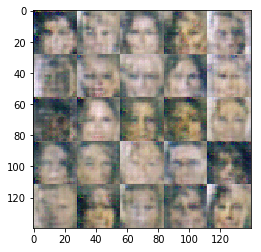

Epoch 1/1... Discriminator Loss: 1.5364... Generator Loss: 0.5952
Epoch 1/1... Discriminator Loss: 1.4862... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.4912... Generator Loss: 0.6736
Epoch 1/1... Discriminator Loss: 1.3104... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.3378... Generator Loss: 0.7153
Epoch 1/1... Discriminator Loss: 1.3959... Generator Loss: 0.7039
Epoch 1/1... Discriminator Loss: 1.3304... Generator Loss: 0.8364
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.6664
Epoch 1/1... Discriminator Loss: 1.4723... Generator Loss: 0.6843
Epoch 1/1... Discriminator Loss: 1.4576... Generator Loss: 0.7140


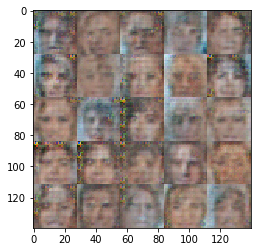

Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 0.7305
Epoch 1/1... Discriminator Loss: 1.4855... Generator Loss: 0.6446
Epoch 1/1... Discriminator Loss: 1.4744... Generator Loss: 1.1289
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6851
Epoch 1/1... Discriminator Loss: 1.2809... Generator Loss: 0.6788
Epoch 1/1... Discriminator Loss: 1.2344... Generator Loss: 1.1010
Epoch 1/1... Discriminator Loss: 1.2667... Generator Loss: 0.5968
Epoch 1/1... Discriminator Loss: 1.2166... Generator Loss: 0.9847
Epoch 1/1... Discriminator Loss: 1.2507... Generator Loss: 0.6731
Epoch 1/1... Discriminator Loss: 1.3193... Generator Loss: 0.7560


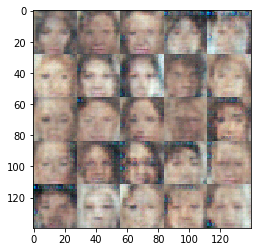

Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 0.9936
Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.7497
Epoch 1/1... Discriminator Loss: 1.3640... Generator Loss: 0.6134
Epoch 1/1... Discriminator Loss: 1.5397... Generator Loss: 0.8957
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.5588
Epoch 1/1... Discriminator Loss: 1.2178... Generator Loss: 1.0692
Epoch 1/1... Discriminator Loss: 1.2921... Generator Loss: 0.5857
Epoch 1/1... Discriminator Loss: 0.9798... Generator Loss: 1.1549
Epoch 1/1... Discriminator Loss: 1.0021... Generator Loss: 0.6525
Epoch 1/1... Discriminator Loss: 1.5107... Generator Loss: 2.1021


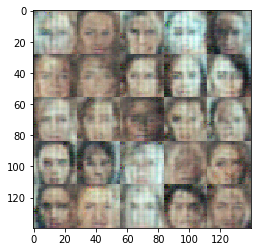

Epoch 1/1... Discriminator Loss: 2.3322... Generator Loss: 0.1248
Epoch 1/1... Discriminator Loss: 1.7440... Generator Loss: 1.8850
Epoch 1/1... Discriminator Loss: 1.2939... Generator Loss: 1.1123
Epoch 1/1... Discriminator Loss: 1.4010... Generator Loss: 0.5079
Epoch 1/1... Discriminator Loss: 1.2617... Generator Loss: 0.6557
Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 0.9108
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.8739
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.5780
Epoch 1/1... Discriminator Loss: 1.5386... Generator Loss: 0.6525
Epoch 1/1... Discriminator Loss: 1.4199... Generator Loss: 0.7747


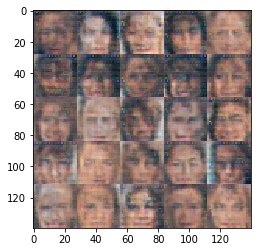

Epoch 1/1... Discriminator Loss: 1.3692... Generator Loss: 0.7334
Epoch 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.7906
Epoch 1/1... Discriminator Loss: 1.3636... Generator Loss: 0.8009
Epoch 1/1... Discriminator Loss: 1.3908... Generator Loss: 0.7735
Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.7031
Epoch 1/1... Discriminator Loss: 1.3120... Generator Loss: 0.7835
Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.8003
Epoch 1/1... Discriminator Loss: 1.2575... Generator Loss: 0.7204
Epoch 1/1... Discriminator Loss: 1.3073... Generator Loss: 0.8712
Epoch 1/1... Discriminator Loss: 1.3324... Generator Loss: 0.8187


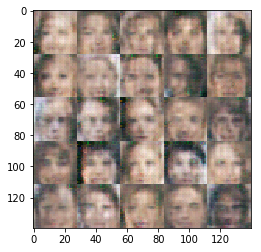

Epoch 1/1... Discriminator Loss: 1.2760... Generator Loss: 0.8968
Epoch 1/1... Discriminator Loss: 1.2836... Generator Loss: 0.7119
Epoch 1/1... Discriminator Loss: 1.2670... Generator Loss: 0.9095
Epoch 1/1... Discriminator Loss: 1.2855... Generator Loss: 0.7029
Epoch 1/1... Discriminator Loss: 1.3072... Generator Loss: 0.7771
Epoch 1/1... Discriminator Loss: 1.4030... Generator Loss: 0.7282
Epoch 1/1... Discriminator Loss: 1.2860... Generator Loss: 0.9625
Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.5122
Epoch 1/1... Discriminator Loss: 1.5576... Generator Loss: 1.1522
Epoch 1/1... Discriminator Loss: 1.4419... Generator Loss: 0.5857


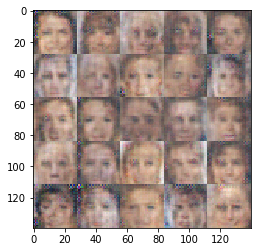

Epoch 1/1... Discriminator Loss: 1.2786... Generator Loss: 0.6856
Epoch 1/1... Discriminator Loss: 1.2668... Generator Loss: 1.2185
Epoch 1/1... Discriminator Loss: 1.6302... Generator Loss: 0.3841
Epoch 1/1... Discriminator Loss: 1.3590... Generator Loss: 1.0303
Epoch 1/1... Discriminator Loss: 1.1660... Generator Loss: 0.9054
Epoch 1/1... Discriminator Loss: 1.3804... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.2846... Generator Loss: 1.1117
Epoch 1/1... Discriminator Loss: 1.2006... Generator Loss: 0.5980
Epoch 1/1... Discriminator Loss: 1.1568... Generator Loss: 1.0694
Epoch 1/1... Discriminator Loss: 1.2374... Generator Loss: 0.6893


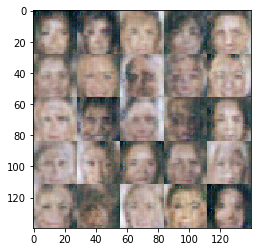

Epoch 1/1... Discriminator Loss: 1.2888... Generator Loss: 0.8857
Epoch 1/1... Discriminator Loss: 1.1060... Generator Loss: 0.7052
Epoch 1/1... Discriminator Loss: 1.2723... Generator Loss: 0.9102
Epoch 1/1... Discriminator Loss: 0.9760... Generator Loss: 1.3075
Epoch 1/1... Discriminator Loss: 1.3655... Generator Loss: 0.4699
Epoch 1/1... Discriminator Loss: 1.9913... Generator Loss: 2.1497
Epoch 1/1... Discriminator Loss: 2.1342... Generator Loss: 0.1556
Epoch 1/1... Discriminator Loss: 1.0145... Generator Loss: 1.4480
Epoch 1/1... Discriminator Loss: 1.0178... Generator Loss: 1.1022
Epoch 1/1... Discriminator Loss: 1.1589... Generator Loss: 0.6141


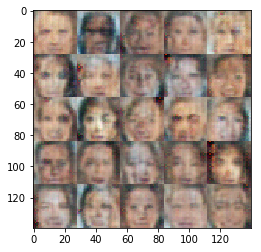

Epoch 1/1... Discriminator Loss: 1.0321... Generator Loss: 0.8686
Epoch 1/1... Discriminator Loss: 1.1710... Generator Loss: 0.8346
Epoch 1/1... Discriminator Loss: 1.2407... Generator Loss: 1.3696
Epoch 1/1... Discriminator Loss: 1.3111... Generator Loss: 0.9316
Epoch 1/1... Discriminator Loss: 1.4430... Generator Loss: 0.4555
Epoch 1/1... Discriminator Loss: 3.1118... Generator Loss: 2.8518
Epoch 1/1... Discriminator Loss: 1.7248... Generator Loss: 0.3205
Epoch 1/1... Discriminator Loss: 1.1563... Generator Loss: 1.0204
Epoch 1/1... Discriminator Loss: 1.1911... Generator Loss: 0.9806
Epoch 1/1... Discriminator Loss: 1.3882... Generator Loss: 0.4280


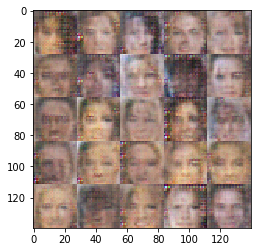

Epoch 1/1... Discriminator Loss: 1.4174... Generator Loss: 1.1774
Epoch 1/1... Discriminator Loss: 0.8334... Generator Loss: 0.9541
Epoch 1/1... Discriminator Loss: 0.7572... Generator Loss: 1.1683
Epoch 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.4868
Epoch 1/1... Discriminator Loss: 1.3602... Generator Loss: 1.3820
Epoch 1/1... Discriminator Loss: 0.9245... Generator Loss: 0.9364
Epoch 1/1... Discriminator Loss: 1.0990... Generator Loss: 0.5881
Epoch 1/1... Discriminator Loss: 1.1484... Generator Loss: 1.2674
Epoch 1/1... Discriminator Loss: 1.0654... Generator Loss: 0.6601
Epoch 1/1... Discriminator Loss: 1.2152... Generator Loss: 1.1697


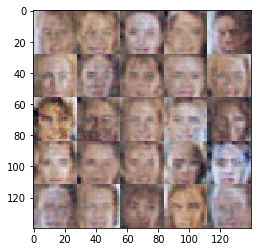

Epoch 1/1... Discriminator Loss: 1.4275... Generator Loss: 0.3896
Epoch 1/1... Discriminator Loss: 1.2194... Generator Loss: 1.6093
Epoch 1/1... Discriminator Loss: 0.9926... Generator Loss: 0.7691
Epoch 1/1... Discriminator Loss: 1.4840... Generator Loss: 0.4022
Epoch 1/1... Discriminator Loss: 2.5267... Generator Loss: 2.3869
Epoch 1/1... Discriminator Loss: 1.5449... Generator Loss: 0.3678
Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.6952
Epoch 1/1... Discriminator Loss: 1.3307... Generator Loss: 1.0032
Epoch 1/1... Discriminator Loss: 1.2932... Generator Loss: 0.7935
Epoch 1/1... Discriminator Loss: 1.2700... Generator Loss: 0.6093


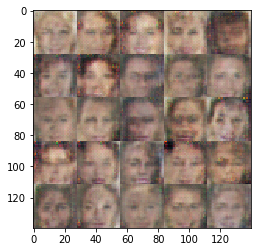

Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 1.0054
Epoch 1/1... Discriminator Loss: 1.3476... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 0.5929
Epoch 1/1... Discriminator Loss: 1.2598... Generator Loss: 0.8778
Epoch 1/1... Discriminator Loss: 1.3143... Generator Loss: 0.6416
Epoch 1/1... Discriminator Loss: 1.2299... Generator Loss: 0.8935
Epoch 1/1... Discriminator Loss: 1.2738... Generator Loss: 0.6723
Epoch 1/1... Discriminator Loss: 1.1746... Generator Loss: 1.4532
Epoch 1/1... Discriminator Loss: 1.5450... Generator Loss: 0.3834
Epoch 1/1... Discriminator Loss: 1.5547... Generator Loss: 1.5631


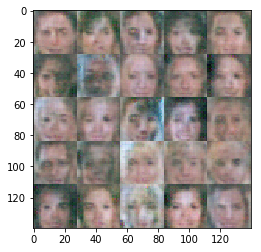

Epoch 1/1... Discriminator Loss: 1.0324... Generator Loss: 0.8015
Epoch 1/1... Discriminator Loss: 1.2011... Generator Loss: 0.4711
Epoch 1/1... Discriminator Loss: 1.2269... Generator Loss: 1.4724
Epoch 1/1... Discriminator Loss: 1.4944... Generator Loss: 0.3377
Epoch 1/1... Discriminator Loss: 1.0825... Generator Loss: 1.8194
Epoch 1/1... Discriminator Loss: 1.0043... Generator Loss: 0.8475
Epoch 1/1... Discriminator Loss: 1.4659... Generator Loss: 1.6583
Epoch 1/1... Discriminator Loss: 1.9788... Generator Loss: 0.1918
Epoch 1/1... Discriminator Loss: 2.7610... Generator Loss: 2.8672
Epoch 1/1... Discriminator Loss: 1.4388... Generator Loss: 1.0146


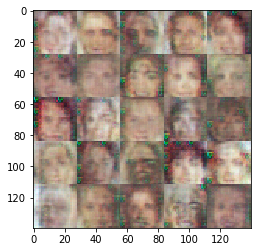

Epoch 1/1... Discriminator Loss: 1.7389... Generator Loss: 0.3028
Epoch 1/1... Discriminator Loss: 1.3391... Generator Loss: 0.7583
Epoch 1/1... Discriminator Loss: 1.4606... Generator Loss: 1.0799
Epoch 1/1... Discriminator Loss: 1.2603... Generator Loss: 0.8217
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 0.6246
Epoch 1/1... Discriminator Loss: 1.3608... Generator Loss: 0.6651
Epoch 1/1... Discriminator Loss: 1.3331... Generator Loss: 0.8654
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.7275
Epoch 1/1... Discriminator Loss: 1.3053... Generator Loss: 0.7095
Epoch 1/1... Discriminator Loss: 1.3153... Generator Loss: 0.8145


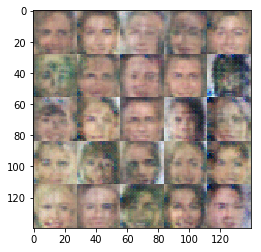

Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.6893
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.6267
Epoch 1/1... Discriminator Loss: 1.3209... Generator Loss: 0.8236
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.7657
Epoch 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.7258
Epoch 1/1... Discriminator Loss: 1.3636... Generator Loss: 0.7702
Epoch 1/1... Discriminator Loss: 1.3173... Generator Loss: 0.7660
Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 0.6896
Epoch 1/1... Discriminator Loss: 1.3116... Generator Loss: 0.8176
Epoch 1/1... Discriminator Loss: 1.2932... Generator Loss: 0.6820


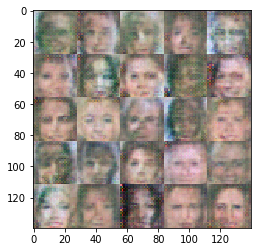

Epoch 1/1... Discriminator Loss: 1.4454... Generator Loss: 0.7961
Epoch 1/1... Discriminator Loss: 1.4077... Generator Loss: 0.6685
Epoch 1/1... Discriminator Loss: 1.3234... Generator Loss: 0.7093
Epoch 1/1... Discriminator Loss: 1.3568... Generator Loss: 0.7750
Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.3626... Generator Loss: 0.6369
Epoch 1/1... Discriminator Loss: 1.2965... Generator Loss: 0.7699
Epoch 1/1... Discriminator Loss: 1.2929... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 1.2564... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.2910... Generator Loss: 0.8611


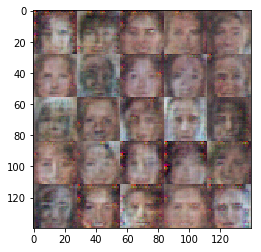

Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.6395
Epoch 1/1... Discriminator Loss: 1.3445... Generator Loss: 0.8836
Epoch 1/1... Discriminator Loss: 1.3957... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.7305
Epoch 1/1... Discriminator Loss: 1.3570... Generator Loss: 0.7585
Epoch 1/1... Discriminator Loss: 1.4156... Generator Loss: 0.7095
Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.7128
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.7182
Epoch 1/1... Discriminator Loss: 1.3260... Generator Loss: 0.8199
Epoch 1/1... Discriminator Loss: 1.3032... Generator Loss: 0.7141


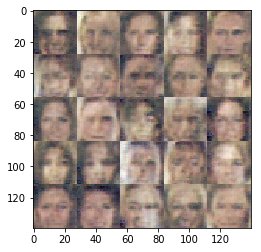

Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 0.8574
Epoch 1/1... Discriminator Loss: 1.3109... Generator Loss: 0.6217
Epoch 1/1... Discriminator Loss: 1.4107... Generator Loss: 1.2434
Epoch 1/1... Discriminator Loss: 1.3082... Generator Loss: 0.6009
Epoch 1/1... Discriminator Loss: 1.2530... Generator Loss: 0.8041
Epoch 1/1... Discriminator Loss: 1.2690... Generator Loss: 0.9061
Epoch 1/1... Discriminator Loss: 1.2210... Generator Loss: 0.6785
Epoch 1/1... Discriminator Loss: 1.3010... Generator Loss: 0.8064
Epoch 1/1... Discriminator Loss: 1.3881... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.3916... Generator Loss: 0.8139


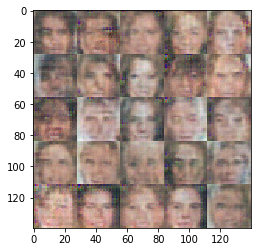

Epoch 1/1... Discriminator Loss: 1.4161... Generator Loss: 0.7013
Epoch 1/1... Discriminator Loss: 1.4397... Generator Loss: 0.6709
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.7064
Epoch 1/1... Discriminator Loss: 1.3350... Generator Loss: 0.6982
Epoch 1/1... Discriminator Loss: 1.3639... Generator Loss: 0.7539
Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.8052
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.3530... Generator Loss: 0.8457
Epoch 1/1... Discriminator Loss: 1.3639... Generator Loss: 0.5892
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.9976


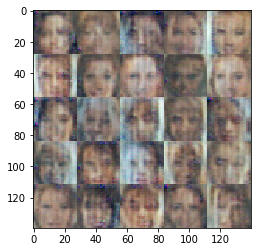

Epoch 1/1... Discriminator Loss: 1.3642... Generator Loss: 0.6099
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.9974
Epoch 1/1... Discriminator Loss: 1.3337... Generator Loss: 0.5627
Epoch 1/1... Discriminator Loss: 1.2472... Generator Loss: 0.9251
Epoch 1/1... Discriminator Loss: 1.2014... Generator Loss: 0.8364
Epoch 1/1... Discriminator Loss: 1.3751... Generator Loss: 0.5565
Epoch 1/1... Discriminator Loss: 1.2668... Generator Loss: 0.7517
Epoch 1/1... Discriminator Loss: 1.3367... Generator Loss: 0.9113
Epoch 1/1... Discriminator Loss: 1.3441... Generator Loss: 0.5347
Epoch 1/1... Discriminator Loss: 1.3130... Generator Loss: 0.8677


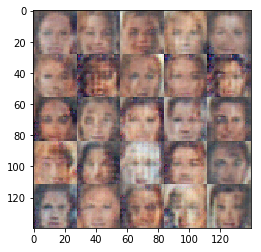

Epoch 1/1... Discriminator Loss: 1.3349... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 1.3233... Generator Loss: 0.6858
Epoch 1/1... Discriminator Loss: 1.3378... Generator Loss: 0.8196
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 0.6311
Epoch 1/1... Discriminator Loss: 1.3545... Generator Loss: 1.0411
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.6277
Epoch 1/1... Discriminator Loss: 1.3829... Generator Loss: 0.9863
Epoch 1/1... Discriminator Loss: 1.4887... Generator Loss: 0.4004
Epoch 1/1... Discriminator Loss: 1.3287... Generator Loss: 1.1761
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.5724


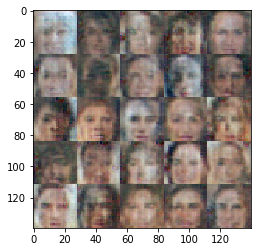

Epoch 1/1... Discriminator Loss: 1.2951... Generator Loss: 0.8353
Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.8173
Epoch 1/1... Discriminator Loss: 1.2689... Generator Loss: 0.7238
Epoch 1/1... Discriminator Loss: 1.1741... Generator Loss: 0.7833
Epoch 1/1... Discriminator Loss: 1.2245... Generator Loss: 0.8199
Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 0.7701
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.6804
Epoch 1/1... Discriminator Loss: 1.4177... Generator Loss: 0.6298
Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.7271
Epoch 1/1... Discriminator Loss: 1.2769... Generator Loss: 0.7706


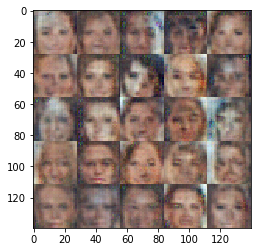

Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.5250
Epoch 1/1... Discriminator Loss: 1.3640... Generator Loss: 1.0682
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.6499
Epoch 1/1... Discriminator Loss: 1.3509... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.3380... Generator Loss: 0.9048
Epoch 1/1... Discriminator Loss: 1.3401... Generator Loss: 0.6870
Epoch 1/1... Discriminator Loss: 1.3016... Generator Loss: 0.9714
Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 0.5415
Epoch 1/1... Discriminator Loss: 1.4806... Generator Loss: 1.4916
Epoch 1/1... Discriminator Loss: 1.4410... Generator Loss: 0.4467


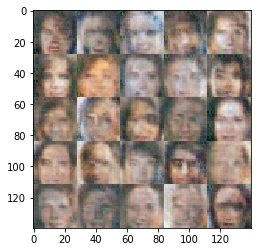

Epoch 1/1... Discriminator Loss: 1.2073... Generator Loss: 0.8585
Epoch 1/1... Discriminator Loss: 1.1563... Generator Loss: 1.0076
Epoch 1/1... Discriminator Loss: 1.1624... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.1963... Generator Loss: 0.7536
Epoch 1/1... Discriminator Loss: 1.2275... Generator Loss: 0.7436
Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 0.7047
Epoch 1/1... Discriminator Loss: 1.2869... Generator Loss: 0.7948
Epoch 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 1.3477... Generator Loss: 0.7689
Epoch 1/1... Discriminator Loss: 1.2426... Generator Loss: 0.5855


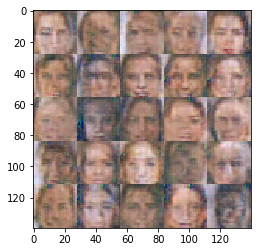

Epoch 1/1... Discriminator Loss: 1.4947... Generator Loss: 1.3866
Epoch 1/1... Discriminator Loss: 1.5060... Generator Loss: 0.4571
Epoch 1/1... Discriminator Loss: 1.3079... Generator Loss: 0.8036
Epoch 1/1... Discriminator Loss: 1.3415... Generator Loss: 0.8236
Epoch 1/1... Discriminator Loss: 1.2139... Generator Loss: 0.7097
Epoch 1/1... Discriminator Loss: 1.2253... Generator Loss: 0.9689
Epoch 1/1... Discriminator Loss: 1.2143... Generator Loss: 0.8172
Epoch 1/1... Discriminator Loss: 1.1354... Generator Loss: 0.9907
Epoch 1/1... Discriminator Loss: 1.5359... Generator Loss: 0.3991
Epoch 1/1... Discriminator Loss: 1.8738... Generator Loss: 1.5196


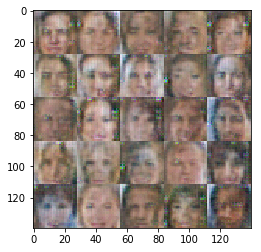

Epoch 1/1... Discriminator Loss: 1.8677... Generator Loss: 0.2176
Epoch 1/1... Discriminator Loss: 1.1339... Generator Loss: 1.1807
Epoch 1/1... Discriminator Loss: 1.0957... Generator Loss: 0.9473
Epoch 1/1... Discriminator Loss: 0.9165... Generator Loss: 0.8416
Epoch 1/1... Discriminator Loss: 0.7169... Generator Loss: 1.4805
Epoch 1/1... Discriminator Loss: 1.2611... Generator Loss: 0.5467
Epoch 1/1... Discriminator Loss: 2.2725... Generator Loss: 2.5215
Epoch 1/1... Discriminator Loss: 1.7433... Generator Loss: 0.2470
Epoch 1/1... Discriminator Loss: 1.2267... Generator Loss: 1.3633
Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.9188


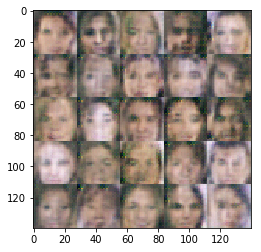

Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 0.5671
Epoch 1/1... Discriminator Loss: 1.1618... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.2581... Generator Loss: 0.8458
Epoch 1/1... Discriminator Loss: 1.1757... Generator Loss: 0.7858
Epoch 1/1... Discriminator Loss: 1.3223... Generator Loss: 0.7008
Epoch 1/1... Discriminator Loss: 1.3554... Generator Loss: 0.6816
Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 0.8199
Epoch 1/1... Discriminator Loss: 0.9911... Generator Loss: 1.0778
Epoch 1/1... Discriminator Loss: 1.0630... Generator Loss: 0.6589
Epoch 1/1... Discriminator Loss: 0.8340... Generator Loss: 1.2862


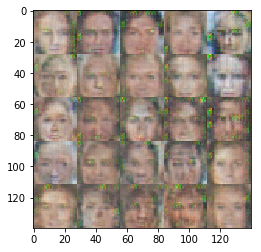

Epoch 1/1... Discriminator Loss: 1.1027... Generator Loss: 0.6682
Epoch 1/1... Discriminator Loss: 2.2545... Generator Loss: 2.4532
Epoch 1/1... Discriminator Loss: 1.6316... Generator Loss: 0.2711
Epoch 1/1... Discriminator Loss: 2.6790... Generator Loss: 2.7572
Epoch 1/1... Discriminator Loss: 1.2325... Generator Loss: 0.9048
Epoch 1/1... Discriminator Loss: 1.4073... Generator Loss: 0.4281
Epoch 1/1... Discriminator Loss: 1.2631... Generator Loss: 0.6425
Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 1.1422
Epoch 1/1... Discriminator Loss: 1.3163... Generator Loss: 0.7603
Epoch 1/1... Discriminator Loss: 1.5456... Generator Loss: 0.4975


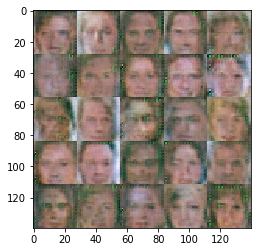

Epoch 1/1... Discriminator Loss: 1.4869... Generator Loss: 0.6676
Epoch 1/1... Discriminator Loss: 1.5197... Generator Loss: 0.6736
Epoch 1/1... Discriminator Loss: 1.5007... Generator Loss: 0.6313
Epoch 1/1... Discriminator Loss: 1.4122... Generator Loss: 0.7681
Epoch 1/1... Discriminator Loss: 1.4145... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 0.6869
Epoch 1/1... Discriminator Loss: 1.4362... Generator Loss: 0.7906
Epoch 1/1... Discriminator Loss: 1.4808... Generator Loss: 0.7090
Epoch 1/1... Discriminator Loss: 1.3636... Generator Loss: 0.7539
Epoch 1/1... Discriminator Loss: 1.4344... Generator Loss: 0.7599


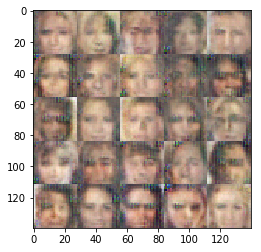

Epoch 1/1... Discriminator Loss: 1.4945... Generator Loss: 0.6454
Epoch 1/1... Discriminator Loss: 1.4692... Generator Loss: 0.5565
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.8099
Epoch 1/1... Discriminator Loss: 1.3724... Generator Loss: 0.8504
Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.6538
Epoch 1/1... Discriminator Loss: 1.3607... Generator Loss: 0.8425
Epoch 1/1... Discriminator Loss: 1.3946... Generator Loss: 0.7690
Epoch 1/1... Discriminator Loss: 1.4302... Generator Loss: 0.6468
Epoch 1/1... Discriminator Loss: 1.4174... Generator Loss: 0.7850
Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.7374


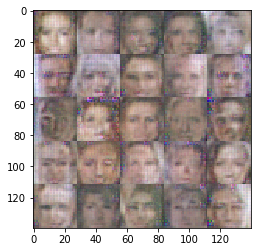

Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.6474
Epoch 1/1... Discriminator Loss: 1.2997... Generator Loss: 0.7689
Epoch 1/1... Discriminator Loss: 1.2603... Generator Loss: 0.7535
Epoch 1/1... Discriminator Loss: 1.2326... Generator Loss: 0.7100
Epoch 1/1... Discriminator Loss: 1.2651... Generator Loss: 0.8405
Epoch 1/1... Discriminator Loss: 1.2780... Generator Loss: 0.6846
Epoch 1/1... Discriminator Loss: 1.1703... Generator Loss: 0.7168
Epoch 1/1... Discriminator Loss: 1.2549... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.3006... Generator Loss: 0.7623
Epoch 1/1... Discriminator Loss: 1.2301... Generator Loss: 0.7553


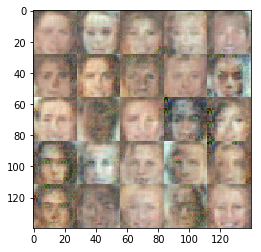

Epoch 1/1... Discriminator Loss: 1.2373... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 1.0504
Epoch 1/1... Discriminator Loss: 1.5622... Generator Loss: 0.3717
Epoch 1/1... Discriminator Loss: 1.6794... Generator Loss: 1.6739
Epoch 1/1... Discriminator Loss: 1.5139... Generator Loss: 0.4721
Epoch 1/1... Discriminator Loss: 1.3379... Generator Loss: 0.6258
Epoch 1/1... Discriminator Loss: 1.3241... Generator Loss: 0.9251
Epoch 1/1... Discriminator Loss: 1.3167... Generator Loss: 0.6598
Epoch 1/1... Discriminator Loss: 1.3461... Generator Loss: 0.7188
Epoch 1/1... Discriminator Loss: 1.3630... Generator Loss: 0.8671


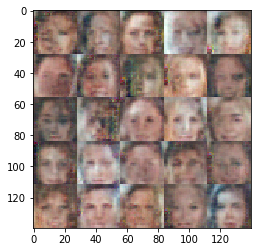

Epoch 1/1... Discriminator Loss: 1.3636... Generator Loss: 0.6779
Epoch 1/1... Discriminator Loss: 1.3440... Generator Loss: 0.7742
Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.6770
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.7344
Epoch 1/1... Discriminator Loss: 1.3461... Generator Loss: 0.5005
Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 1.0251
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 0.6246
Epoch 1/1... Discriminator Loss: 1.3198... Generator Loss: 0.8017
Epoch 1/1... Discriminator Loss: 1.4030... Generator Loss: 0.6982
Epoch 1/1... Discriminator Loss: 1.4713... Generator Loss: 0.7309


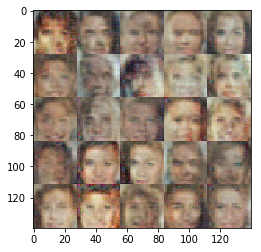

Epoch 1/1... Discriminator Loss: 1.4019... Generator Loss: 0.7567
Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.6780
Epoch 1/1... Discriminator Loss: 1.3256... Generator Loss: 0.8469
Epoch 1/1... Discriminator Loss: 1.3331... Generator Loss: 0.6629
Epoch 1/1... Discriminator Loss: 1.3448... Generator Loss: 0.7848
Epoch 1/1... Discriminator Loss: 1.2650... Generator Loss: 0.7522
Epoch 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.6702
Epoch 1/1... Discriminator Loss: 1.2663... Generator Loss: 0.7549
Epoch 1/1... Discriminator Loss: 1.3519... Generator Loss: 0.8691
Epoch 1/1... Discriminator Loss: 1.6491... Generator Loss: 0.3108


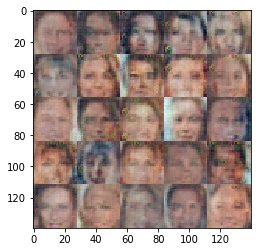

Epoch 1/1... Discriminator Loss: 1.9351... Generator Loss: 1.7056
Epoch 1/1... Discriminator Loss: 1.4265... Generator Loss: 0.4908
Epoch 1/1... Discriminator Loss: 1.3738... Generator Loss: 0.6003
Epoch 1/1... Discriminator Loss: 1.3528... Generator Loss: 0.8451
Epoch 1/1... Discriminator Loss: 1.3630... Generator Loss: 0.6525
Epoch 1/1... Discriminator Loss: 1.2238... Generator Loss: 0.7218
Epoch 1/1... Discriminator Loss: 1.3137... Generator Loss: 0.9344
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 0.7157
Epoch 1/1... Discriminator Loss: 1.3711... Generator Loss: 0.5879
Epoch 1/1... Discriminator Loss: 1.3498... Generator Loss: 0.7928


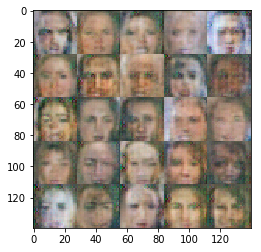

Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.6497
Epoch 1/1... Discriminator Loss: 1.3309... Generator Loss: 0.7972
Epoch 1/1... Discriminator Loss: 1.3590... Generator Loss: 0.6498
Epoch 1/1... Discriminator Loss: 1.3441... Generator Loss: 0.7978
Epoch 1/1... Discriminator Loss: 1.2355... Generator Loss: 0.8789
Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 0.6618
Epoch 1/1... Discriminator Loss: 1.2692... Generator Loss: 0.8074
Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 0.6615
Epoch 1/1... Discriminator Loss: 1.2691... Generator Loss: 0.8489
Epoch 1/1... Discriminator Loss: 1.1531... Generator Loss: 0.8306


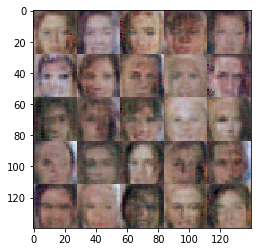

Epoch 1/1... Discriminator Loss: 1.2657... Generator Loss: 0.5426
Epoch 1/1... Discriminator Loss: 1.5271... Generator Loss: 1.2759
Epoch 1/1... Discriminator Loss: 1.4779... Generator Loss: 0.4113
Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 1.2473
Epoch 1/1... Discriminator Loss: 0.9979... Generator Loss: 0.8496
Epoch 1/1... Discriminator Loss: 1.3486... Generator Loss: 0.4654
Epoch 1/1... Discriminator Loss: 1.4375... Generator Loss: 1.2774
Epoch 1/1... Discriminator Loss: 1.4156... Generator Loss: 0.3938
Epoch 1/1... Discriminator Loss: 1.2335... Generator Loss: 1.0554
Epoch 1/1... Discriminator Loss: 1.0053... Generator Loss: 0.8109


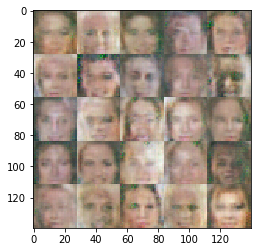

Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.5784
Epoch 1/1... Discriminator Loss: 1.5756... Generator Loss: 1.8505
Epoch 1/1... Discriminator Loss: 1.6326... Generator Loss: 0.3505
Epoch 1/1... Discriminator Loss: 1.6292... Generator Loss: 2.4287
Epoch 1/1... Discriminator Loss: 1.5261... Generator Loss: 0.3825
Epoch 1/1... Discriminator Loss: 1.4041... Generator Loss: 0.4877
Epoch 1/1... Discriminator Loss: 1.6007... Generator Loss: 1.3463
Epoch 1/1... Discriminator Loss: 1.3995... Generator Loss: 0.6268
Epoch 1/1... Discriminator Loss: 1.1159... Generator Loss: 0.7638
Epoch 1/1... Discriminator Loss: 1.1809... Generator Loss: 1.1086


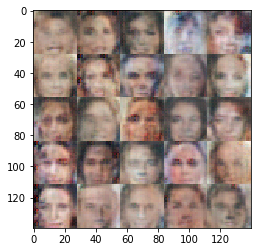

Epoch 1/1... Discriminator Loss: 1.2645... Generator Loss: 0.5857
Epoch 1/1... Discriminator Loss: 1.1143... Generator Loss: 1.0458
Epoch 1/1... Discriminator Loss: 1.2909... Generator Loss: 0.6197
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 1.3075
Epoch 1/1... Discriminator Loss: 1.6537... Generator Loss: 0.2663
Epoch 1/1... Discriminator Loss: 1.3561... Generator Loss: 1.2785
Epoch 1/1... Discriminator Loss: 1.0372... Generator Loss: 1.0078
Epoch 1/1... Discriminator Loss: 1.1788... Generator Loss: 0.6188
Epoch 1/1... Discriminator Loss: 0.9772... Generator Loss: 1.2206
Epoch 1/1... Discriminator Loss: 0.6990... Generator Loss: 1.3171


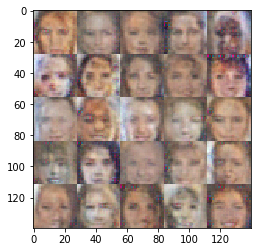

Epoch 1/1... Discriminator Loss: 0.4691... Generator Loss: 1.5235
Epoch 1/1... Discriminator Loss: 0.9231... Generator Loss: 0.5941
Epoch 1/1... Discriminator Loss: 2.8627... Generator Loss: 2.9897
Epoch 1/1... Discriminator Loss: 1.1551... Generator Loss: 0.4280
Epoch 1/1... Discriminator Loss: 1.1886... Generator Loss: 1.2559
Epoch 1/1... Discriminator Loss: 1.0300... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.2844... Generator Loss: 0.4312
Epoch 1/1... Discriminator Loss: 1.3256... Generator Loss: 1.8235
Epoch 1/1... Discriminator Loss: 1.1247... Generator Loss: 0.6801
Epoch 1/1... Discriminator Loss: 1.7231... Generator Loss: 0.3586


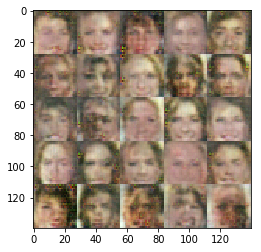

Epoch 1/1... Discriminator Loss: 2.1721... Generator Loss: 2.2543
Epoch 1/1... Discriminator Loss: 1.2612... Generator Loss: 0.9806
Epoch 1/1... Discriminator Loss: 1.3439... Generator Loss: 0.5034
Epoch 1/1... Discriminator Loss: 1.3201... Generator Loss: 0.7786
Epoch 1/1... Discriminator Loss: 1.4294... Generator Loss: 1.1025
Epoch 1/1... Discriminator Loss: 1.5104... Generator Loss: 0.4412
Epoch 1/1... Discriminator Loss: 1.6859... Generator Loss: 1.2767
Epoch 1/1... Discriminator Loss: 1.3036... Generator Loss: 0.7337
Epoch 1/1... Discriminator Loss: 1.2144... Generator Loss: 0.6738
Epoch 1/1... Discriminator Loss: 1.0772... Generator Loss: 0.8753


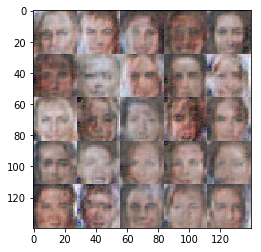

Epoch 1/1... Discriminator Loss: 1.2657... Generator Loss: 0.8702
Epoch 1/1... Discriminator Loss: 1.5029... Generator Loss: 0.4858
Epoch 1/1... Discriminator Loss: 1.4937... Generator Loss: 1.3393
Epoch 1/1... Discriminator Loss: 1.1032... Generator Loss: 0.8622
Epoch 1/1... Discriminator Loss: 0.9670... Generator Loss: 1.1147
Epoch 1/1... Discriminator Loss: 0.9265... Generator Loss: 1.0417
Epoch 1/1... Discriminator Loss: 0.7889... Generator Loss: 1.1203
Epoch 1/1... Discriminator Loss: 1.2496... Generator Loss: 0.4971
Epoch 1/1... Discriminator Loss: 1.9978... Generator Loss: 2.3546
Epoch 1/1... Discriminator Loss: 1.1699... Generator Loss: 0.9052


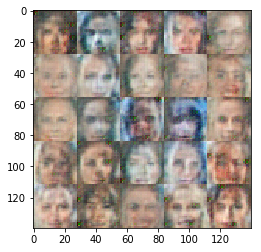

Epoch 1/1... Discriminator Loss: 1.2694... Generator Loss: 0.4173
Epoch 1/1... Discriminator Loss: 0.9488... Generator Loss: 1.2989
Epoch 1/1... Discriminator Loss: 1.0218... Generator Loss: 0.7903
Epoch 1/1... Discriminator Loss: 0.9699... Generator Loss: 0.7941
Epoch 1/1... Discriminator Loss: 1.1607... Generator Loss: 1.2498
Epoch 1/1... Discriminator Loss: 0.6325... Generator Loss: 1.1488
Epoch 1/1... Discriminator Loss: 1.1053... Generator Loss: 0.5155
Epoch 1/1... Discriminator Loss: 2.0705... Generator Loss: 2.2377
Epoch 1/1... Discriminator Loss: 1.3371... Generator Loss: 0.5643
Epoch 1/1... Discriminator Loss: 1.8500... Generator Loss: 0.3164


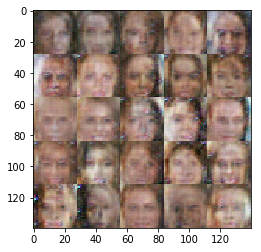

Epoch 1/1... Discriminator Loss: 1.8411... Generator Loss: 1.6443
Epoch 1/1... Discriminator Loss: 1.2838... Generator Loss: 0.8843
Epoch 1/1... Discriminator Loss: 1.9255... Generator Loss: 0.2600
Epoch 1/1... Discriminator Loss: 1.3575... Generator Loss: 1.7976
Epoch 1/1... Discriminator Loss: 0.9825... Generator Loss: 1.2730
Epoch 1/1... Discriminator Loss: 1.4607... Generator Loss: 0.4486
Epoch 1/1... Discriminator Loss: 1.3672... Generator Loss: 1.1847
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.5917
Epoch 1/1... Discriminator Loss: 1.2974... Generator Loss: 1.3433
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.7630


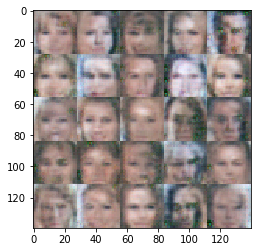

Epoch 1/1... Discriminator Loss: 1.1611... Generator Loss: 0.7557
Epoch 1/1... Discriminator Loss: 1.2660... Generator Loss: 0.7345
Epoch 1/1... Discriminator Loss: 1.5652... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 1.3992... Generator Loss: 0.4919
Epoch 1/1... Discriminator Loss: 1.3291... Generator Loss: 0.7306
Epoch 1/1... Discriminator Loss: 1.0744... Generator Loss: 2.1071
Epoch 1/1... Discriminator Loss: 1.3479... Generator Loss: 0.4287
Epoch 1/1... Discriminator Loss: 1.6930... Generator Loss: 1.9393
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.5460
Epoch 1/1... Discriminator Loss: 1.0667... Generator Loss: 0.8748


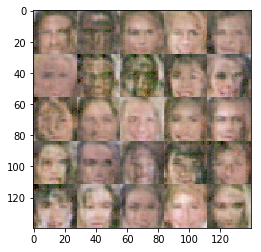

Epoch 1/1... Discriminator Loss: 1.0647... Generator Loss: 0.8668
Epoch 1/1... Discriminator Loss: 0.9539... Generator Loss: 1.1199
Epoch 1/1... Discriminator Loss: 1.2988... Generator Loss: 0.6203
Epoch 1/1... Discriminator Loss: 1.0981... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.1487... Generator Loss: 1.6596
Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.4042
Epoch 1/1... Discriminator Loss: 1.1683... Generator Loss: 0.8647
Epoch 1/1... Discriminator Loss: 1.2098... Generator Loss: 0.9646
Epoch 1/1... Discriminator Loss: 0.9195... Generator Loss: 2.3982
Epoch 1/1... Discriminator Loss: 1.1762... Generator Loss: 0.4530


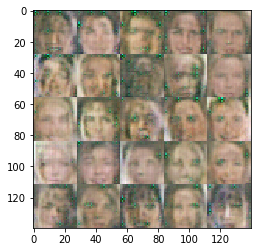

Epoch 1/1... Discriminator Loss: 1.5211... Generator Loss: 1.4343
Epoch 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.6134
Epoch 1/1... Discriminator Loss: 0.7001... Generator Loss: 0.9556
Epoch 1/1... Discriminator Loss: 0.8555... Generator Loss: 0.9013
Epoch 1/1... Discriminator Loss: 1.0404... Generator Loss: 1.6689
Epoch 1/1... Discriminator Loss: 1.0803... Generator Loss: 0.5369
Epoch 1/1... Discriminator Loss: 1.1314... Generator Loss: 1.8642
Epoch 1/1... Discriminator Loss: 1.8518... Generator Loss: 0.2350
Epoch 1/1... Discriminator Loss: 1.6281... Generator Loss: 1.5059
Epoch 1/1... Discriminator Loss: 1.5549... Generator Loss: 0.5797


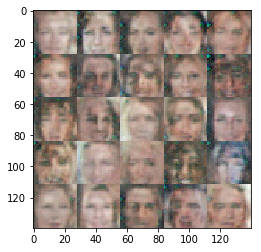

Epoch 1/1... Discriminator Loss: 1.7134... Generator Loss: 0.4221
Epoch 1/1... Discriminator Loss: 1.7496... Generator Loss: 0.8625
Epoch 1/1... Discriminator Loss: 1.9022... Generator Loss: 0.5519
Epoch 1/1... Discriminator Loss: 1.7508... Generator Loss: 0.4664
Epoch 1/1... Discriminator Loss: 1.4740... Generator Loss: 0.9545
Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 0.9191
Epoch 1/1... Discriminator Loss: 1.4478... Generator Loss: 0.6334
Epoch 1/1... Discriminator Loss: 1.4731... Generator Loss: 0.8110
Epoch 1/1... Discriminator Loss: 1.5771... Generator Loss: 0.7940
Epoch 1/1... Discriminator Loss: 1.4665... Generator Loss: 0.7909


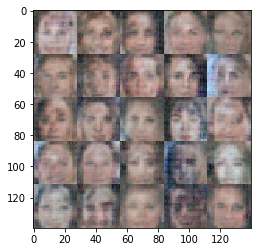

Epoch 1/1... Discriminator Loss: 1.4033... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 1.3151... Generator Loss: 0.8196
Epoch 1/1... Discriminator Loss: 1.3618... Generator Loss: 0.7399
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.7966
Epoch 1/1... Discriminator Loss: 1.3364... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.3676... Generator Loss: 0.7201
Epoch 1/1... Discriminator Loss: 1.3647... Generator Loss: 0.7393
Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.8860
Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 0.7885
Epoch 1/1... Discriminator Loss: 1.2603... Generator Loss: 0.8572


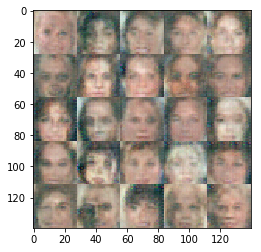

Epoch 1/1... Discriminator Loss: 1.2790... Generator Loss: 0.8067
Epoch 1/1... Discriminator Loss: 1.2154... Generator Loss: 0.8825
Epoch 1/1... Discriminator Loss: 1.2211... Generator Loss: 0.7398
Epoch 1/1... Discriminator Loss: 1.3078... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 1.3660... Generator Loss: 0.7940
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.3353... Generator Loss: 0.8771
Epoch 1/1... Discriminator Loss: 1.3287... Generator Loss: 0.7412
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.9245
Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.7657


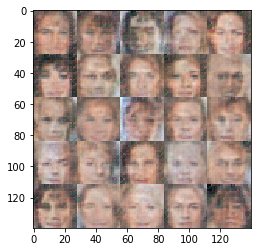

Epoch 1/1... Discriminator Loss: 1.3700... Generator Loss: 0.8992
Epoch 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.7172
Epoch 1/1... Discriminator Loss: 1.2828... Generator Loss: 0.8671
Epoch 1/1... Discriminator Loss: 1.2702... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 1.3219... Generator Loss: 1.1653
Epoch 1/1... Discriminator Loss: 1.3739... Generator Loss: 0.5184
Epoch 1/1... Discriminator Loss: 1.3051... Generator Loss: 1.0022
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.8391
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.5999
Epoch 1/1... Discriminator Loss: 1.1966... Generator Loss: 0.8491


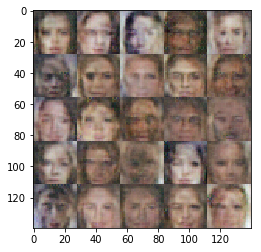

Epoch 1/1... Discriminator Loss: 1.2266... Generator Loss: 0.7821
Epoch 1/1... Discriminator Loss: 1.2054... Generator Loss: 0.7128
Epoch 1/1... Discriminator Loss: 1.2424... Generator Loss: 0.9019
Epoch 1/1... Discriminator Loss: 1.3066... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.1111... Generator Loss: 0.7792
Epoch 1/1... Discriminator Loss: 1.0714... Generator Loss: 0.7675
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.9557
Epoch 1/1... Discriminator Loss: 1.2068... Generator Loss: 0.6258
Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 1.2506
Epoch 1/1... Discriminator Loss: 1.5700... Generator Loss: 0.3814


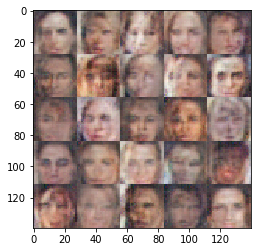

Epoch 1/1... Discriminator Loss: 1.2886... Generator Loss: 1.2584
Epoch 1/1... Discriminator Loss: 1.1606... Generator Loss: 0.7352
Epoch 1/1... Discriminator Loss: 1.0444... Generator Loss: 1.2067
Epoch 1/1... Discriminator Loss: 1.1979... Generator Loss: 0.5277
Epoch 1/1... Discriminator Loss: 1.3446... Generator Loss: 1.7584
Epoch 1/1... Discriminator Loss: 1.4575... Generator Loss: 0.3779
Epoch 1/1... Discriminator Loss: 1.3722... Generator Loss: 0.9865
Epoch 1/1... Discriminator Loss: 1.1745... Generator Loss: 0.8015
Epoch 1/1... Discriminator Loss: 0.8147... Generator Loss: 1.3033
Epoch 1/1... Discriminator Loss: 0.9027... Generator Loss: 0.7720


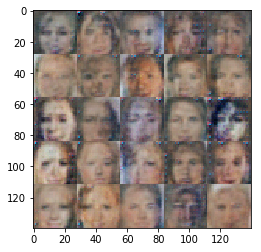

Epoch 1/1... Discriminator Loss: 1.0689... Generator Loss: 0.6588
Epoch 1/1... Discriminator Loss: 0.7956... Generator Loss: 2.1425
Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 0.3905
Epoch 1/1... Discriminator Loss: 1.1390... Generator Loss: 1.0713
Epoch 1/1... Discriminator Loss: 0.9787... Generator Loss: 0.9622
Epoch 1/1... Discriminator Loss: 0.9621... Generator Loss: 1.1597
Epoch 1/1... Discriminator Loss: 0.7577... Generator Loss: 0.9205
Epoch 1/1... Discriminator Loss: 1.0372... Generator Loss: 0.8134
Epoch 1/1... Discriminator Loss: 1.3091... Generator Loss: 1.6104
Epoch 1/1... Discriminator Loss: 2.2902... Generator Loss: 0.1344


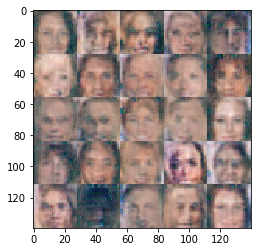

Epoch 1/1... Discriminator Loss: 3.4066... Generator Loss: 3.1627
Epoch 1/1... Discriminator Loss: 1.7983... Generator Loss: 1.3043
Epoch 1/1... Discriminator Loss: 1.6171... Generator Loss: 0.4678
Epoch 1/1... Discriminator Loss: 1.5679... Generator Loss: 0.4250
Epoch 1/1... Discriminator Loss: 1.3116... Generator Loss: 0.8191
Epoch 1/1... Discriminator Loss: 1.3666... Generator Loss: 0.9100
Epoch 1/1... Discriminator Loss: 1.4778... Generator Loss: 0.7858
Epoch 1/1... Discriminator Loss: 1.4085... Generator Loss: 0.6602
Epoch 1/1... Discriminator Loss: 1.3895... Generator Loss: 0.7108
Epoch 1/1... Discriminator Loss: 1.2998... Generator Loss: 0.8233


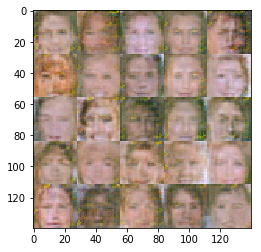

Epoch 1/1... Discriminator Loss: 1.3768... Generator Loss: 0.8738
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.6122
Epoch 1/1... Discriminator Loss: 1.4921... Generator Loss: 0.7339
Epoch 1/1... Discriminator Loss: 1.5022... Generator Loss: 0.7350
Epoch 1/1... Discriminator Loss: 1.5297... Generator Loss: 0.7598
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.8434
Epoch 1/1... Discriminator Loss: 1.3438... Generator Loss: 0.7769
Epoch 1/1... Discriminator Loss: 1.2881... Generator Loss: 0.7451
Epoch 1/1... Discriminator Loss: 1.3452... Generator Loss: 0.7932
Epoch 1/1... Discriminator Loss: 1.4113... Generator Loss: 0.8023


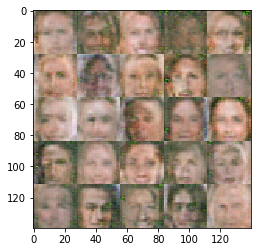

Epoch 1/1... Discriminator Loss: 1.3773... Generator Loss: 0.8041
Epoch 1/1... Discriminator Loss: 1.3819... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.4147... Generator Loss: 0.7637
Epoch 1/1... Discriminator Loss: 1.3436... Generator Loss: 0.9209
Epoch 1/1... Discriminator Loss: 1.4826... Generator Loss: 0.7198
Epoch 1/1... Discriminator Loss: 1.4937... Generator Loss: 0.6505
Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.6021
Epoch 1/1... Discriminator Loss: 1.3164... Generator Loss: 0.9088
Epoch 1/1... Discriminator Loss: 1.2962... Generator Loss: 0.8122
Epoch 1/1... Discriminator Loss: 1.2668... Generator Loss: 0.7811


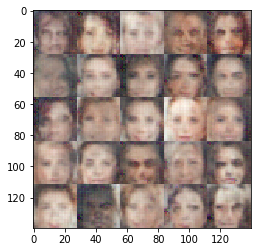

Epoch 1/1... Discriminator Loss: 1.3435... Generator Loss: 0.7044
Epoch 1/1... Discriminator Loss: 1.3334... Generator Loss: 0.8817
Epoch 1/1... Discriminator Loss: 1.3158... Generator Loss: 0.7530
Epoch 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.6913
Epoch 1/1... Discriminator Loss: 1.2411... Generator Loss: 0.8059
Epoch 1/1... Discriminator Loss: 1.2942... Generator Loss: 0.7703
Epoch 1/1... Discriminator Loss: 1.4500... Generator Loss: 0.6282
Epoch 1/1... Discriminator Loss: 1.4736... Generator Loss: 0.6906
Epoch 1/1... Discriminator Loss: 1.4796... Generator Loss: 0.6473
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.6865


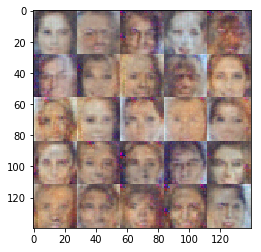

Epoch 1/1... Discriminator Loss: 1.3893... Generator Loss: 0.7705
Epoch 1/1... Discriminator Loss: 1.4438... Generator Loss: 0.6801
Epoch 1/1... Discriminator Loss: 1.3471... Generator Loss: 0.7225
Epoch 1/1... Discriminator Loss: 1.3048... Generator Loss: 0.7273
Epoch 1/1... Discriminator Loss: 1.2663... Generator Loss: 0.7748
Epoch 1/1... Discriminator Loss: 1.3254... Generator Loss: 0.7514
Epoch 1/1... Discriminator Loss: 1.3455... Generator Loss: 0.8153
Epoch 1/1... Discriminator Loss: 1.3906... Generator Loss: 0.7315
Epoch 1/1... Discriminator Loss: 1.4108... Generator Loss: 0.7133
Epoch 1/1... Discriminator Loss: 1.4354... Generator Loss: 0.7403


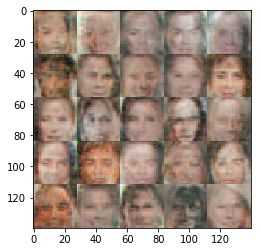

Epoch 1/1... Discriminator Loss: 1.3963... Generator Loss: 0.9310
Epoch 1/1... Discriminator Loss: 1.3747... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 1.3692... Generator Loss: 0.6884
Epoch 1/1... Discriminator Loss: 1.3934... Generator Loss: 0.7091
Epoch 1/1... Discriminator Loss: 1.3171... Generator Loss: 0.9220
Epoch 1/1... Discriminator Loss: 1.3080... Generator Loss: 0.6327
Epoch 1/1... Discriminator Loss: 1.3246... Generator Loss: 0.7453
Epoch 1/1... Discriminator Loss: 1.3506... Generator Loss: 0.7265
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.7114
Epoch 1/1... Discriminator Loss: 1.4758... Generator Loss: 0.6726


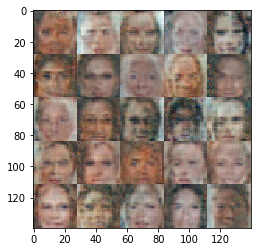

Epoch 1/1... Discriminator Loss: 1.4185... Generator Loss: 0.6711
Epoch 1/1... Discriminator Loss: 1.4965... Generator Loss: 0.6953
Epoch 1/1... Discriminator Loss: 1.4768... Generator Loss: 0.7091
Epoch 1/1... Discriminator Loss: 1.4000... Generator Loss: 0.5924
Epoch 1/1... Discriminator Loss: 1.4254... Generator Loss: 0.7981
Epoch 1/1... Discriminator Loss: 1.2878... Generator Loss: 0.7919
Epoch 1/1... Discriminator Loss: 1.2167... Generator Loss: 0.7348
Epoch 1/1... Discriminator Loss: 1.2047... Generator Loss: 0.8869
Epoch 1/1... Discriminator Loss: 1.2161... Generator Loss: 0.7298
Epoch 1/1... Discriminator Loss: 1.2982... Generator Loss: 0.7732


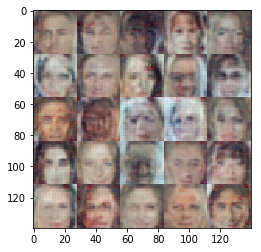

Epoch 1/1... Discriminator Loss: 1.3589... Generator Loss: 0.8260
Epoch 1/1... Discriminator Loss: 1.4730... Generator Loss: 0.5013
Epoch 1/1... Discriminator Loss: 1.4617... Generator Loss: 0.8640
Epoch 1/1... Discriminator Loss: 1.3743... Generator Loss: 0.6129
Epoch 1/1... Discriminator Loss: 1.3017... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.2374... Generator Loss: 0.8114
Epoch 1/1... Discriminator Loss: 1.2303... Generator Loss: 0.9260
Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 0.7404
Epoch 1/1... Discriminator Loss: 1.2079... Generator Loss: 0.7822
Epoch 1/1... Discriminator Loss: 1.2194... Generator Loss: 0.7686


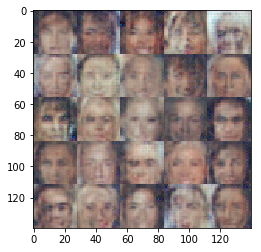

Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.7564
Epoch 1/1... Discriminator Loss: 1.4266... Generator Loss: 0.8758
Epoch 1/1... Discriminator Loss: 1.3440... Generator Loss: 0.6391
Epoch 1/1... Discriminator Loss: 1.5132... Generator Loss: 0.4712
Epoch 1/1... Discriminator Loss: 1.4989... Generator Loss: 0.9409
Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.6772
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.3711... Generator Loss: 0.8932
Epoch 1/1... Discriminator Loss: 1.3667... Generator Loss: 0.5058
Epoch 1/1... Discriminator Loss: 1.3471... Generator Loss: 0.9746


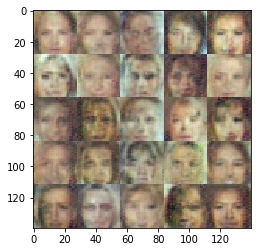

Epoch 1/1... Discriminator Loss: 1.3750... Generator Loss: 0.9162
Epoch 1/1... Discriminator Loss: 1.4356... Generator Loss: 0.6363
Epoch 1/1... Discriminator Loss: 1.3827... Generator Loss: 0.6466
Epoch 1/1... Discriminator Loss: 1.3242... Generator Loss: 0.9162
Epoch 1/1... Discriminator Loss: 1.2481... Generator Loss: 0.6676
Epoch 1/1... Discriminator Loss: 1.2258... Generator Loss: 0.8694
Epoch 1/1... Discriminator Loss: 1.1660... Generator Loss: 0.8988
Epoch 1/1... Discriminator Loss: 1.2674... Generator Loss: 0.6196
Epoch 1/1... Discriminator Loss: 1.2348... Generator Loss: 0.8717
Epoch 1/1... Discriminator Loss: 1.2658... Generator Loss: 0.7526


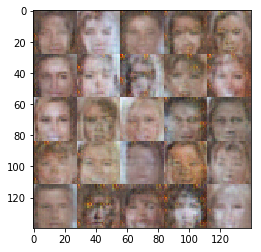

Epoch 1/1... Discriminator Loss: 1.4032... Generator Loss: 0.5985
Epoch 1/1... Discriminator Loss: 1.3160... Generator Loss: 0.7003
Epoch 1/1... Discriminator Loss: 1.5278... Generator Loss: 0.7427
Epoch 1/1... Discriminator Loss: 1.5802... Generator Loss: 0.7530
Epoch 1/1... Discriminator Loss: 1.4816... Generator Loss: 0.5200
Epoch 1/1... Discriminator Loss: 1.3471... Generator Loss: 1.1366
Epoch 1/1... Discriminator Loss: 1.2771... Generator Loss: 0.7354
Epoch 1/1... Discriminator Loss: 1.1581... Generator Loss: 0.9317
Epoch 1/1... Discriminator Loss: 1.4793... Generator Loss: 0.4536
Epoch 1/1... Discriminator Loss: 1.1659... Generator Loss: 0.9072


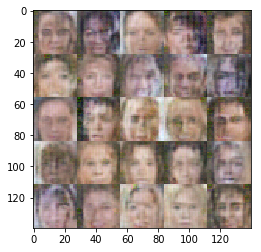

Epoch 1/1... Discriminator Loss: 1.1116... Generator Loss: 1.0491
Epoch 1/1... Discriminator Loss: 1.1957... Generator Loss: 0.5274
Epoch 1/1... Discriminator Loss: 0.9753... Generator Loss: 0.8760
Epoch 1/1... Discriminator Loss: 1.2477... Generator Loss: 1.3298
Epoch 1/1... Discriminator Loss: 1.2590... Generator Loss: 0.7953
Epoch 1/1... Discriminator Loss: 1.4566... Generator Loss: 0.4630
Epoch 1/1... Discriminator Loss: 1.7242... Generator Loss: 1.6766
Epoch 1/1... Discriminator Loss: 1.4960... Generator Loss: 0.4503
Epoch 1/1... Discriminator Loss: 1.4354... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 0.8693


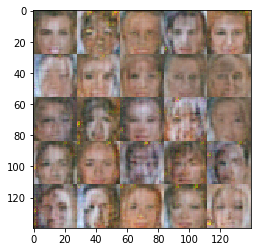

Epoch 1/1... Discriminator Loss: 1.2827... Generator Loss: 0.6431
Epoch 1/1... Discriminator Loss: 1.1843... Generator Loss: 0.6935
Epoch 1/1... Discriminator Loss: 1.2450... Generator Loss: 0.8054
Epoch 1/1... Discriminator Loss: 1.3106... Generator Loss: 0.6910
Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 0.7998
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 1.0831
Epoch 1/1... Discriminator Loss: 1.6056... Generator Loss: 0.3338
Epoch 1/1... Discriminator Loss: 1.3681... Generator Loss: 0.8678
Epoch 1/1... Discriminator Loss: 1.3662... Generator Loss: 0.8914
Epoch 1/1... Discriminator Loss: 1.3615... Generator Loss: 0.5870


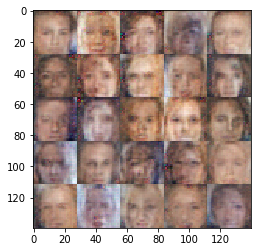

Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.5310
Epoch 1/1... Discriminator Loss: 1.3695... Generator Loss: 0.7963
Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 1.2251... Generator Loss: 0.8559
Epoch 1/1... Discriminator Loss: 1.2504... Generator Loss: 0.8542
Epoch 1/1... Discriminator Loss: 1.4146... Generator Loss: 0.5700
Epoch 1/1... Discriminator Loss: 1.4333... Generator Loss: 0.9488
Epoch 1/1... Discriminator Loss: 1.4636... Generator Loss: 0.5040
Epoch 1/1... Discriminator Loss: 1.3406... Generator Loss: 0.7984
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.7317


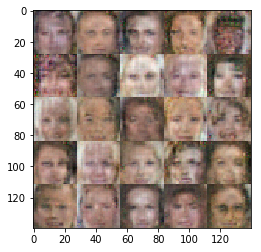

Epoch 1/1... Discriminator Loss: 1.1798... Generator Loss: 1.0063
Epoch 1/1... Discriminator Loss: 0.9472... Generator Loss: 1.2953
Epoch 1/1... Discriminator Loss: 1.2234... Generator Loss: 0.5775
Epoch 1/1... Discriminator Loss: 1.0933... Generator Loss: 1.2266
Epoch 1/1... Discriminator Loss: 1.1020... Generator Loss: 0.8768
Epoch 1/1... Discriminator Loss: 1.0256... Generator Loss: 0.7976
Epoch 1/1... Discriminator Loss: 1.1368... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 1.1212... Generator Loss: 0.9030
Epoch 1/1... Discriminator Loss: 1.2084... Generator Loss: 0.7149
Epoch 1/1... Discriminator Loss: 1.1631... Generator Loss: 0.7353


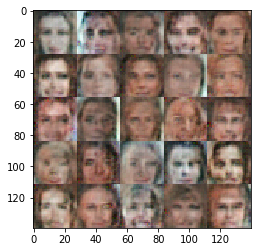

Epoch 1/1... Discriminator Loss: 1.7407... Generator Loss: 1.5524
Epoch 1/1... Discriminator Loss: 1.8886... Generator Loss: 0.2093
Epoch 1/1... Discriminator Loss: 1.3545... Generator Loss: 0.8784
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 1.1345
Epoch 1/1... Discriminator Loss: 1.1588... Generator Loss: 0.6128
Epoch 1/1... Discriminator Loss: 1.0980... Generator Loss: 1.1392
Epoch 1/1... Discriminator Loss: 1.2082... Generator Loss: 0.7101
Epoch 1/1... Discriminator Loss: 1.1535... Generator Loss: 0.7730
Epoch 1/1... Discriminator Loss: 1.2067... Generator Loss: 1.1212
Epoch 1/1... Discriminator Loss: 1.6567... Generator Loss: 0.3196


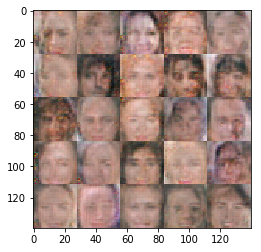

Epoch 1/1... Discriminator Loss: 1.4460... Generator Loss: 1.3730
Epoch 1/1... Discriminator Loss: 1.2197... Generator Loss: 0.7888
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 0.5296
Epoch 1/1... Discriminator Loss: 1.8518... Generator Loss: 1.6830
Epoch 1/1... Discriminator Loss: 1.2520... Generator Loss: 0.9266
Epoch 1/1... Discriminator Loss: 1.1994... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.1632... Generator Loss: 0.9634
Epoch 1/1... Discriminator Loss: 1.0456... Generator Loss: 0.6746
Epoch 1/1... Discriminator Loss: 1.0575... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 1.6575... Generator Loss: 1.7450


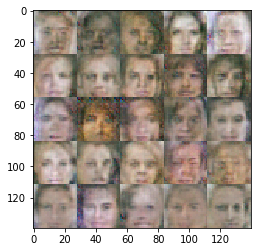

Epoch 1/1... Discriminator Loss: 1.2978... Generator Loss: 0.5887
Epoch 1/1... Discriminator Loss: 1.6327... Generator Loss: 0.4313
Epoch 1/1... Discriminator Loss: 1.6110... Generator Loss: 1.5351
Epoch 1/1... Discriminator Loss: 1.1562... Generator Loss: 0.8088
Epoch 1/1... Discriminator Loss: 0.7480... Generator Loss: 1.6611
Epoch 1/1... Discriminator Loss: 0.8409... Generator Loss: 0.8804
Epoch 1/1... Discriminator Loss: 0.8558... Generator Loss: 0.8461
Epoch 1/1... Discriminator Loss: 0.7961... Generator Loss: 1.1381
Epoch 1/1... Discriminator Loss: 1.0599... Generator Loss: 0.7782
Epoch 1/1... Discriminator Loss: 1.2332... Generator Loss: 1.7208


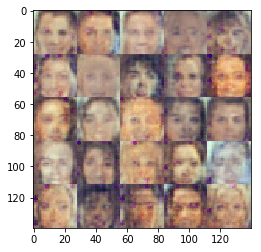

Epoch 1/1... Discriminator Loss: 1.1552... Generator Loss: 0.5183
Epoch 1/1... Discriminator Loss: 1.7481... Generator Loss: 1.3743
Epoch 1/1... Discriminator Loss: 1.6920... Generator Loss: 0.2731
Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 1.7975
Epoch 1/1... Discriminator Loss: 1.2919... Generator Loss: 0.6462
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.6304
Epoch 1/1... Discriminator Loss: 1.2311... Generator Loss: 1.1476
Epoch 1/1... Discriminator Loss: 1.5596... Generator Loss: 0.3914
Epoch 1/1... Discriminator Loss: 1.1988... Generator Loss: 1.4136
Epoch 1/1... Discriminator Loss: 1.1935... Generator Loss: 0.6172


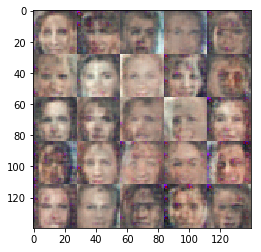

Epoch 1/1... Discriminator Loss: 1.0207... Generator Loss: 1.1938
Epoch 1/1... Discriminator Loss: 0.8086... Generator Loss: 1.2991
Epoch 1/1... Discriminator Loss: 1.1496... Generator Loss: 0.5695
Epoch 1/1... Discriminator Loss: 1.9460... Generator Loss: 1.8109
Epoch 1/1... Discriminator Loss: 1.2071... Generator Loss: 0.5977
Epoch 1/1... Discriminator Loss: 1.3337... Generator Loss: 0.5256
Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 1.2493
Epoch 1/1... Discriminator Loss: 1.2071... Generator Loss: 0.6858
Epoch 1/1... Discriminator Loss: 0.8378... Generator Loss: 1.6924
Epoch 1/1... Discriminator Loss: 0.9238... Generator Loss: 0.8858


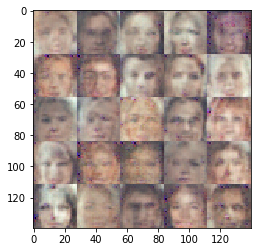

Epoch 1/1... Discriminator Loss: 0.8350... Generator Loss: 1.6943
Epoch 1/1... Discriminator Loss: 1.0585... Generator Loss: 0.5550
Epoch 1/1... Discriminator Loss: 1.3044... Generator Loss: 1.2833
Epoch 1/1... Discriminator Loss: 1.3068... Generator Loss: 0.5929
Epoch 1/1... Discriminator Loss: 1.1529... Generator Loss: 1.9802
Epoch 1/1... Discriminator Loss: 1.0329... Generator Loss: 0.7430
Epoch 1/1... Discriminator Loss: 0.8058... Generator Loss: 1.5878
Epoch 1/1... Discriminator Loss: 0.7268... Generator Loss: 0.9111
Epoch 1/1... Discriminator Loss: 0.6728... Generator Loss: 1.1497
Epoch 1/1... Discriminator Loss: 1.0340... Generator Loss: 0.7197


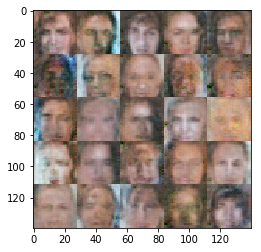

Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 1.7371
Epoch 1/1... Discriminator Loss: 1.0239... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 1.2338... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.0191... Generator Loss: 0.9970
Epoch 1/1... Discriminator Loss: 1.4830... Generator Loss: 0.3754
Epoch 1/1... Discriminator Loss: 1.6810... Generator Loss: 1.3157
Epoch 1/1... Discriminator Loss: 2.2756... Generator Loss: 0.2450
Epoch 1/1... Discriminator Loss: 1.8017... Generator Loss: 1.8698
Epoch 1/1... Discriminator Loss: 1.4691... Generator Loss: 0.7180
Epoch 1/1... Discriminator Loss: 1.7123... Generator Loss: 0.4316


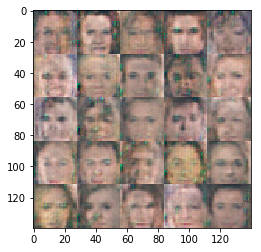

Epoch 1/1... Discriminator Loss: 1.7093... Generator Loss: 0.5881
Epoch 1/1... Discriminator Loss: 1.3727... Generator Loss: 1.0530
Epoch 1/1... Discriminator Loss: 1.2974... Generator Loss: 0.7643
Epoch 1/1... Discriminator Loss: 1.2867... Generator Loss: 0.6435
Epoch 1/1... Discriminator Loss: 1.3953... Generator Loss: 0.7638
Epoch 1/1... Discriminator Loss: 1.3883... Generator Loss: 0.7423
Epoch 1/1... Discriminator Loss: 1.4050... Generator Loss: 0.6042
Epoch 1/1... Discriminator Loss: 1.3513... Generator Loss: 0.7300
Epoch 1/1... Discriminator Loss: 1.2364... Generator Loss: 0.8137
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.7488


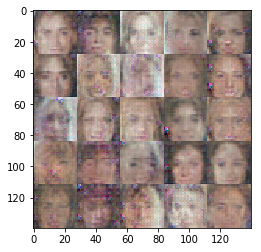

Epoch 1/1... Discriminator Loss: 1.4463... Generator Loss: 0.8077
Epoch 1/1... Discriminator Loss: 1.4114... Generator Loss: 0.5672
Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.5666
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.9083
Epoch 1/1... Discriminator Loss: 1.3338... Generator Loss: 0.7987
Epoch 1/1... Discriminator Loss: 1.2568... Generator Loss: 0.8648
Epoch 1/1... Discriminator Loss: 1.2683... Generator Loss: 0.8298
Epoch 1/1... Discriminator Loss: 1.2864... Generator Loss: 0.6780
Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 0.9397
Epoch 1/1... Discriminator Loss: 1.2841... Generator Loss: 0.8064


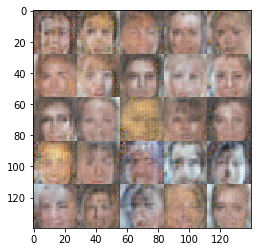

Epoch 1/1... Discriminator Loss: 1.2084... Generator Loss: 0.6497
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 0.8166
Epoch 1/1... Discriminator Loss: 1.2444... Generator Loss: 0.8207
Epoch 1/1... Discriminator Loss: 1.3730... Generator Loss: 0.5181
Epoch 1/1... Discriminator Loss: 1.1971... Generator Loss: 0.7892
Epoch 1/1... Discriminator Loss: 1.3207... Generator Loss: 0.9059


In [ ]:
batch_size = 128
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.